In [200]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ARIMA Model
# FIT the ARIMA model for Apple's opening prices
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
import math
import pickle


In [134]:
# Load the dataset

file_path = r"C:\Users\chimi\Desktop\Python Data Science Projects\stock_market_faang_analysis\task1dataextraction\faang_stock.csv"

faang_stock_df = pd.read_csv(file_path)

# Display the first few rows
faang_stock_df.head(5)

,Price,Adj Close,Adj Close.1,Adj Close.2,Adj Close.3,Adj Close.4,Close,Close.1,Close.2,Close.3,...,Open,Open.1,Open.2,Open.3,Open.4,Volume,Volume.1,Volume.2,Volume.3,Volume.4
0,Ticker,AAPL,AMZN,GOOGL,META,NFLX,AAPL,AMZN,GOOGL,META,...,AAPL,AMZN,GOOGL,META,NFLX,AAPL,AMZN,GOOGL,META,NFLX
1,Date,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-01-02,72.96045684814453,94.90049743652344,68.43399810791016,209.55764770507812,329.80999755859375,75.0875015258789,94.90049743652344,68.43399810791016,209.77999877929688,...,74.05999755859375,93.75,67.42050170898438,206.75,326.1000061035156,135480400,80580000,27278000,12077100,4485800
3,2020-01-03,72.25113677978516,93.74849700927734,68.07599639892578,208.44883728027344,325.8999938964844,74.35749816894531,93.74849700927734,68.07599639892578,208.6699981689453,...,74.2874984741211,93.2249984741211,67.4000015258789,207.2100067138672,326.7799987792969,146322800,75288000,23408000,11188400,3806900
4,2020-01-06,72.82687377929688,95.14399719238281,69.8905029296875,212.3746795654297,335.8299865722656,74.94999694824219,95.14399719238281,69.8905029296875,212.60000610351562,...,73.44750213623047,93.0,67.58149719238281,206.6999969482422,323.1199951171875,118387200,81236000,46768000,17058900,5663100


In [135]:
# Check for number of rows and columns
faang_stock_df.shape

(1008, 31)

In [136]:
# Check for data types 
faang_stock_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1008 entries, 0 to 1007
Data columns (total 31 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Price        1008 non-null   object
 1   Adj Close    1007 non-null   object
 2   Adj Close.1  1007 non-null   object
 3   Adj Close.2  1007 non-null   object
 4   Adj Close.3  1007 non-null   object
 5   Adj Close.4  1007 non-null   object
 6   Close        1007 non-null   object
 7   Close.1      1007 non-null   object
 8   Close.2      1007 non-null   object
 9   Close.3      1007 non-null   object
 10  Close.4      1007 non-null   object
 11  High         1007 non-null   object
 12  High.1       1007 non-null   object
 13  High.2       1007 non-null   object
 14  High.3       1007 non-null   object
 15  High.4       1007 non-null   object
 16  Low          1007 non-null   object
 17  Low.1        1007 non-null   object
 18  Low.2        1007 non-null   object
 19  Low.3        1007 non-null 

In [137]:
# Column names
faang_stock_df.columns

Index(['Price', 'Adj Close', 'Adj Close.1', 'Adj Close.2', 'Adj Close.3',
       'Adj Close.4', 'Close', 'Close.1', 'Close.2', 'Close.3', 'Close.4',
       'High', 'High.1', 'High.2', 'High.3', 'High.4', 'Low', 'Low.1', 'Low.2',
       'Low.3', 'Low.4', 'Open', 'Open.1', 'Open.2', 'Open.3', 'Open.4',
       'Volume', 'Volume.1', 'Volume.2', 'Volume.3', 'Volume.4'],
      dtype='object')

In [138]:
# Remove the first two rows and set proper column headers
faang_stock_df.columns = faang_stock_df.iloc[0]
faang_stock_df = faang_stock_df.drop([0, 1]).reset_index(drop=True)

In [139]:
# Preview the new df
faang_stock_df.head(5)

,Ticker,AAPL,AMZN,GOOGL,META,NFLX,AAPL,AMZN,GOOGL,META,...,AAPL,AMZN,GOOGL,META,NFLX,AAPL,AMZN,GOOGL,META,NFLX
0,2020-01-02,72.96045684814453,94.90049743652344,68.43399810791016,209.55764770507812,329.80999755859375,75.0875015258789,94.90049743652344,68.43399810791016,209.77999877929688,...,74.05999755859375,93.75,67.42050170898438,206.75,326.1000061035156,135480400,80580000,27278000,12077100,4485800
1,2020-01-03,72.25113677978516,93.74849700927734,68.07599639892578,208.44883728027344,325.8999938964844,74.35749816894531,93.74849700927734,68.07599639892578,208.6699981689453,...,74.2874984741211,93.2249984741211,67.4000015258789,207.2100067138672,326.7799987792969,146322800,75288000,23408000,11188400,3806900
2,2020-01-06,72.82687377929688,95.14399719238281,69.8905029296875,212.3746795654297,335.8299865722656,74.94999694824219,95.14399719238281,69.8905029296875,212.60000610351562,...,73.44750213623047,93.0,67.58149719238281,206.6999969482422,323.1199951171875,118387200,81236000,46768000,17058900,5663100
3,2020-01-07,72.48433685302734,95.34300231933594,69.75550079345703,212.8341827392578,330.75,74.59750366210938,95.34300231933594,69.75550079345703,213.05999755859375,...,74.95999908447266,95.2249984741211,70.02300262451172,212.82000732421875,336.4700012207031,108872000,80898000,34330000,14912400,4703200
4,2020-01-08,73.65035247802734,94.59850311279297,70.25199890136719,214.9918975830078,339.260009765625,75.79750061035156,94.59850311279297,70.25199890136719,215.22000122070312,...,74.29000091552734,94.9020004272461,69.74099731445312,213.0,331.489990234375,132079200,70160000,35314000,13475000,7104500


In [140]:
# Rename the ticker to date
faang_stock_df.rename(columns={'Ticker':'Date'}, inplace=True)

In [141]:
# 

tickers = ['AAPL', 'AMZN', 'GOOGL', 'META', 'NFLX']
columns = ['AdjClose', 'Close', 'High', 'Low', 'Open', 'Volume']

# Generate column names using nested loops
new_column_names = ['Date']

for col in columns:
    for t in tickers:
        new_column_names.append(f'{t}_{col}')
        
# Assign new column names to the dataframe
faang_stock_df.columns = new_column_names


# Verify the new column names
faang_stock_df.head(), faang_stock_df.columns

(         Date      AAPL_AdjClose      AMZN_AdjClose     GOOGL_AdjClose  \
 0  2020-01-02  72.96045684814453  94.90049743652344  68.43399810791016   
 1  2020-01-03  72.25113677978516  93.74849700927734  68.07599639892578   
 2  2020-01-06  72.82687377929688  95.14399719238281   69.8905029296875   
 3  2020-01-07  72.48433685302734  95.34300231933594  69.75550079345703   
 4  2020-01-08  73.65035247802734  94.59850311279297  70.25199890136719   
 
         META_AdjClose       NFLX_AdjClose         AAPL_Close  \
 0  209.55764770507812  329.80999755859375   75.0875015258789   
 1  208.44883728027344   325.8999938964844  74.35749816894531   
 2   212.3746795654297   335.8299865722656  74.94999694824219   
 3   212.8341827392578              330.75  74.59750366210938   
 4   214.9918975830078    339.260009765625  75.79750061035156   
 
           AMZN_Close        GOOGL_Close          META_Close  ...  \
 0  94.90049743652344  68.43399810791016  209.77999877929688  ...   
 1  93.74849700927

In [142]:
# Convert the 'date' to datetime format
faang_stock_df['Date'] = pd.to_datetime(faang_stock_df['Date'])

In [143]:
# Verify the conversion
print(faang_stock_df.dtypes)

Date              datetime64[ns]
AAPL_AdjClose             object
AMZN_AdjClose             object
GOOGL_AdjClose            object
META_AdjClose             object
NFLX_AdjClose             object
AAPL_Close                object
AMZN_Close                object
GOOGL_Close               object
META_Close                object
NFLX_Close                object
AAPL_High                 object
AMZN_High                 object
GOOGL_High                object
META_High                 object
NFLX_High                 object
AAPL_Low                  object
AMZN_Low                  object
GOOGL_Low                 object
META_Low                  object
NFLX_Low                  object
AAPL_Open                 object
AMZN_Open                 object
GOOGL_Open                object
META_Open                 object
NFLX_Open                 object
AAPL_Volume               object
AMZN_Volume               object
GOOGL_Volume              object
META_Volume               object
NFLX_Volum

In [144]:
# Convert all the columns except date columns
for cols in faang_stock_df.columns:
    if faang_stock_df[cols].dtypes ==  'object':
        faang_stock_df[cols] = pd.to_numeric(faang_stock_df[cols], errors='coerce')
    

In [145]:
# Check for any missing values in the dataset
faang_stock_df.isnull().sum()

Date              0
AAPL_AdjClose     0
AMZN_AdjClose     0
GOOGL_AdjClose    0
META_AdjClose     0
NFLX_AdjClose     0
AAPL_Close        0
AMZN_Close        0
GOOGL_Close       0
META_Close        0
NFLX_Close        0
AAPL_High         0
AMZN_High         0
GOOGL_High        0
META_High         0
NFLX_High         0
AAPL_Low          0
AMZN_Low          0
GOOGL_Low         0
META_Low          0
NFLX_Low          0
AAPL_Open         0
AMZN_Open         0
GOOGL_Open        0
META_Open         0
NFLX_Open         0
AAPL_Volume       0
AMZN_Volume       0
GOOGL_Volume      0
META_Volume       0
NFLX_Volume       0
dtype: int64

In [146]:
# Extract year, month, week of the day, and quarter
faang_stock_df['DayofWeek'] = faang_stock_df['Date'].dt.day_name()
faang_stock_df['Year'] = faang_stock_df['Date'].dt.year
faang_stock_df['MonthName'] = faang_stock_df['Date'].dt.month_name()
faang_stock_df['Quarter'] = faang_stock_df['Date'].dt.quarter

In [147]:
# Verify the extraction of new column
faang_stock_df[['Date', 'DayofWeek', 'Year', 'MonthName', 'Quarter']].head()


,Date,DayofWeek,Year,MonthName,Quarter
0,2020-01-02,Thursday,2020,January,1
1,2020-01-03,Friday,2020,January,1
2,2020-01-06,Monday,2020,January,1
3,2020-01-07,Tuesday,2020,January,1
4,2020-01-08,Wednesday,2020,January,1


#### Time Series Visualization

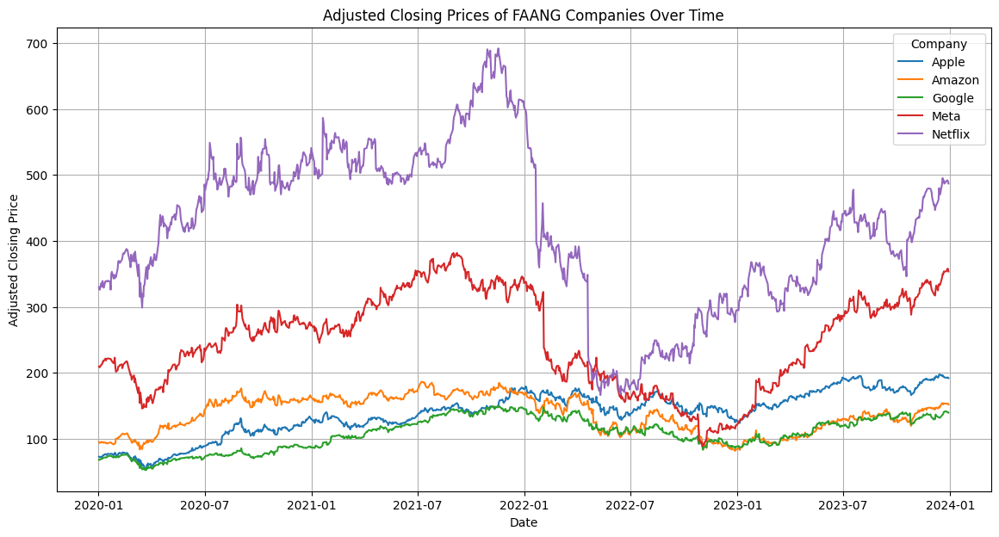

In [148]:
adjust_price_columns = [ 'AAPL_AdjClose', 'AMZN_AdjClose', 'GOOGL_AdjClose',
       'META_AdjClose', 'NFLX_AdjClose']

companies = ['Apple', 'Amazon', 'Google', 'Meta', 'Netflix']

def plot_faang_adjust_trends(data, date_col, adj_close_columns, companies):
    """
    Plot overall adjusting price trends
    
    Parameters:
    - data: FaangStock df
    - date_cols : Name of the columns containing the adjusting closing price
    - adj_close_columns: list of column name for the adjusted price
    - companies : List of company_names corresponding to the adjusted price
    """
    
    plt.figure(figsize=(14, 7))

    for col, company in zip(adj_close_columns, companies):
        plt.plot(data[date_col], data[col], label=company)

    plt.title('Adjusted Closing Prices of FAANG Companies Over Time')
    plt.xlabel('Date')
    plt.ylabel('Adjusted Closing Price')
    plt.legend(title='Company')
    plt.grid(True)
    plt.show()
        

plot_faang_adjust_trends(faang_stock_df, 'Date', adjust_price_columns, companies )

#### Closing Prices of Faang

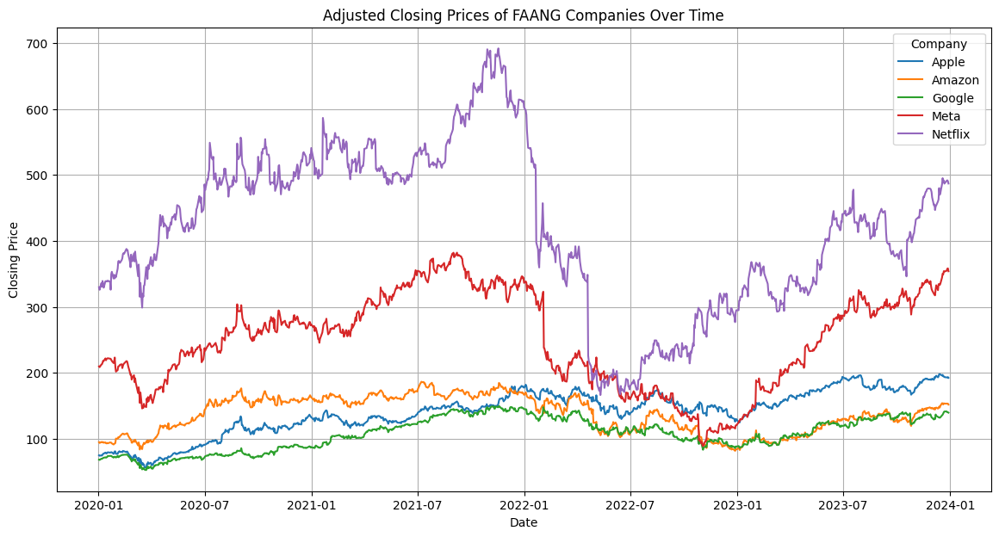

In [149]:
closing_columns = [ 'AAPL_Close', 'AMZN_Close',
       'GOOGL_Close', 'META_Close', 'NFLX_Close']


def plot_faang_closing_trends(data, date_col, closing_columns, companies):
    """
    Plot overall adjusting price trends
    
    Parameters:
    - data: FaangStock df
    - date_cols : Name of the columns containing the adjusting closing price
    - adj_close_columns: list of column name for the adjusted price
    - companies : List of company_names corresponding to the adjusted price
    """
    
    plt.figure(figsize=(14, 7))

    for col, company in zip(closing_columns, companies):
        plt.plot(data[date_col], data[col], label=company)

    plt.title('Adjusted Closing Prices of FAANG Companies Over Time')
    plt.xlabel('Date')
    plt.ylabel('Closing Price')
    plt.legend(title='Company')
    plt.grid(True)
    plt.show()
        

plot_faang_closing_trends(faang_stock_df, 'Date', closing_columns, companies )

#### Highest Stock Prices

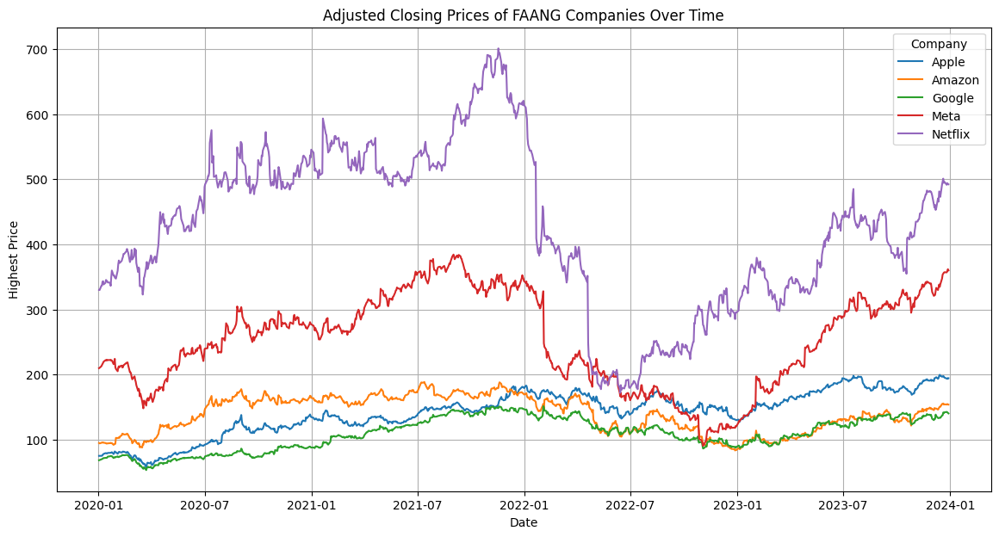

In [150]:
high_columns = ['AAPL_High', 'AMZN_High', 'GOOGL_High', 'META_High', 'NFLX_High']

def plot_faang_high_trends(data, date_col, high_columns, companies):
    """
    Plot overall adjusting price trends
    
    Parameters:
    - data: FaangStock df
    - date_cols : Name of the columns containing the adjusting closing price
    - adj_close_columns: list of column name for the adjusted price
    - companies : List of company_names corresponding to the adjusted price
    """
    
    plt.figure(figsize=(14, 7))

    for col, company in zip(high_columns, companies):
        plt.plot(data[date_col], data[col], label=company)

    plt.title('Adjusted Closing Prices of FAANG Companies Over Time')
    plt.xlabel('Date')
    plt.ylabel('Highest Price')
    plt.legend(title='Company')
    plt.grid(True)
    plt.show()
        

plot_faang_high_trends(faang_stock_df, 'Date',high_columns, companies )


#### Lowest Price

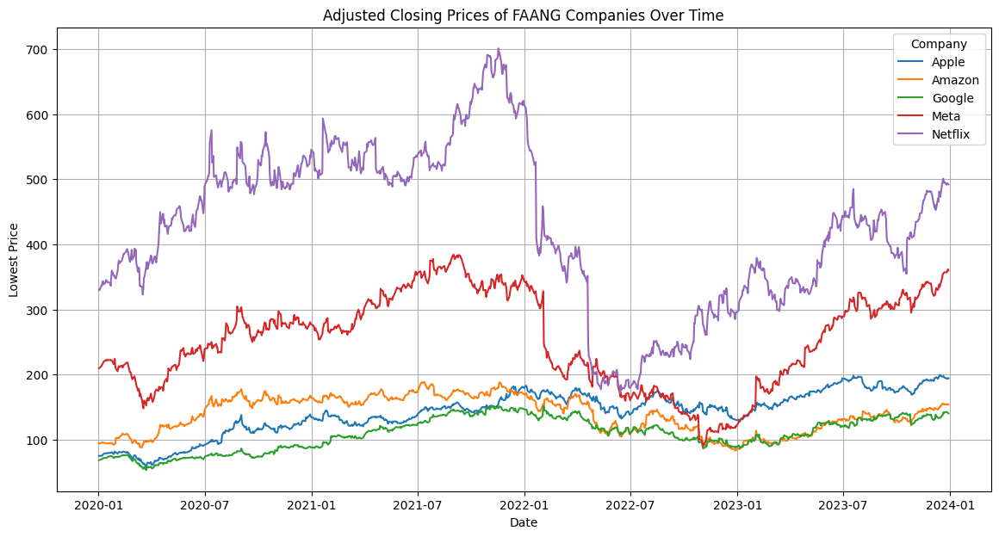

In [151]:
### Lowest Price
low_columns = ['AAPL_Low', 'AMZN_Low', 'GOOGL_Low', 'META_Low', 'NFLX_Low']


def plot_faang_low_trends(data, date_col, low_columns, companies):
    """
    Plot overall adjusting price trends
    
    Parameters:
    - data: FaangStock df
    - date_cols : Name of the columns containing the adjusting closing price
    - adj_close_columns: list of column name for the adjusted price
    - companies : List of company_names corresponding to the adjusted price
    """
    
    plt.figure(figsize=(14, 7))

    for col, company in zip(high_columns, companies):
        plt.plot(data[date_col], data[col], label=company)

    plt.title('Adjusted Closing Prices of FAANG Companies Over Time')
    plt.xlabel('Date')
    plt.ylabel('Lowest Price')
    plt.legend(title='Company')
    plt.grid(True)
    plt.show()
        

plot_faang_low_trends(faang_stock_df, 'Date',low_columns, companies )

#### Opening Price

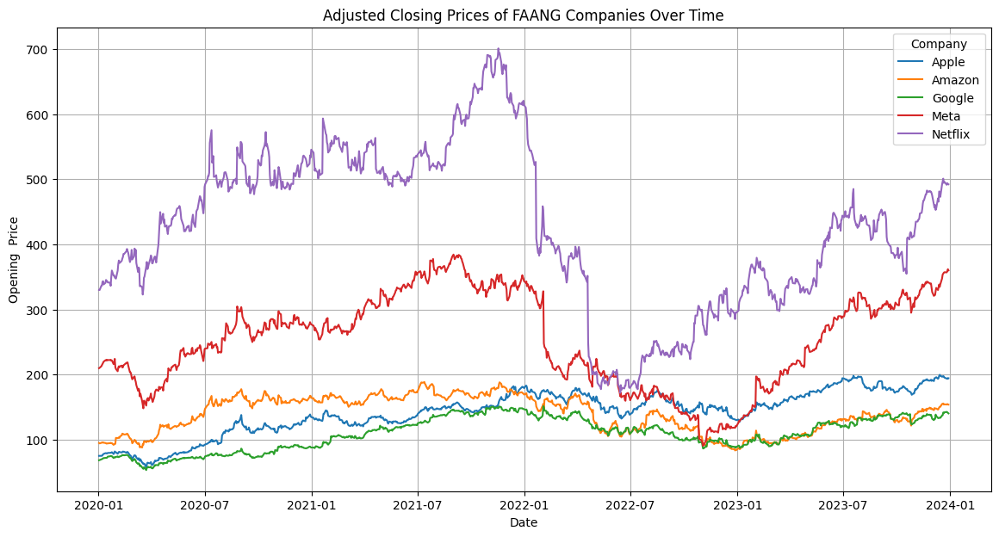

In [152]:
### Opening Price
open_columns = ['AAPL_Open', 'AMZN_Open', 'GOOGL_Open', 'META_Open', 'NFLX_Open']


def plot_faang_open_trends(data, date_col, open_columns, companies):
    """
    Plot overall adjusting price trends
    
    Parameters:
    - data: FaangStock df
    - date_cols : Name of the columns containing the adjusting closing price
    - adj_close_columns: list of column name for the adjusted price
    - companies : List of company_names corresponding to the adjusted price
    """
    
    plt.figure(figsize=(14, 7))

    for col, company in zip(high_columns, companies):
        plt.plot(data[date_col], data[col], label=company)

    plt.title('Adjusted Closing Prices of FAANG Companies Over Time')
    plt.xlabel('Date')
    plt.ylabel('Opening  Price')
    plt.legend(title='Company')
    plt.grid(True)
    plt.show()
        

plot_faang_open_trends(faang_stock_df, 'Date',open_columns, companies )

#### Analyzing by Day of the Week,  Month, Quarter

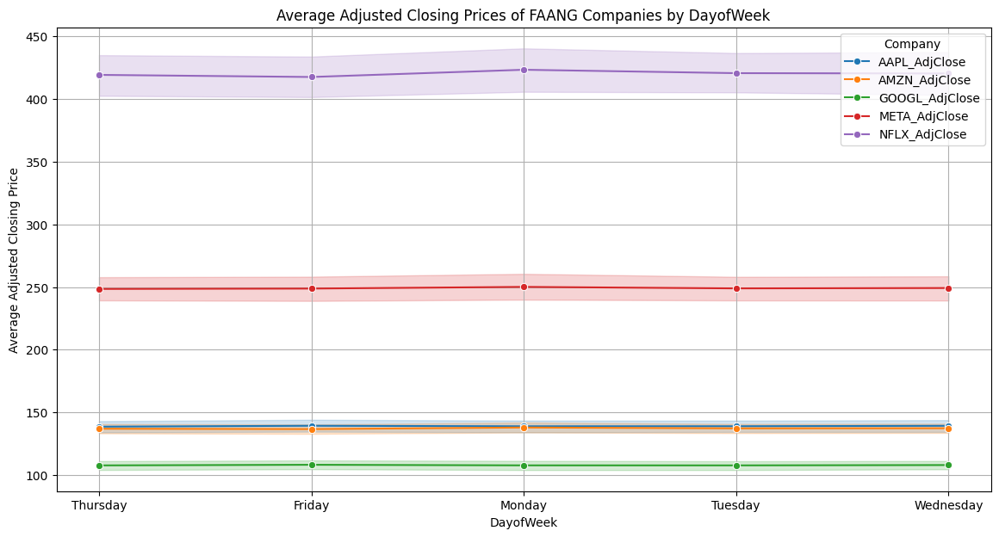

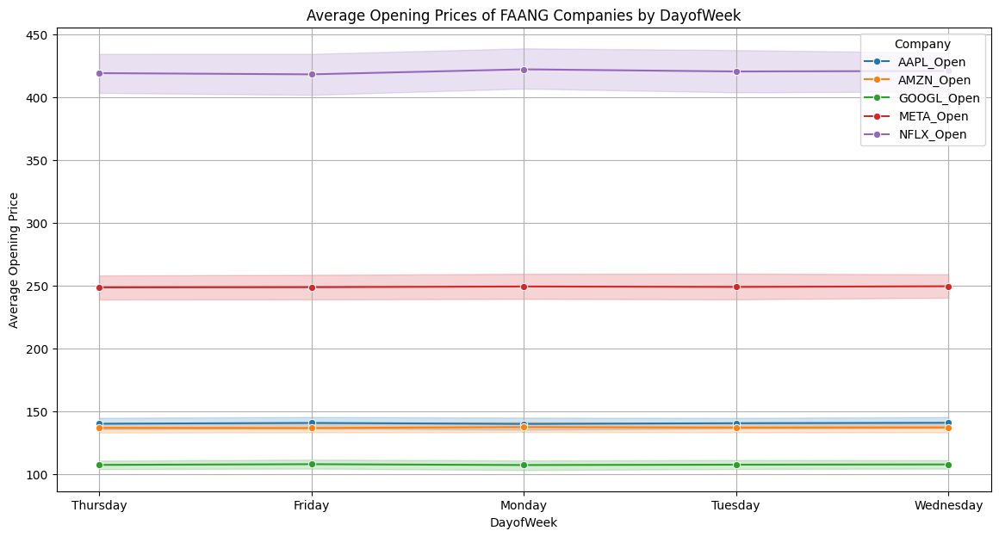

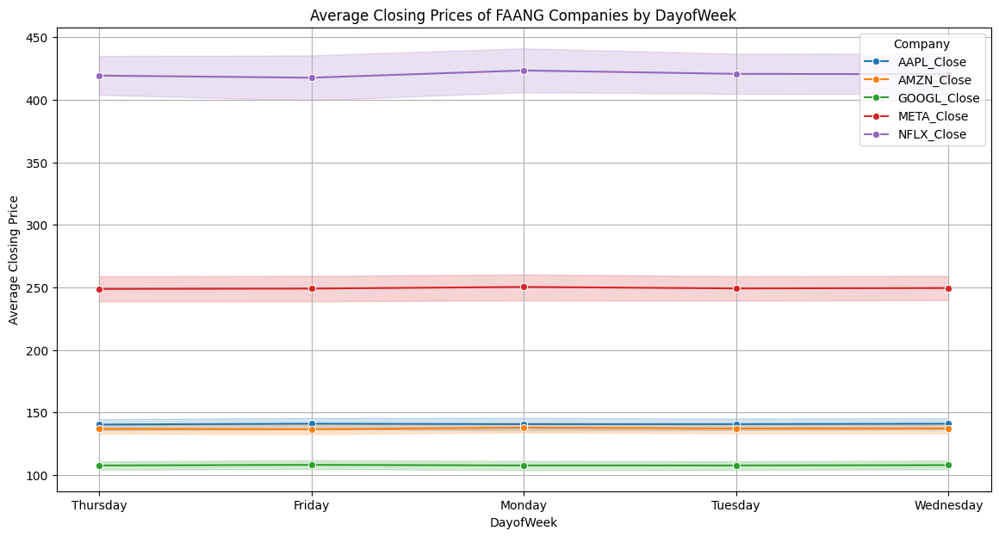

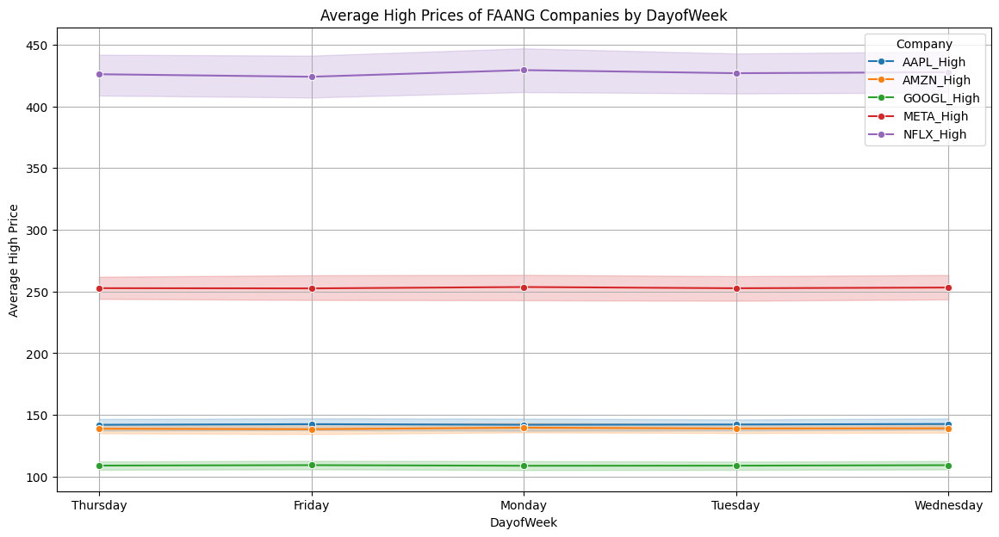

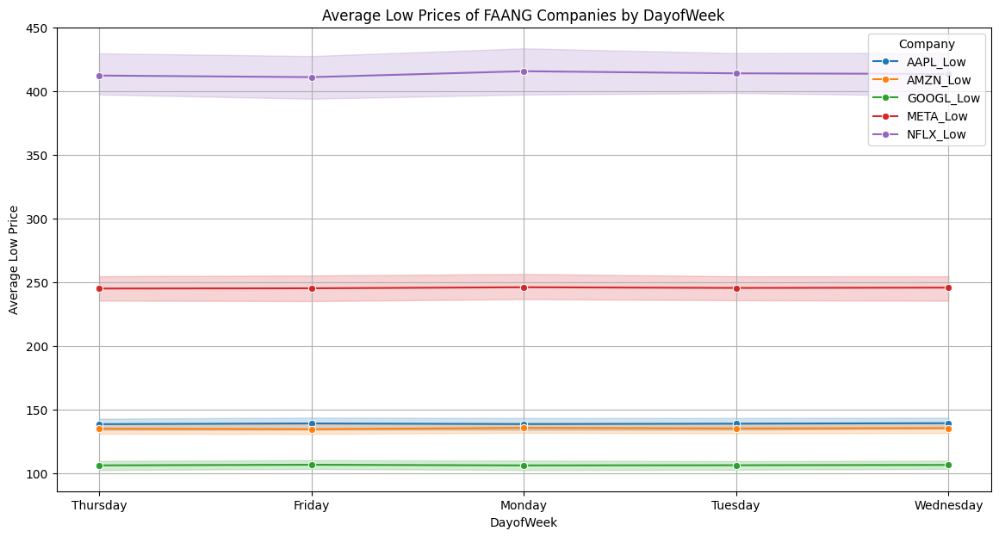

...

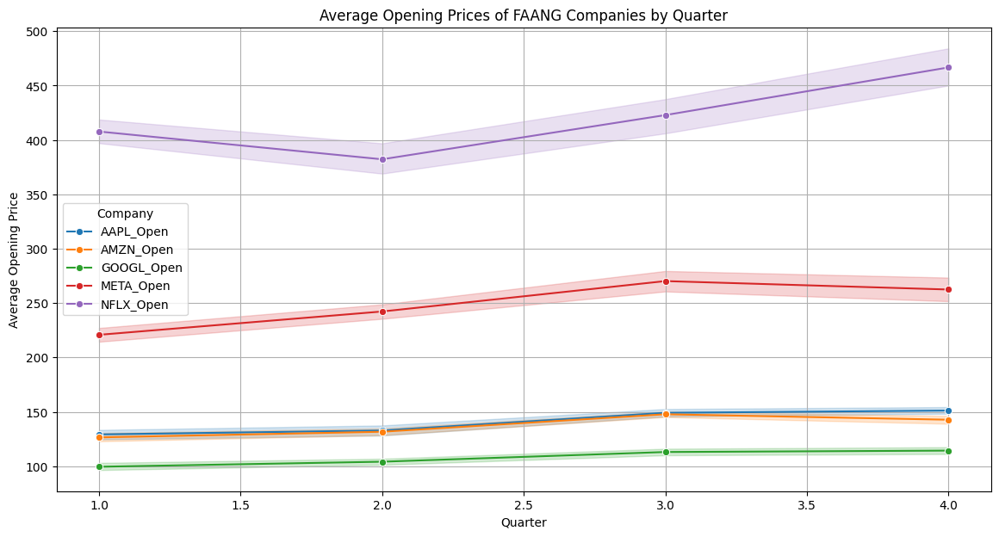

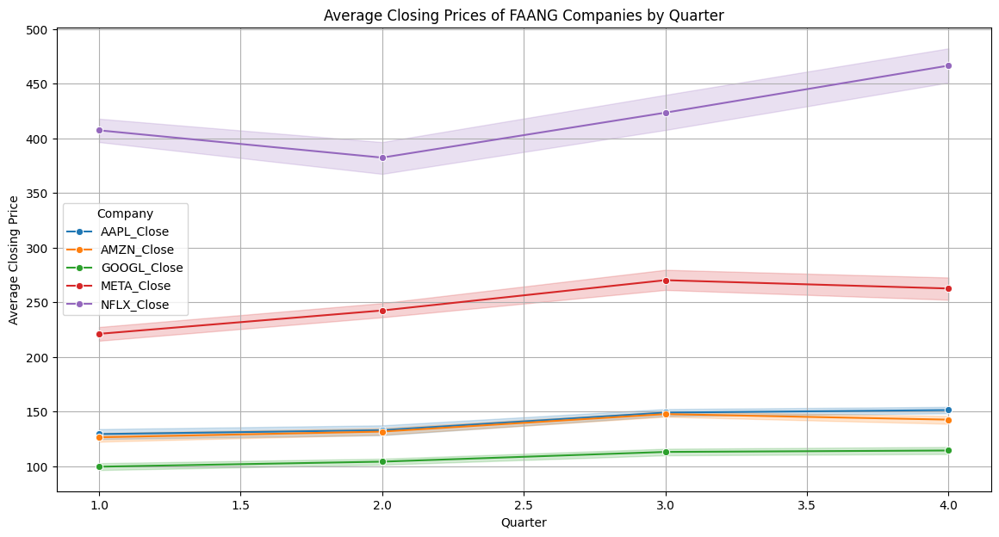

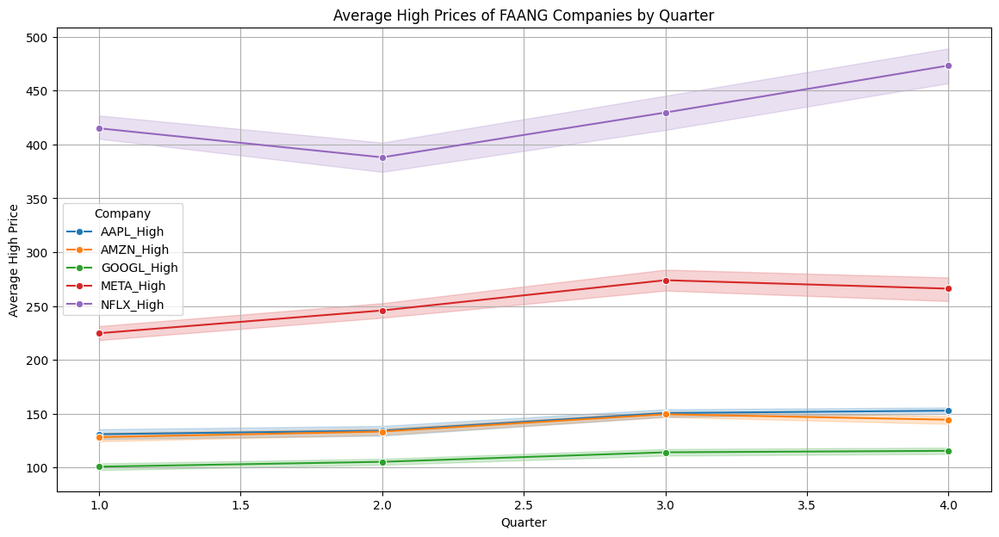

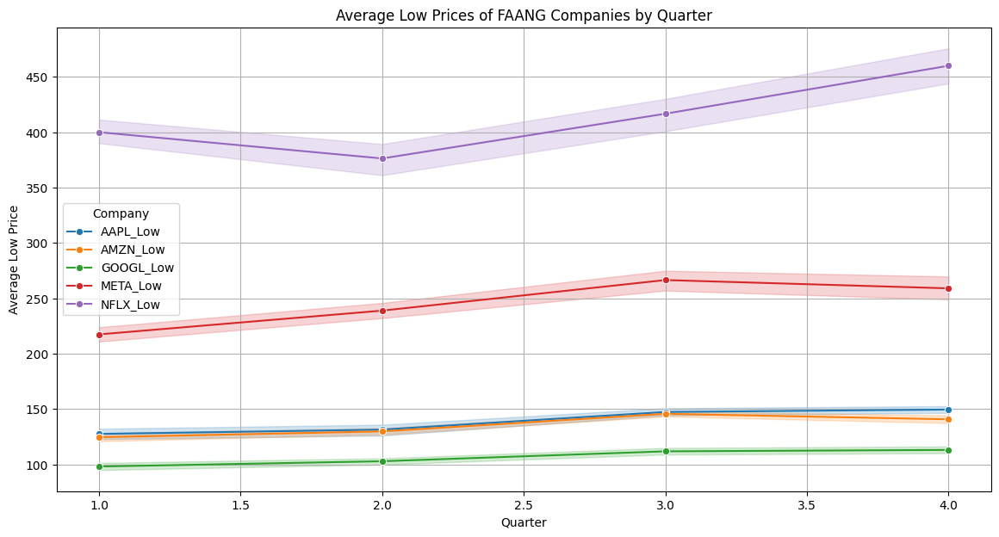

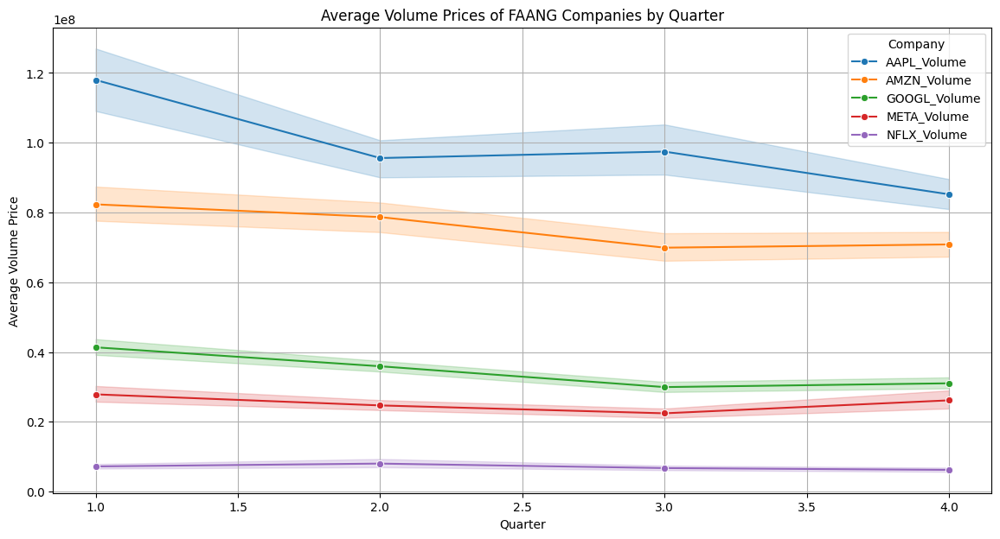

In [153]:
# Function to plot trends by different time components
def plot_sns_trends(data, date_cols, price_types, companies):
    """
    Plots the trends for FAANG companies over different time components.

    Parameters:
    - data: DataFrame containing the stock data.
    - date_cols: List of date columns to be used for grouping.
    - price_types: Dictionary of price type names to column name suffixes.
    - companies: List of company names corresponding to the price columns.

    Returns:
    - None
    """
    for date_col in date_cols:
        for price_type, suffix in price_types.items():
            # Filter to include only the relevant price columns
            price_columns = [f'{company}_{suffix}' for company in companies]
            
            # Melt the data for seaborn
            melted_data = data.melt(id_vars=['Date', date_col], value_vars=price_columns, var_name='Company', value_name='Price')
            melted_data['Price'] = pd.to_numeric(melted_data['Price'], errors='coerce')
            
            # Remove any rows where 'Price' is NaN
            melted_data = melted_data.dropna(subset=['Price'])
            
            # Plotting
            plt.figure(figsize=(14, 7))
            sns.lineplot(data=melted_data, x=date_col, y='Price', hue='Company', marker='o')
            plt.title(f'Average {price_type} Prices of FAANG Companies by {date_col}')
            plt.xlabel(date_col)
            plt.ylabel(f'Average {price_type} Price')
            plt.legend(title='Company')
            plt.grid(True)
            plt.show()

# Define the date columns and price types
date_cols = ['DayofWeek', 'Year', 'MonthName', 'Quarter']
price_types = {
    'Adjusted Closing': 'AdjClose',
    'Opening': 'Open',
    'Closing': 'Close',
    'High': 'High',
    'Low': 'Low',
    'Volume': 'Volume'
}
companies = ['AAPL', 'AMZN', 'GOOGL', 'META', 'NFLX']

# Example usage
plot_sns_trends(faang_stock_df, date_cols, price_types, companies)


In [155]:
# Calculate moving averages

# Define the FAANG companies

companies = ['AAPL', 'AMZN', 'GOOGL', 'META', 'NFLX']

# Define the price types
price_types = {
    'AdjClose': 'AdjClose',
    'Open': 'Open',
    'Close': 'Close',
    'High': 'High',
    'Low': 'Low'
}


# Define window sizes for moving averages
window_sizes = [5, 10, 20, 50, 100]  

# Calculate moving averages and add as new columns to the dataframe
for company in companies:
    for suffix in price_types.values():
        price_column = f'{company}_{suffix}'
        for window in window_sizes:
            ma_column = f'{price_column}_MA_{window}'
            faang_stock_df[ma_column] = faang_stock_df[price_column].rolling(window=window).mean()

        

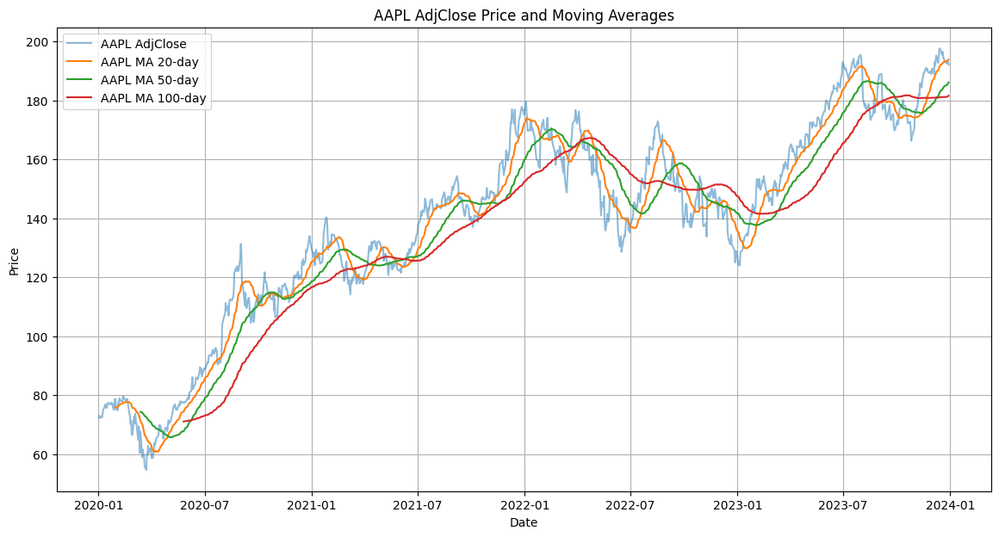

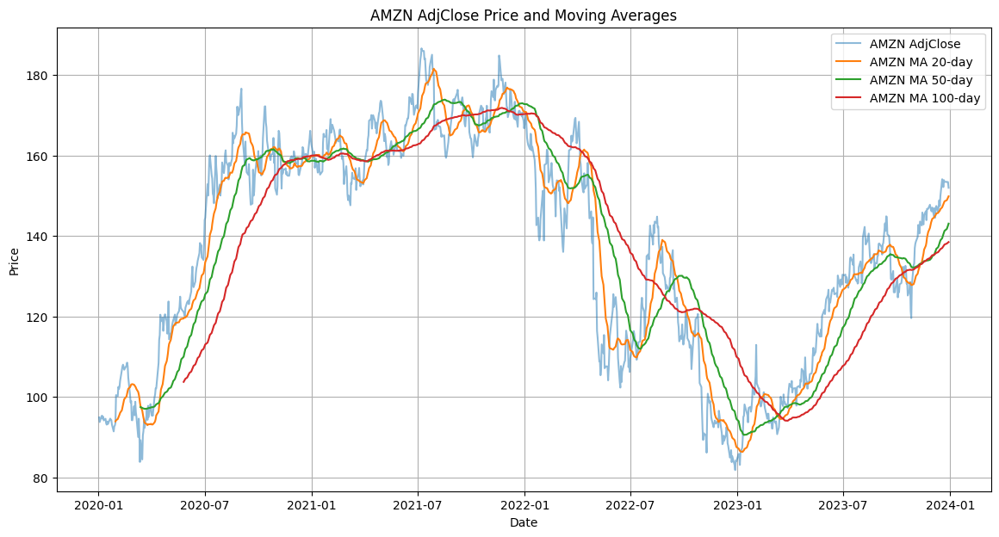

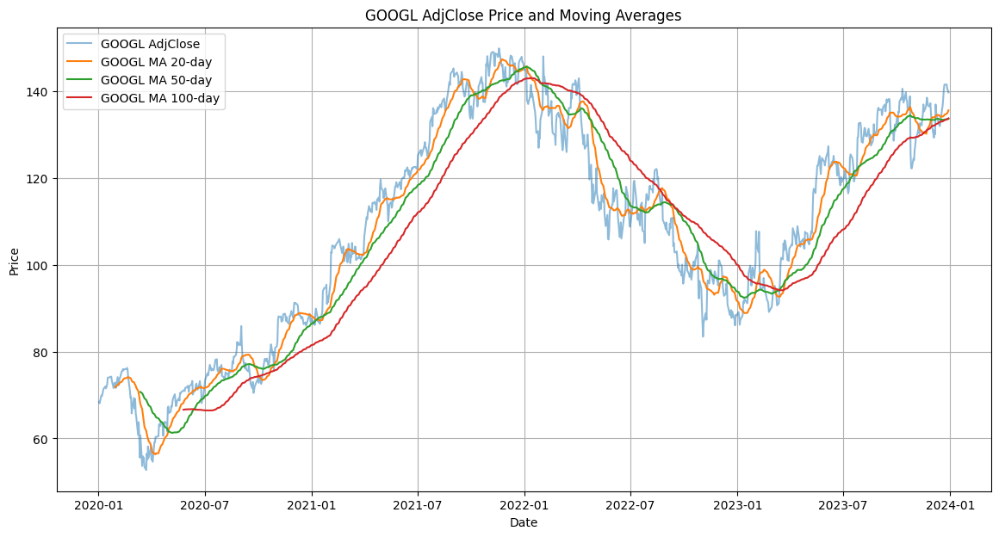

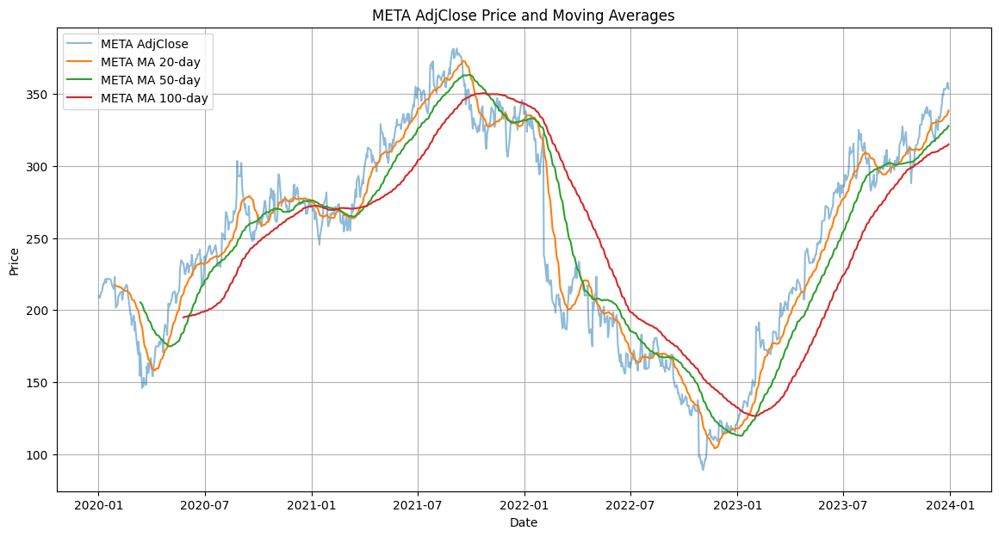

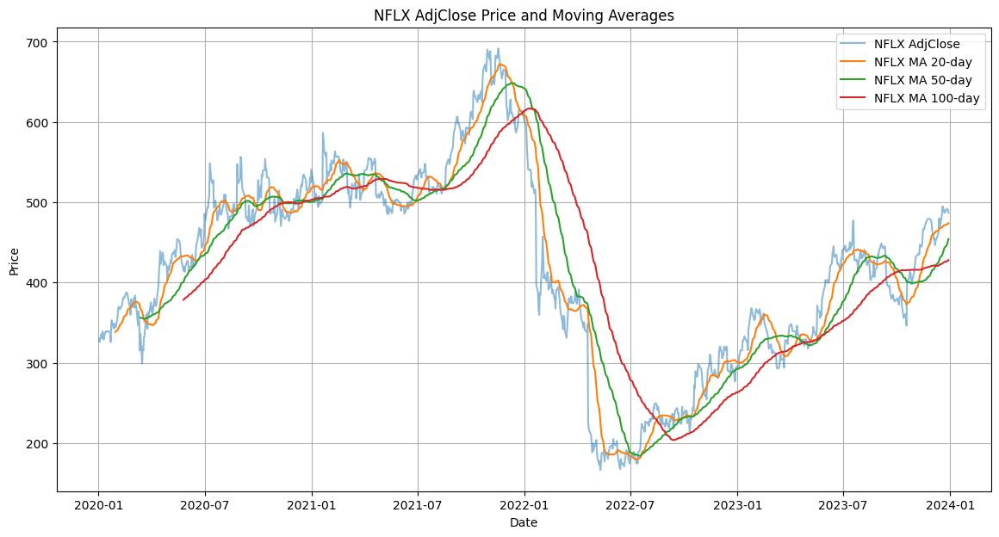

In [156]:
# What was the moving average of the various stack?


def plot_moving_averages_for_type(data, companies, price_type, window_sizes):
    """
    Plots the moving averages for a specific price type for each FAANG company.

    Parameters:
    - data: DataFrame containing the stock data.
    - companies: List of FAANG companies.
    - price_type: Type of price (e.g., 'AdjClose', 'Open', 'Close', 'High', 'Low').
    - window_sizes: List of window sizes for moving averages.

    Returns:
    - None
    """
    for company in companies:
        plt.figure(figsize=(14, 7))
        
        # Plot the original price type
        plt.plot(data['Date'], data[f'{company}_{price_type}'], label=f'{company} {price_type}', alpha=0.5)
        
        for window in window_sizes:
            # Plot the moving average
            plt.plot(data['Date'], data[f'{company}_{price_type}_MA_{window}'], label=f'{company} MA {window}-day')
        
        plt.title(f'{company} {price_type} Price and Moving Averages')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

# Define the FAANG companies
companies = ['AAPL', 'AMZN', 'GOOGL', 'META', 'NFLX']

# Define the window sizes for moving averages
window_sizes = [20, 50, 100]

# Example usage for adjusted closing prices
plot_moving_averages_for_type(faang_stock_df, companies, 'AdjClose', window_sizes)


In [ ]:
# Calculate moving averages for opening prices and add as new columns to the dataframe
for company in companies:
    price_column = f'{company}_Open'
    for window in window_sizes:
        ma_column = f'{price_column}_MA_{window}'
        faang_stock_df[ma_column] = faang_stock_df[price_column].rolling(window=window).mean()

# Display the columns to verify the moving averages have been added
faang_stock_df.columns.tolist()

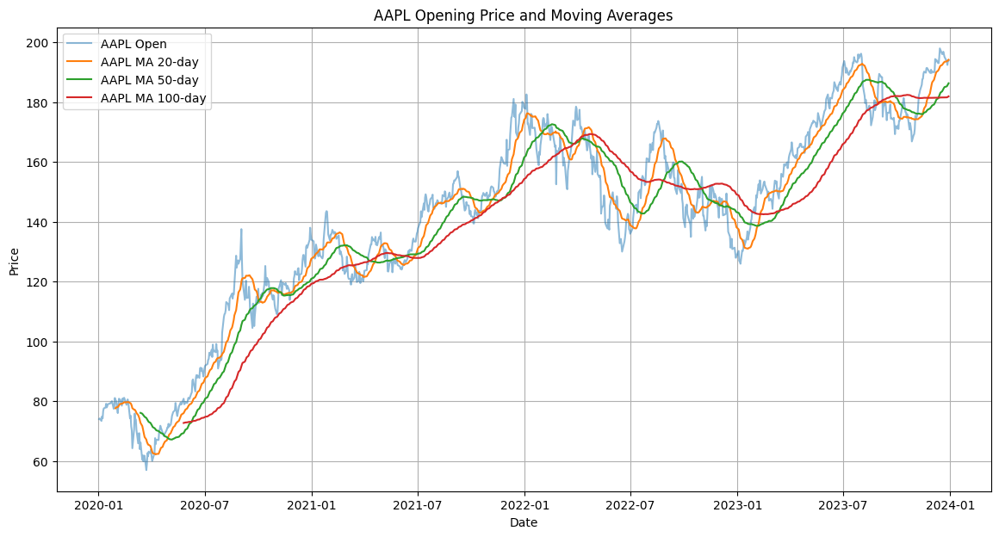

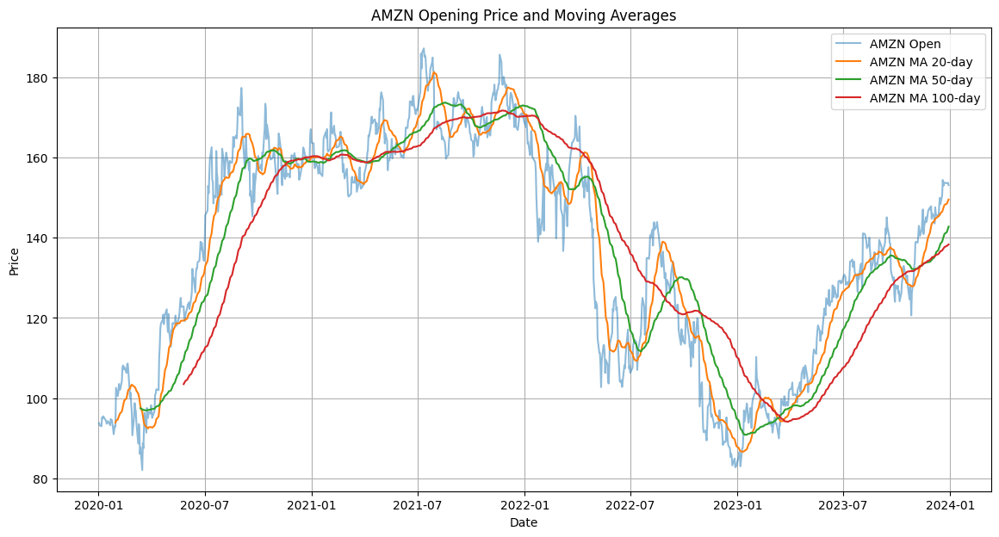

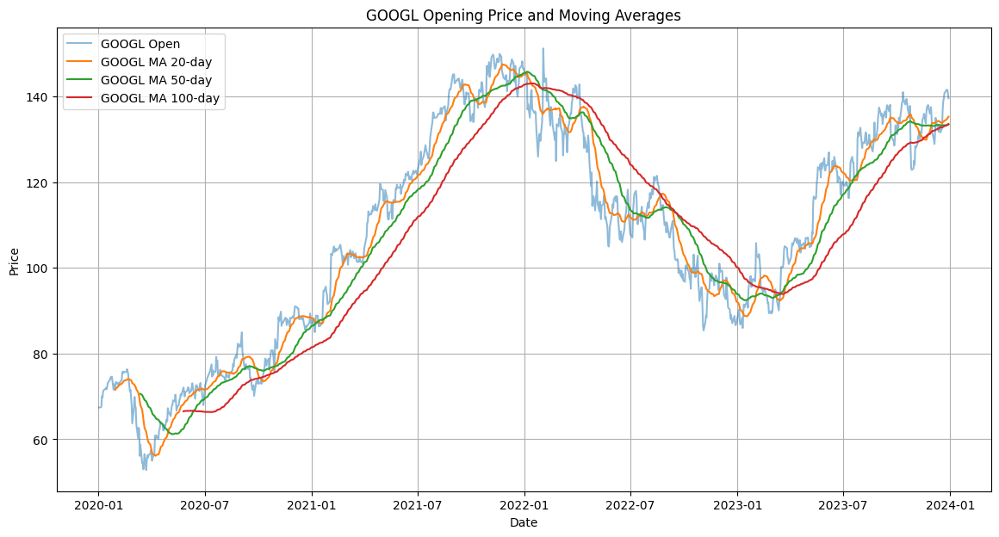

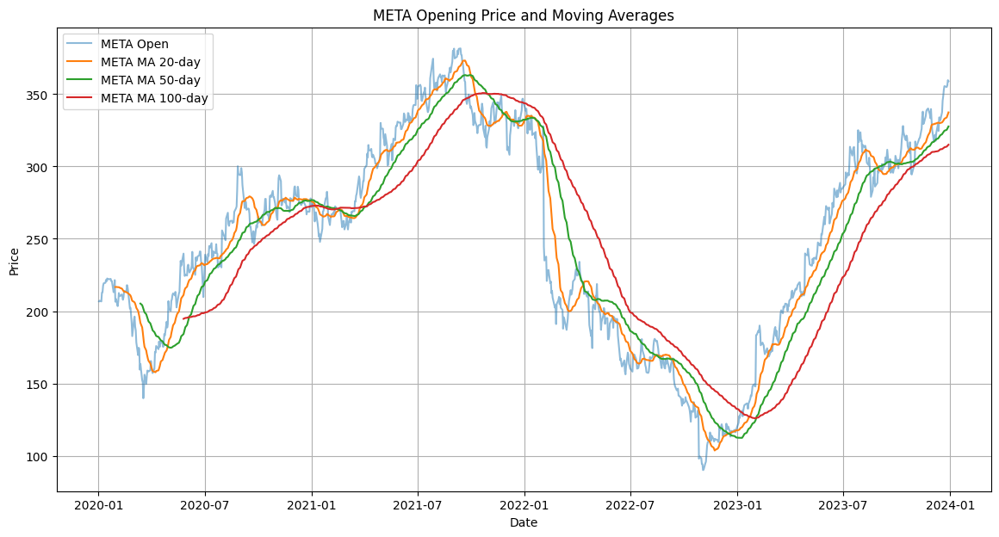

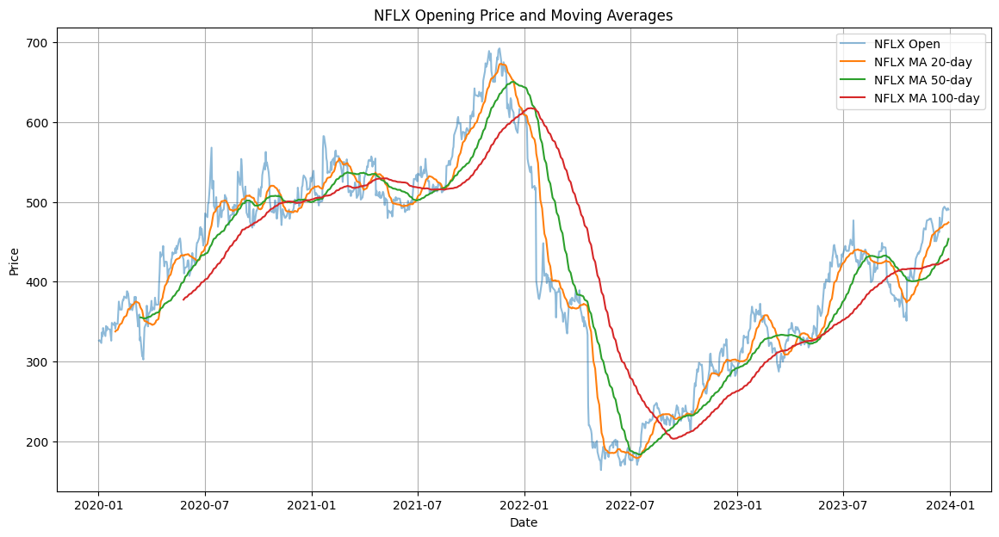

In [157]:
# What the opening price by company?

def plot_moving_averages_for_opening(data, companies, window_sizes):
    """
    Plots the opening prices and their moving averages for each FAANG company.

    Parameters:
    - data: DataFrame containing the stock data.
    - companies: List of FAANG companies.
    - window_sizes: List of window sizes for moving averages.

    Returns:
    - None
    """
    for company in companies:
        plt.figure(figsize=(14, 7))
        
        # Plot the original opening price
        plt.plot(data['Date'], data[f'{company}_Open'], label=f'{company} Open', alpha=0.5)
        
        for window in window_sizes:
            # Plot the moving average
            plt.plot(data['Date'], data[f'{company}_Open_MA_{window}'], label=f'{company} MA {window}-day')
        
        plt.title(f'{company} Opening Price and Moving Averages')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

# Example usage for opening prices
plot_moving_averages_for_opening(faang_stock_df, companies, window_sizes)



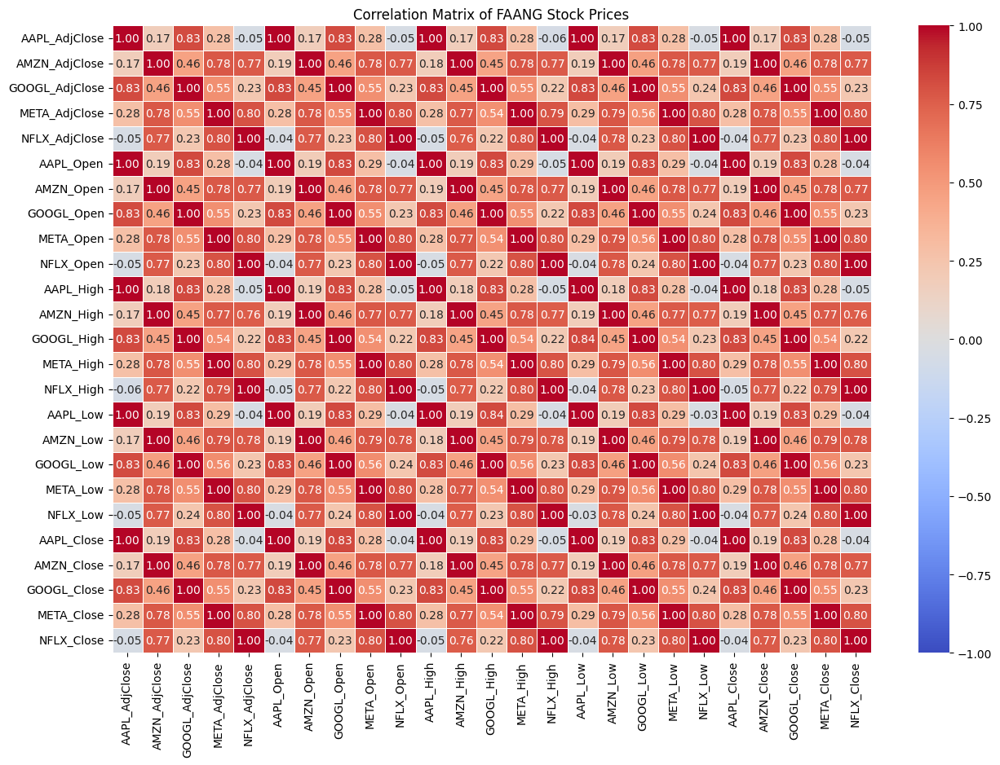

In [158]:

# Select relevant columns for correlation
columns_to_correlate = [
    'AAPL_AdjClose', 'AMZN_AdjClose', 'GOOGL_AdjClose', 'META_AdjClose', 'NFLX_AdjClose',
    'AAPL_Open', 'AMZN_Open', 'GOOGL_Open', 'META_Open', 'NFLX_Open',
    'AAPL_High', 'AMZN_High', 'GOOGL_High', 'META_High', 'NFLX_High',
    'AAPL_Low', 'AMZN_Low', 'GOOGL_Low', 'META_Low', 'NFLX_Low',
    'AAPL_Close', 'AMZN_Close', 'GOOGL_Close', 'META_Close', 'NFLX_Close'
]

# Calculate the correlation matrix
correlation_matrix = faang_stock_df[columns_to_correlate].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix of FAANG Stock Prices')
plt.show()


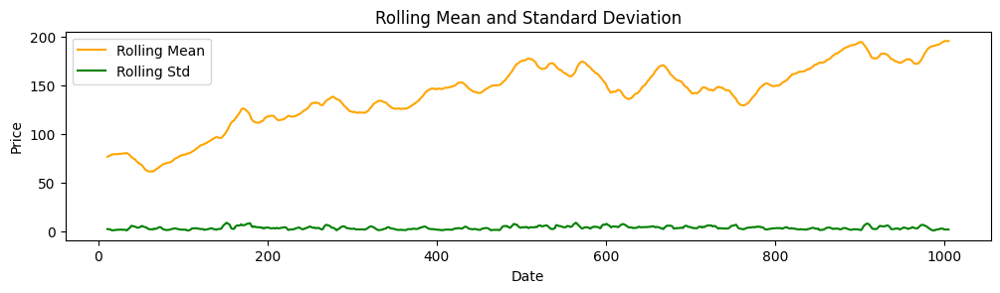

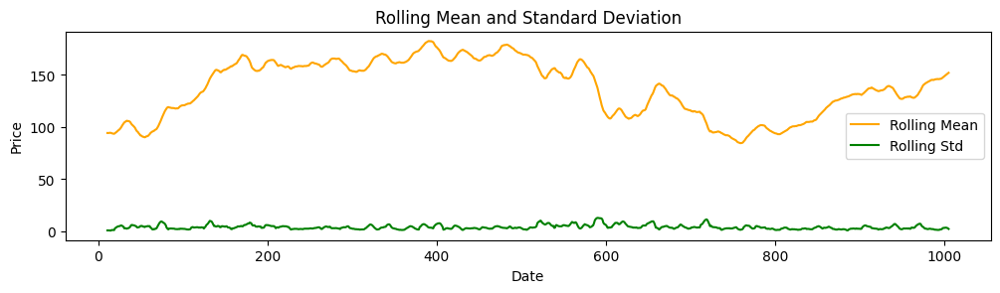

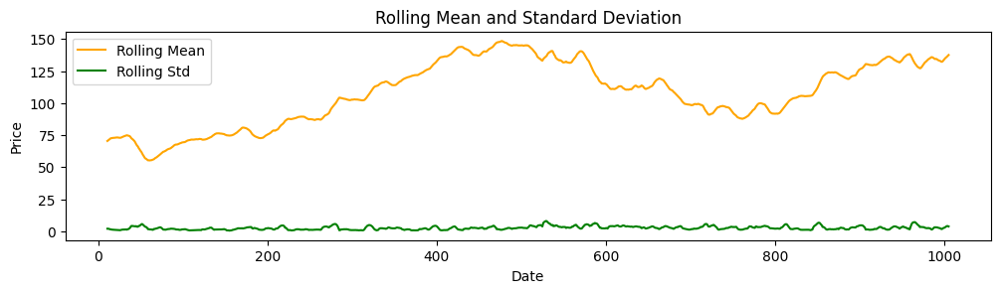

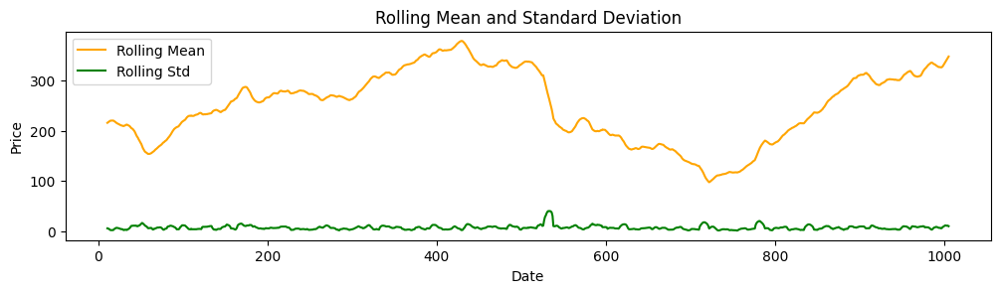

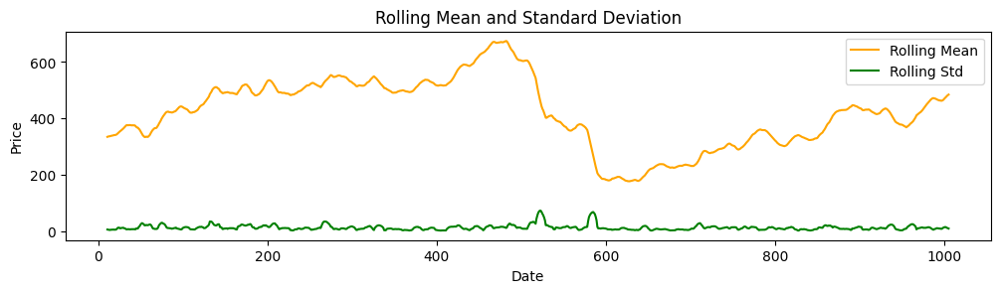

In [159]:
# Looking at Rolling Statistics

# Calculate and print the rolling statistics 
companies = ['AAPL', 'AMZN', 'GOOGL', 'META', 'NFLX']

for company in companies:
    rolling_mean = faang_stock_df[f'{company}_Open'].rolling(window=12).mean()
    rolling_std = faang_stock_df[f'{company}_Open'].rolling(window=12).std()
    plt.figure(figsize=(12,6))
    plt.subplot(2, 1, 1)
    plt.plot(rolling_mean, label='Rolling Mean', color='orange')
    plt.plot(rolling_std, label='Rolling Std', color='green')
    plt.title('Rolling Mean and Standard Deviation')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

In [160]:
# Forecasting the closing and opening price of FAANG companies

# Split the data into training and testing sets
train_size = int(len(faang_stock_df) * 0.8)


In [161]:
# Splt the data into training and testing dataset
train = faang_stock_df[:train_size]
test = faang_stock_df[train_size:]

In [162]:
# Display the lengths of the training and testing sets
print(f"Training set length: {len(train)}")
print(f"Testing set length: {len(test)}")

Training set length: 804
Testing set length: 202


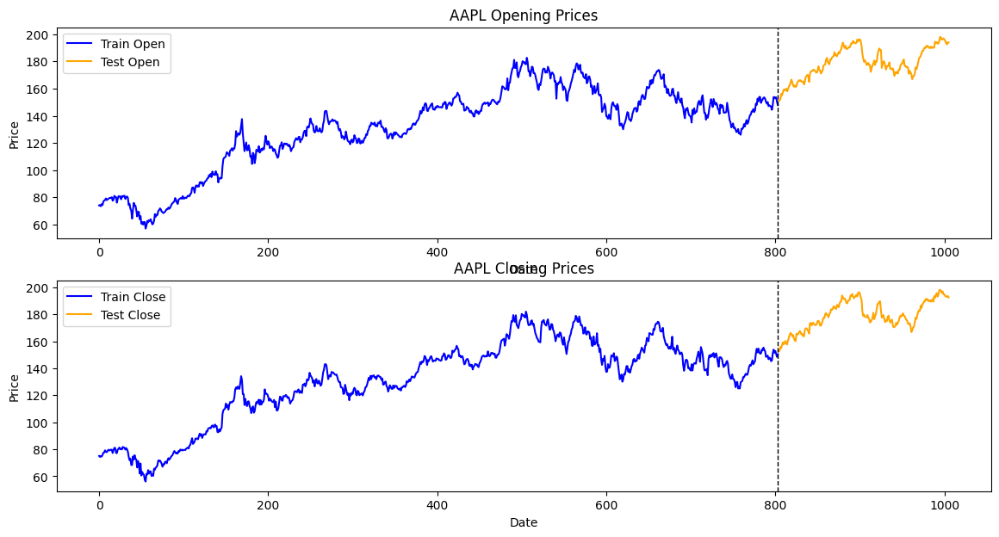

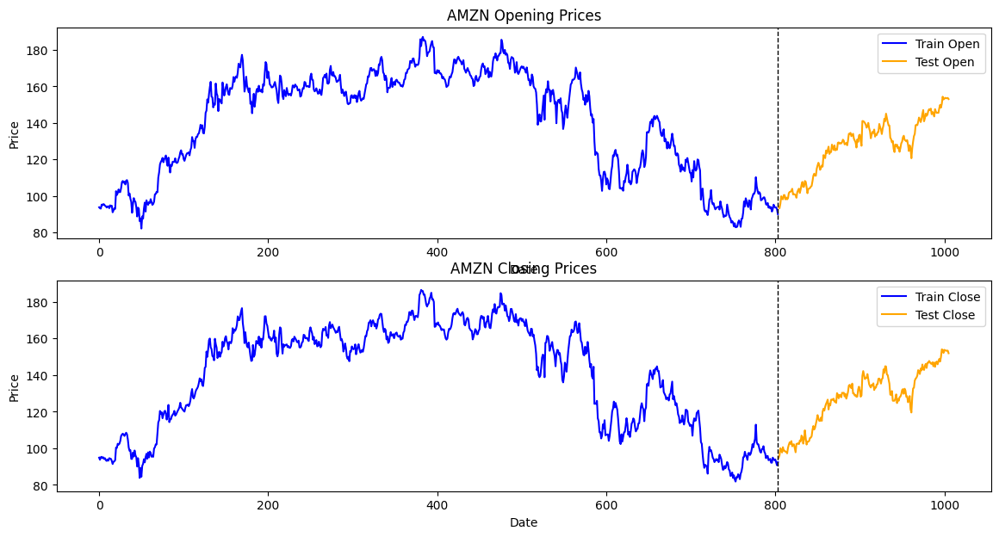

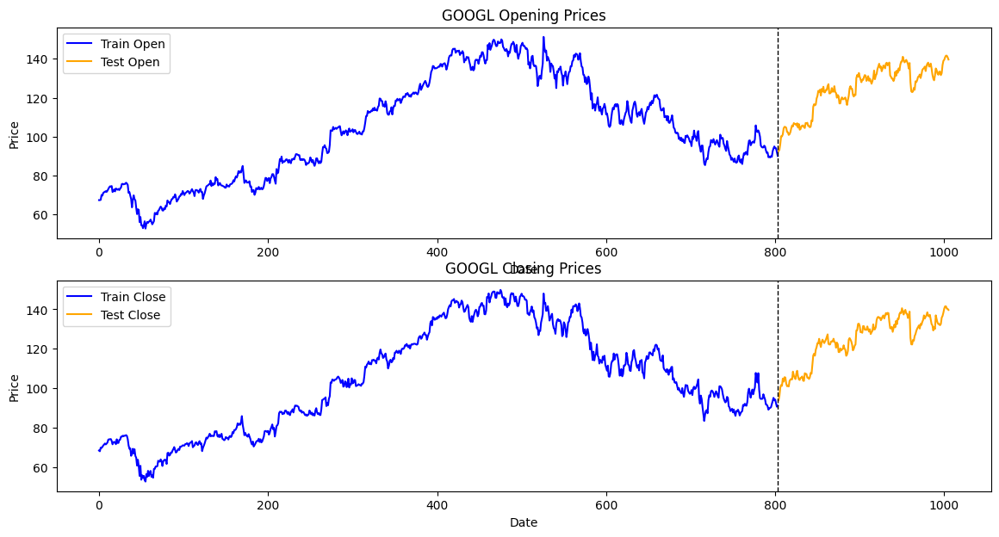

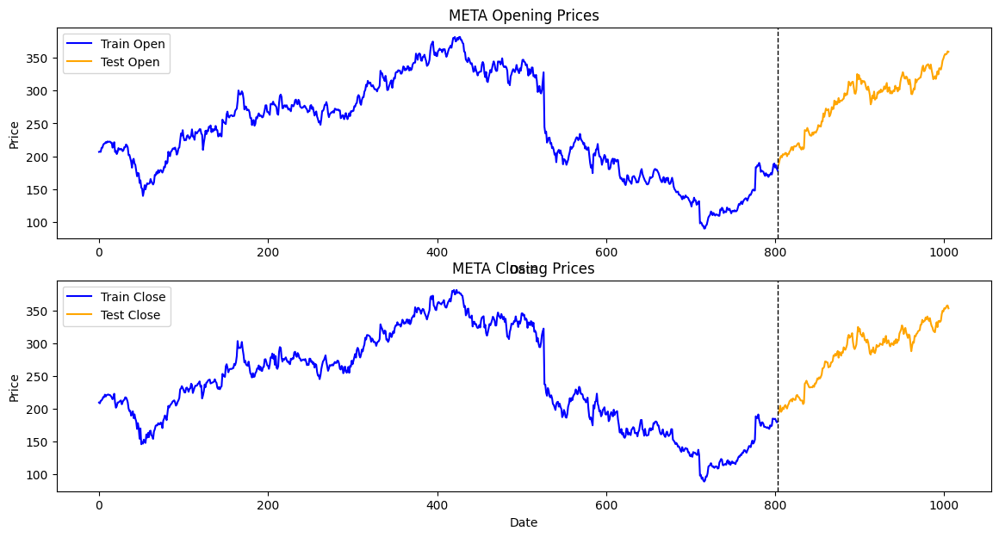

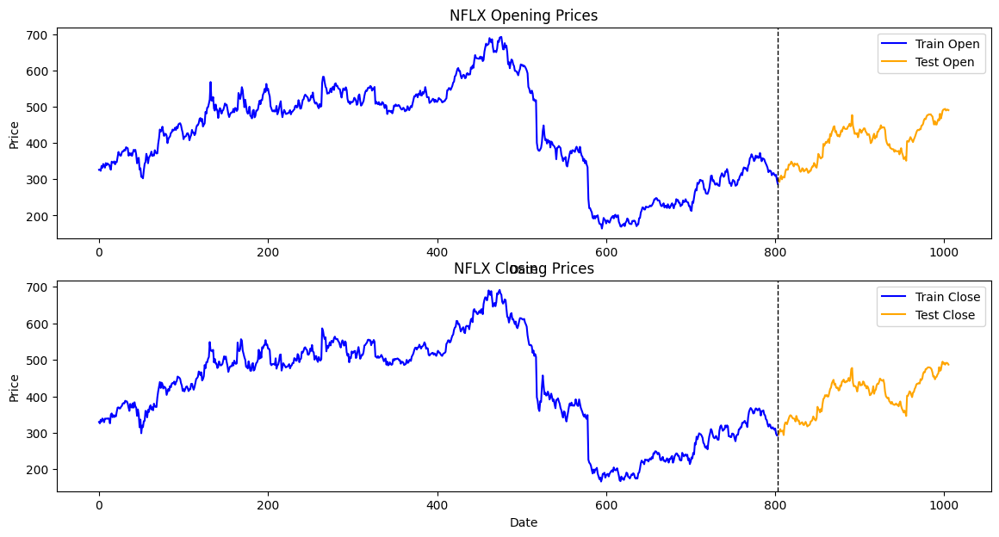

In [163]:
# Visualize the training and test dataset

# Plot the training and testing dataset together for each company
companies = ['AAPL', 'AMZN', 'GOOGL', 'META', 'NFLX']

# Plot the training and testing datasets together for each company's opening and closing prices
for company in companies:
    plt.figure(figsize=(14, 7))
    
    # Plot opening prices
    plt.subplot(2, 1, 1)
    plt.plot(train[f'{company}_Open'], label='Train Open', color='blue')
    plt.plot(test[f'{company}_Open'], label='Test Open', color='orange')
    plt.axvline(x=train.index[-1], color='black', linestyle='--', linewidth=1)  # Vertical line for split
    plt.title(f'{company} Opening Prices')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    
    
    # Plot closing prices
    plt.subplot(2, 1, 2)
    plt.plot(train[f'{company}_Close'], label='Train Close', color='blue')
    plt.plot(test[f'{company}_Close'], label='Test Close', color='orange')
    plt.axvline(x=train.index[-1], color='black', linestyle='--', linewidth=1)  # Vertical line for split
    plt.title(f'{company} Closing Prices')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()


In [164]:
# There are visible pattern of trends so we don't need to conduct ADF test

# Check for stationary
def adf_test(series):
    result = adfuller(series)
    print('ADF Statistic', result[0])
    print('p-value:', result[1])
    for key, value in result[4].items():
         print(f'Critical Value {key}: {value}')


for company in companies:
    adf_test(faang_stock_df[f'{company}_Open'])


companies = ['AAPL', 'AMZN', 'GOOGL', 'META', 'NFLX']




ADF Statistic -1.5213679861443339
p-value: 0.5229156692407708
Critical Value 1%: -3.436879978012783
Critical Value 5%: -2.86442302475405
Critical Value 10%: -2.568305057578451
ADF Statistic -2.138750792173884
p-value: 0.22922078099166887
Critical Value 1%: -3.4368734638130847
Critical Value 5%: -2.8644201518188126
Critical Value 10%: -2.5683035273879358
ADF Statistic -1.5157919637729087
p-value: 0.5256853193633192
Critical Value 1%: -3.4368734638130847
Critical Value 5%: -2.8644201518188126
Critical Value 10%: -2.5683035273879358
ADF Statistic -1.0904213105926512
p-value: 0.7188766201629362
Critical Value 1%: -3.4368734638130847
Critical Value 5%: -2.8644201518188126
Critical Value 10%: -2.5683035273879358
ADF Statistic -1.5052022510068384
p-value: 0.5309363079229794
Critical Value 1%: -3.4368734638130847
Critical Value 5%: -2.8644201518188126
Critical Value 10%: -2.5683035273879358


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AAPL_AdjClose:
 1005    192.189736
1006    192.306338
1007    192.424915
1008    192.543413
1009    192.661914
1010    192.780414
1011    192.898915
1012    193.017416
1013    193.135916
1014    193.254417
1015    193.372918
1016    193.491418
1017    193.609919
1018    193.728420
1019    193.846920
1020    193.965421
1021    194.083922
1022    194.202422
1023    194.320923
1024    194.439424
1025    194.557924
1026    194.676425
1027    194.794926
1028    194.913426
1029    195.031927
1030    195.150428
1031    195.268928
1032    195.387429
1033    195.505930
1034    195.624431
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


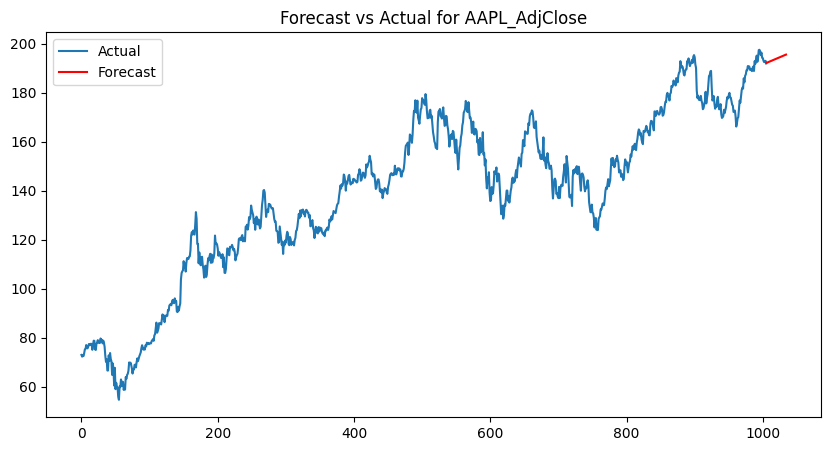

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AMZN_AdjClose:
 1005    152.036201
1006    152.091985
1007    152.148833
1008    152.205653
1009    152.262473
1010    152.319294
1011    152.376114
1012    152.432935
1013    152.489755
1014    152.546575
1015    152.603396
1016    152.660216
1017    152.717037
1018    152.773857
1019    152.830678
1020    152.887498
1021    152.944319
1022    153.001139
1023    153.057960
1024    153.114780
1025    153.171601
1026    153.228421
1027    153.285242
1028    153.342062
1029    153.398883
1030    153.455703
1031    153.512523
1032    153.569344
1033    153.626164
1034    153.682985
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


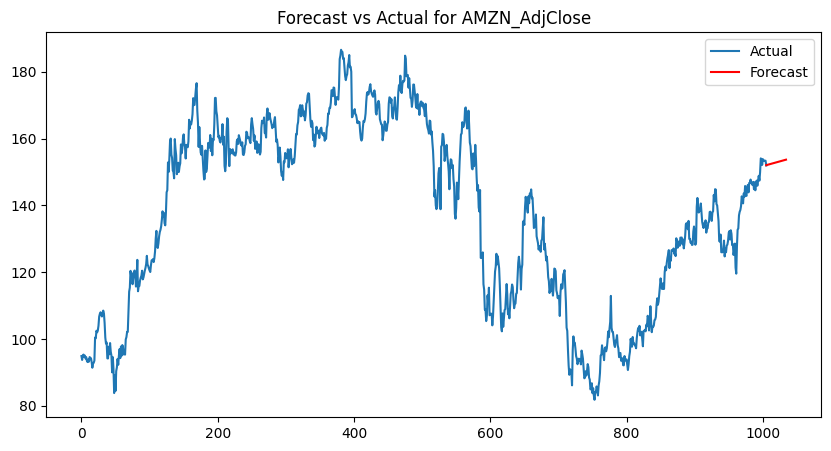

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for GOOGL_AdjClose:
 1005    139.788622
1006    139.858299
1007    139.929288
1008    140.000217
1009    140.071149
1010    140.142081
1011    140.213013
1012    140.283944
1013    140.354876
1014    140.425808
1015    140.496740
1016    140.567671
1017    140.638603
1018    140.709535
1019    140.780467
1020    140.851399
1021    140.922330
1022    140.993262
1023    141.064194
1024    141.135126
1025    141.206057
1026    141.276989
1027    141.347921
1028    141.418853
1029    141.489785
1030    141.560716
1031    141.631648
1032    141.702580
1033    141.773512
1034    141.844443
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


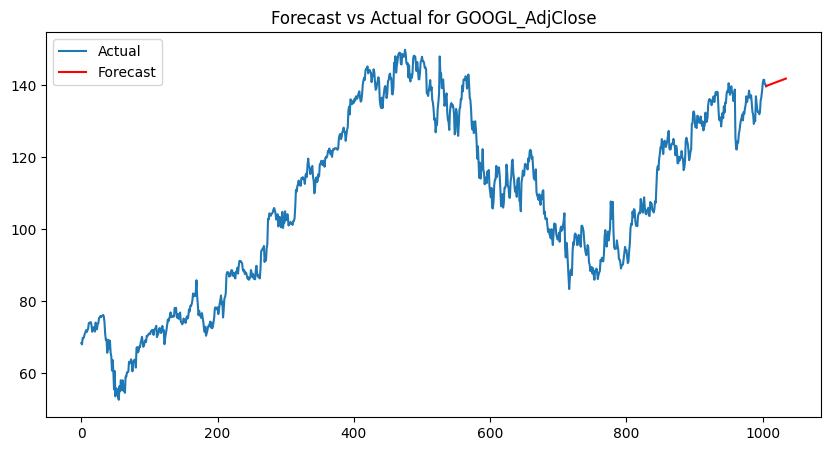

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for META_AdjClose:
 1005    354.378416
1006    354.940052
1007    355.512135
1008    356.083748
1009    356.655382
1010    357.227016
1011    357.798649
1012    358.370282
1013    358.941915
1014    359.513548
1015    360.085181
1016    360.656815
1017    361.228448
1018    361.800081
1019    362.371714
1020    362.943347
1021    363.514981
1022    364.086614
1023    364.658247
1024    365.229880
1025    365.801513
1026    366.373147
1027    366.944780
1028    367.516413
1029    368.088046
1030    368.659679
1031    369.231312
1032    369.802946
1033    370.374579
1034    370.946212
Name: predicted_mean, dtype: float64


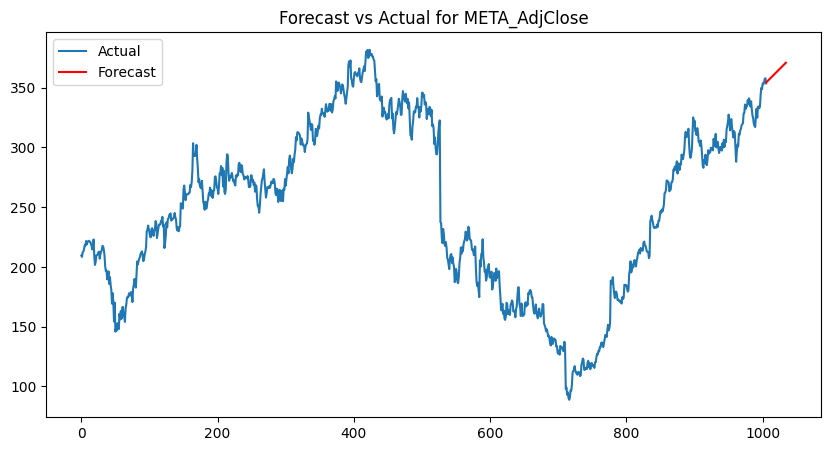

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_AdjClose:
 1005    487.505772
1006    487.953660
1007    488.408982
1008    488.863994
1009    489.319019
1010    489.774043
1011    490.229068
1012    490.684092
1013    491.139116
1014    491.594141
1015    492.049165
1016    492.504189
1017    492.959213
1018    493.414238
1019    493.869262
1020    494.324286
1021    494.779311
1022    495.234335
1023    495.689359
1024    496.144383
1025    496.599408
1026    497.054432
1027    497.509456
1028    497.964481
1029    498.419505
1030    498.874529
1031    499.329553
1032    499.784578
1033    500.239602
1034    500.694626
Name: predicted_mean, dtype: float64


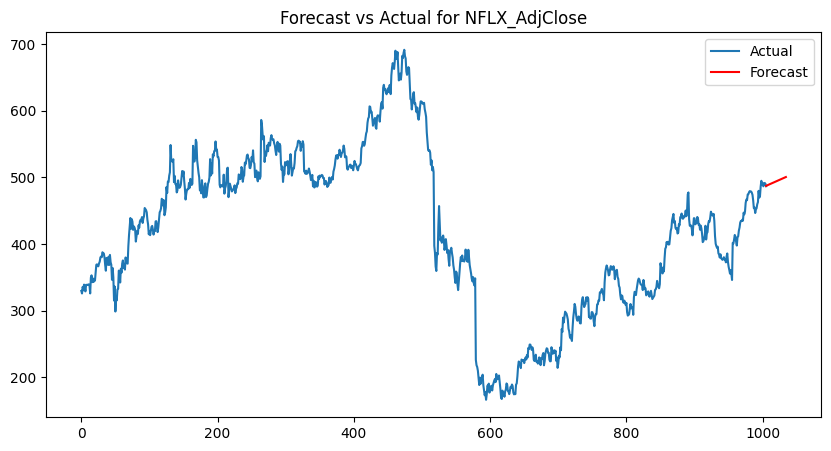

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AAPL_Close:
 1005    192.694525
1006    192.809493
1007    192.926482
1008    193.043389
1009    193.160300
1010    193.277210
1011    193.394120
1012    193.511030
1013    193.627941
1014    193.744851
1015    193.861761
1016    193.978672
1017    194.095582
1018    194.212492
1019    194.329403
1020    194.446313
1021    194.563223
1022    194.680133
1023    194.797044
1024    194.913954
1025    195.030864
1026    195.147775
1027    195.264685
1028    195.381595
1029    195.498506
1030    195.615416
1031    195.732326
1032    195.849236
1033    195.966147
1034    196.083057
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


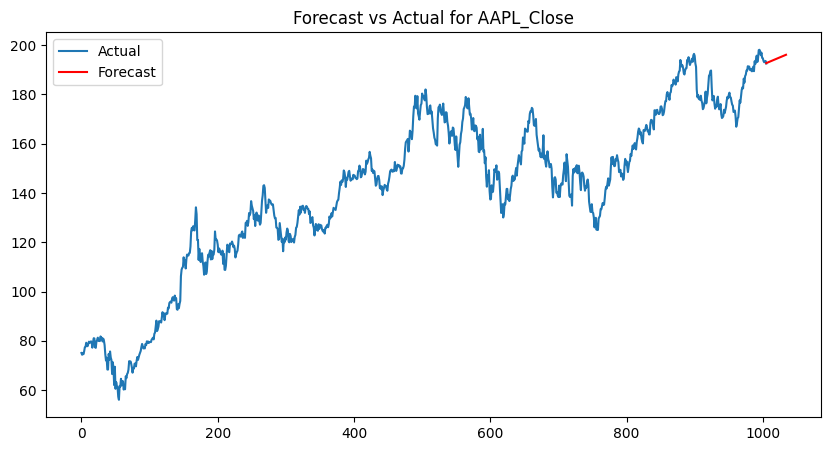

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AMZN_Close:
 1005    152.036201
1006    152.091985
1007    152.148833
1008    152.205653
1009    152.262473
1010    152.319294
1011    152.376114
1012    152.432935
1013    152.489755
1014    152.546575
1015    152.603396
1016    152.660216
1017    152.717037
1018    152.773857
1019    152.830678
1020    152.887498
1021    152.944319
1022    153.001139
1023    153.057960
1024    153.114780
1025    153.171601
1026    153.228421
1027    153.285242
1028    153.342062
1029    153.398883
1030    153.455703
1031    153.512523
1032    153.569344
1033    153.626164
1034    153.682985
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


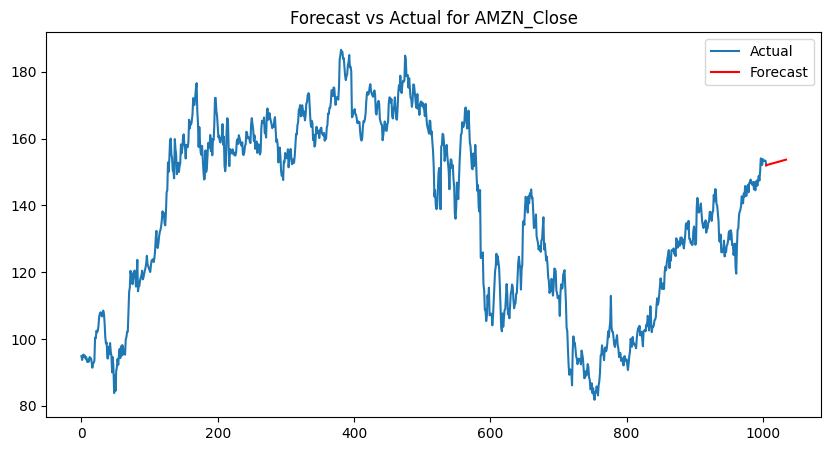

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for GOOGL_Close:
 1005    139.788622
1006    139.858299
1007    139.929288
1008    140.000217
1009    140.071149
1010    140.142081
1011    140.213013
1012    140.283944
1013    140.354876
1014    140.425808
1015    140.496740
1016    140.567671
1017    140.638603
1018    140.709535
1019    140.780467
1020    140.851399
1021    140.922330
1022    140.993262
1023    141.064194
1024    141.135126
1025    141.206057
1026    141.276989
1027    141.347921
1028    141.418853
1029    141.489785
1030    141.560716
1031    141.631648
1032    141.702580
1033    141.773512
1034    141.844443
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


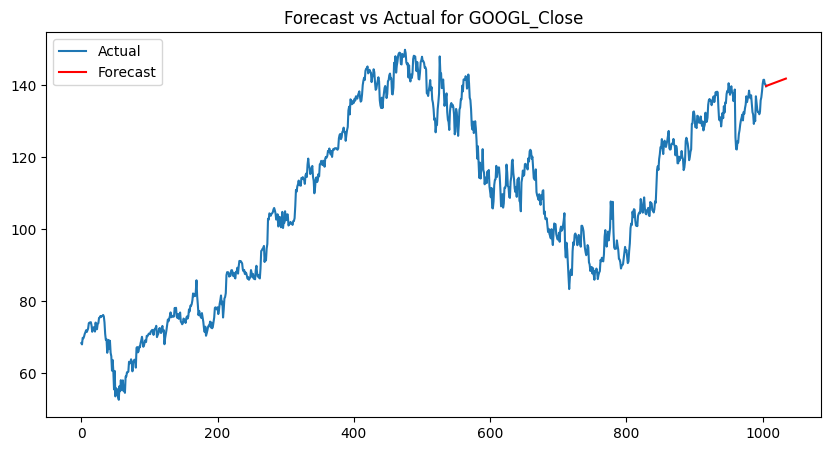

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for META_Close:
 1005    354.754403
1006    355.316630
1007    355.889315
1008    356.461529
1009    357.033765
1010    357.605999
1011    358.178234
1012    358.750469
1013    359.322703
1014    359.894938
1015    360.467172
1016    361.039407
1017    361.611642
1018    362.183876
1019    362.756111
1020    363.328345
1021    363.900580
1022    364.472815
1023    365.045049
1024    365.617284
1025    366.189519
1026    366.761753
1027    367.333988
1028    367.906222
1029    368.478457
1030    369.050692
1031    369.622926
1032    370.195161
1033    370.767395
1034    371.339630
Name: predicted_mean, dtype: float64


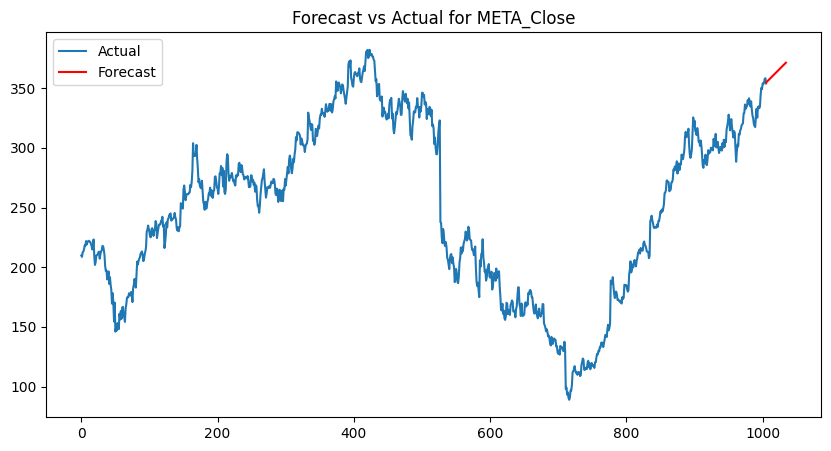

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_Close:
 1005    487.505772
1006    487.953660
1007    488.408982
1008    488.863994
1009    489.319019
1010    489.774043
1011    490.229068
1012    490.684092
1013    491.139116
1014    491.594141
1015    492.049165
1016    492.504189
1017    492.959213
1018    493.414238
1019    493.869262
1020    494.324286
1021    494.779311
1022    495.234335
1023    495.689359
1024    496.144383
1025    496.599408
1026    497.054432
1027    497.509456
1028    497.964481
1029    498.419505
1030    498.874529
1031    499.329553
1032    499.784578
1033    500.239602
1034    500.694626
Name: predicted_mean, dtype: float64


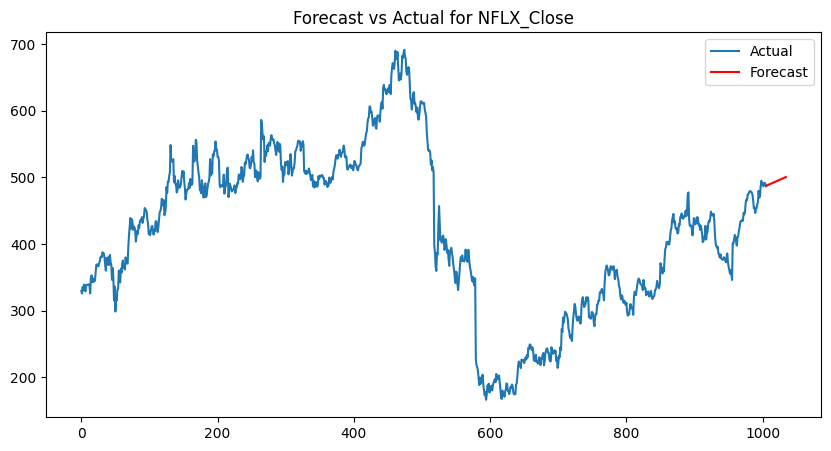

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AAPL_Open:
 1005    194.039421
1006    194.157545
1007    194.276864
1008    194.396117
1009    194.515373
1010    194.634629
1011    194.753886
1012    194.873142
1013    194.992398
1014    195.111654
1015    195.230910
1016    195.350166
1017    195.469422
1018    195.588679
1019    195.707935
1020    195.827191
1021    195.946447
1022    196.065703
1023    196.184959
1024    196.304215
1025    196.423472
1026    196.542728
1027    196.661984
1028    196.781240
1029    196.900496
1030    197.019752
1031    197.139008
1032    197.258265
1033    197.377521
1034    197.496777
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


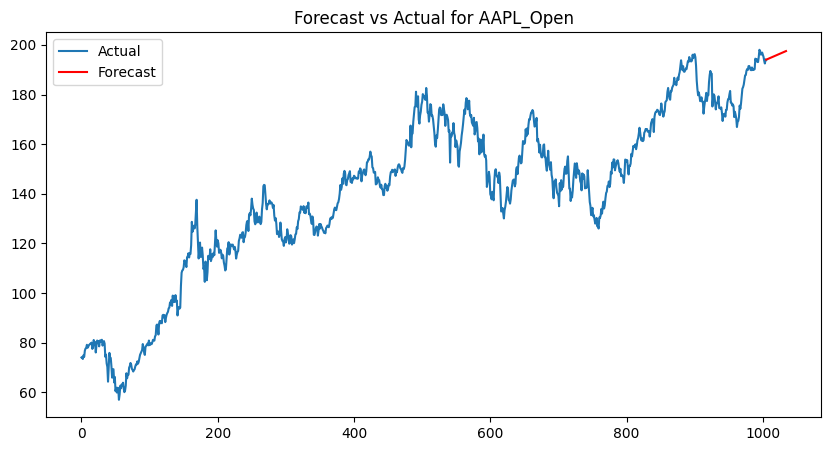

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AMZN_Open:
 1005    153.189695
1006    153.247433
1007    153.306611
1008    153.365723
1009    153.424838
1010    153.483954
1011    153.543069
1012    153.602184
1013    153.661299
1014    153.720415
1015    153.779530
1016    153.838645
1017    153.897760
1018    153.956875
1019    154.015991
1020    154.075106
1021    154.134221
1022    154.193336
1023    154.252452
1024    154.311567
1025    154.370682
1026    154.429797
1027    154.488913
1028    154.548028
1029    154.607143
1030    154.666258
1031    154.725373
1032    154.784489
1033    154.843604
1034    154.902719
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


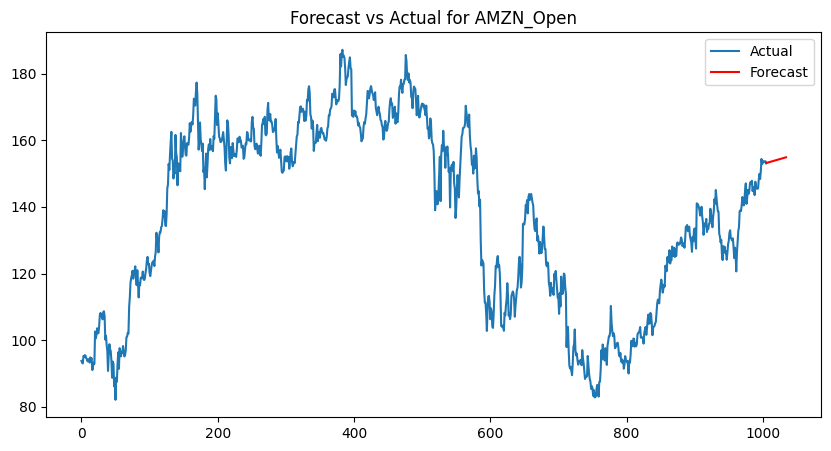

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for GOOGL_Open:
 1005    139.753364
1006    139.823064
1007    139.895025
1008    139.966891
1009    140.038761
1010    140.110631
1011    140.182500
1012    140.254370
1013    140.326240
1014    140.398110
1015    140.469979
1016    140.541849
1017    140.613719
1018    140.685588
1019    140.757458
1020    140.829328
1021    140.901198
1022    140.973067
1023    141.044937
1024    141.116807
1025    141.188676
1026    141.260546
1027    141.332416
1028    141.404286
1029    141.476155
1030    141.548025
1031    141.619895
1032    141.691764
1033    141.763634
1034    141.835504
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


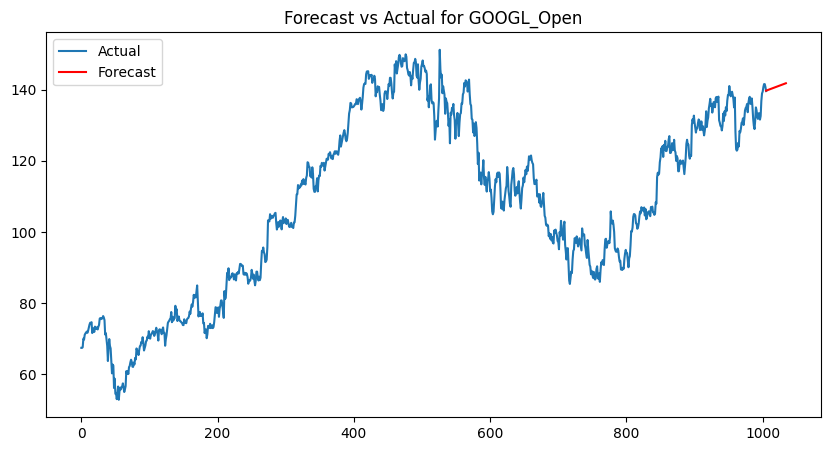

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for META_Open:
 1005    359.652977
1006    360.277093
1007    360.902309
1008    361.527494
1009    362.152680
1010    362.777867
1011    363.403053
1012    364.028239
1013    364.653425
1014    365.278611
1015    365.903797
1016    366.528983
1017    367.154170
1018    367.779356
1019    368.404542
1020    369.029728
1021    369.654914
1022    370.280100
1023    370.905286
1024    371.530473
1025    372.155659
1026    372.780845
1027    373.406031
1028    374.031217
1029    374.656403
1030    375.281589
1031    375.906776
1032    376.531962
1033    377.157148
1034    377.782334
Name: predicted_mean, dtype: float64


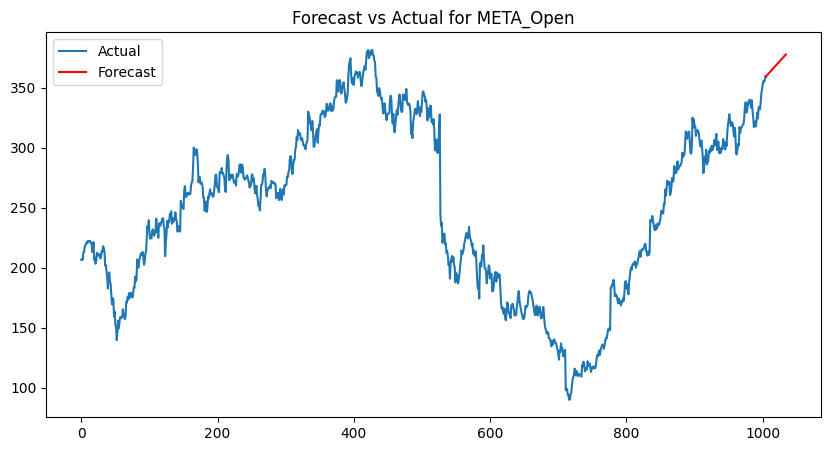

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


Forecast for NFLX_Open:
 1005    490.786106
1006    491.266043
1007    491.747972
1008    492.229962
1009    492.711955
1010    493.193947
1011    493.675940
1012    494.157932
1013    494.639925
1014    495.121917
1015    495.603910
1016    496.085902
1017    496.567895
1018    497.049887
1019    497.531880
1020    498.013872
1021    498.495865
1022    498.977857
1023    499.459850
1024    499.941842
1025    500.423835
1026    500.905828
1027    501.387820
1028    501.869813
1029    502.351805
1030    502.833798
1031    503.315790
1032    503.797783
1033    504.279775
1034    504.761768
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


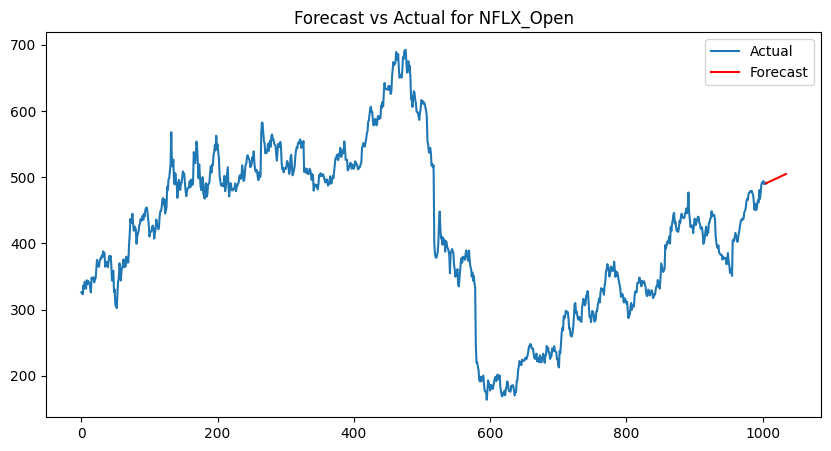

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AAPL_AdjClose_MA_5:
 1001    192.362973
1002    192.143688
1003    191.996864
1004    191.906975
1005    191.861823
1006    191.851823
1007    191.869443
1008    191.908765
1009    191.965140
1010    192.034914
1011    192.115216
1012    192.203791
1013    192.298866
1014    192.399048
1015    192.503244
1016    192.610593
1017    192.720419
1018    192.832192
1019    192.945496
1020    193.060001
1021    193.175450
1022    193.291642
1023    193.408416
1024    193.525649
1025    193.643242
1026    193.761118
1027    193.879216
1028    193.997489
1029    194.115899
1030    194.234416
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


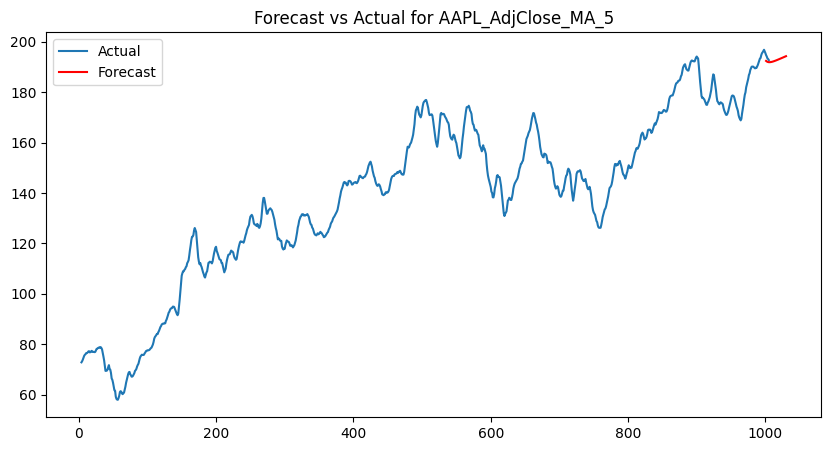

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AAPL_AdjClose_MA_10:
 996     193.519872
997     192.967300
998     192.415213
999     191.862984
1000    191.310796
1001    190.758596
1002    190.206400
1003    189.654202
1004    189.102005
1005    188.549808
1006    187.997611
1007    187.445413
1008    186.893216
1009    186.341019
1010    185.788822
1011    185.236625
1012    184.684428
1013    184.132230
1014    183.580033
1015    183.027836
1016    182.475639
1017    181.923442
1018    181.371244
1019    180.819047
1020    180.266850
1021    179.714653
1022    179.162456
1023    178.610259
1024    178.058061
1025    177.505864
Name: predicted_mean, dtype: float64


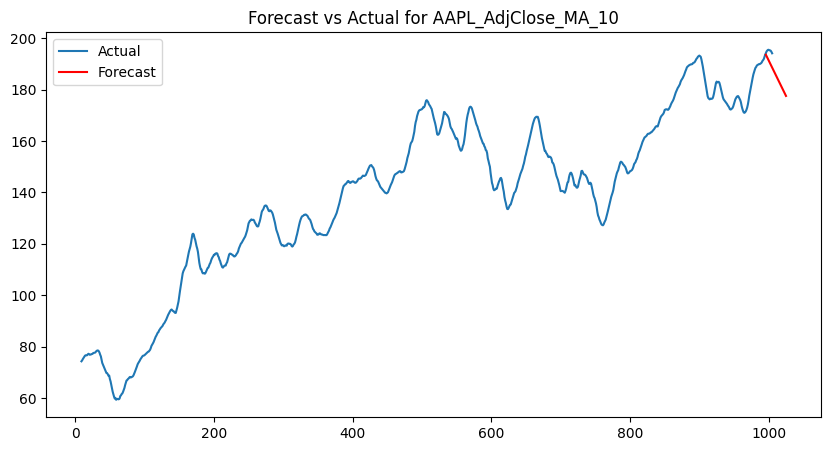

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AAPL_AdjClose_MA_20:
 986     193.929886
987     194.063023
988     194.196662
989     194.330498
990     194.464413
991     194.598358
992     194.732316
993     194.866279
994     195.000243
995     195.134208
996     195.268174
997     195.402139
998     195.536105
999     195.670070
1000    195.804036
1001    195.938002
1002    196.071967
1003    196.205933
1004    196.339899
1005    196.473864
1006    196.607830
1007    196.741796
1008    196.875761
1009    197.009727
1010    197.143692
1011    197.277658
1012    197.411624
1013    197.545589
1014    197.679555
1015    197.813521
Name: predicted_mean, dtype: float64


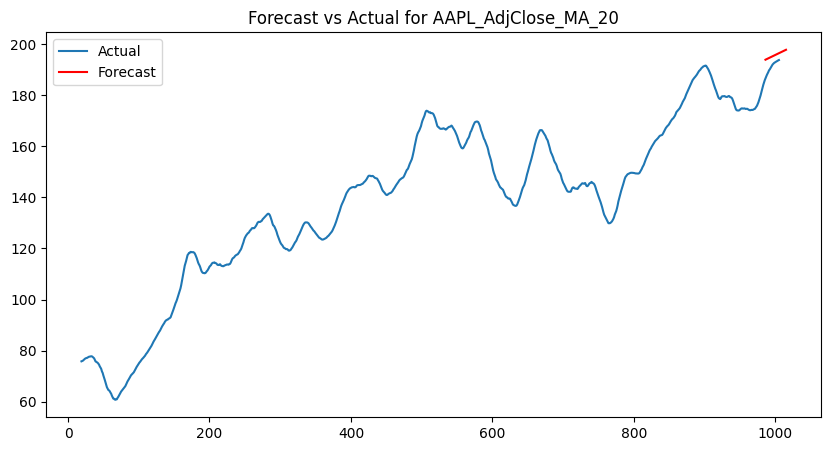

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AAPL_AdjClose_MA_50:
 956    186.407022
957    186.743591
958    187.079927
959    187.416117
960    187.752216
961    188.088258
962    188.424265
963    188.760250
964    189.096221
965    189.432183
966    189.768139
967    190.104093
968    190.440044
969    190.775994
970    191.111943
971    191.447892
972    191.783840
973    192.119788
974    192.455736
975    192.791684
976    193.127631
977    193.463579
978    193.799527
979    194.135475
980    194.471422
981    194.807370
982    195.143318
983    195.479266
984    195.815213
985    196.151161
Name: predicted_mean, dtype: float64


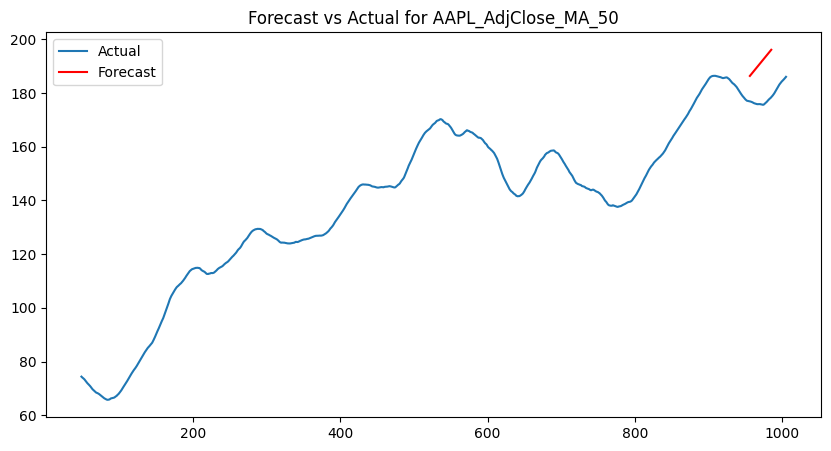

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AAPL_AdjClose_MA_100:
 906    181.667755
907    181.798704
908    181.929588
909    182.060452
910    182.191309
911    182.322164
912    182.453018
913    182.583872
914    182.714725
915    182.845579
916    182.976433
917    183.107286
918    183.238140
919    183.368994
920    183.499847
921    183.630701
922    183.761555
923    183.892408
924    184.023262
925    184.154115
926    184.284969
927    184.415823
928    184.546676
929    184.677530
930    184.808384
931    184.939237
932    185.070091
933    185.200945
934    185.331798
935    185.462652
Name: predicted_mean, dtype: float64


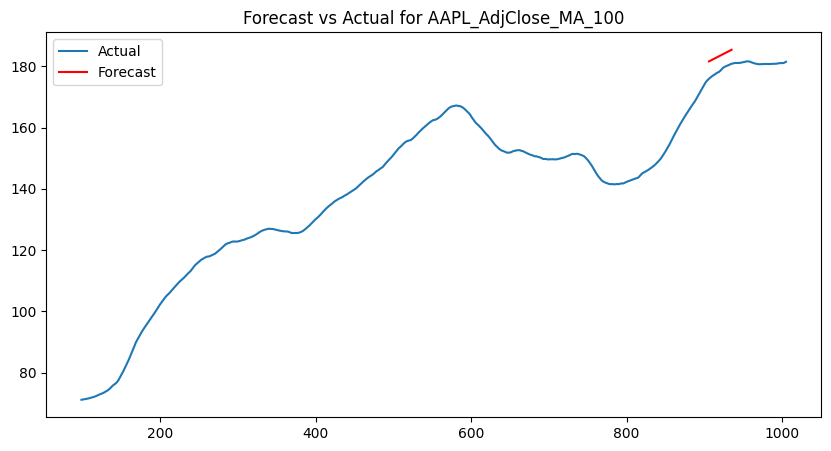

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AAPL_Open_MA_5:
 1001    193.554488
1002    193.345015
1003    193.212231
1004    193.138238
1005    193.109314
1006    193.114941
1007    193.147054
1008    193.199473
1009    193.267458
1010    193.347376
1011    193.436442
1012    193.532521
1013    193.633976
1014    193.739553
1015    193.848289
1016    193.959448
1017    194.072463
1018    194.186902
1019    194.302432
1020    194.418798
1021    194.535806
1022    194.653305
1023    194.771182
1024    194.889347
1025    195.007734
1026    195.126290
1027    195.244977
1028    195.363764
1029    195.482627
1030    195.601549
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


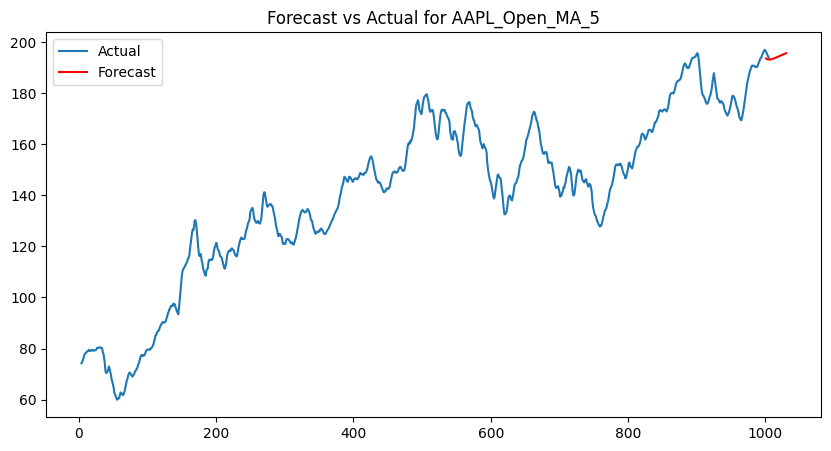

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AAPL_Open_MA_10:
 996     194.821493
997     194.441958
998     194.065847
999     193.691044
1000    193.316739
1001    192.942626
1002    192.568585
1003    192.194572
1004    191.820569
1005    191.446571
1006    191.072574
1007    190.698577
1008    190.324581
1009    189.950585
1010    189.576589
1011    189.202593
1012    188.828597
1013    188.454601
1014    188.080605
1015    187.706609
1016    187.332613
1017    186.958617
1018    186.584621
1019    186.210625
1020    185.836629
1021    185.462633
1022    185.088637
1023    184.714641
1024    184.340645
1025    183.966649
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


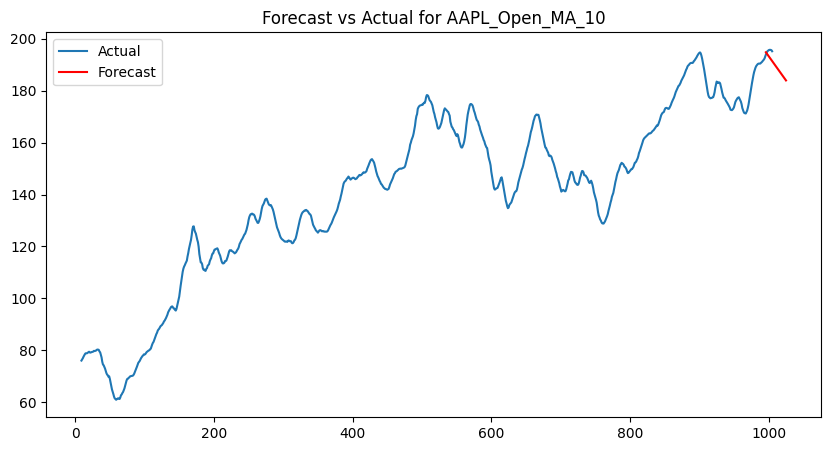

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AAPL_Open_MA_20:
 986     194.409632
987     194.608143
988     194.806282
989     195.004296
990     195.202268
991     195.400227
992     195.598182
993     195.796135
994     195.994087
995     196.192039
996     196.389991
997     196.587943
998     196.785895
999     196.983847
1000    197.181800
1001    197.379752
1002    197.577704
1003    197.775656
1004    197.973608
1005    198.171560
1006    198.369512
1007    198.567464
1008    198.765416
1009    198.963368
1010    199.161320
1011    199.359272
1012    199.557224
1013    199.755176
1014    199.953129
1015    200.151081
Name: predicted_mean, dtype: float64


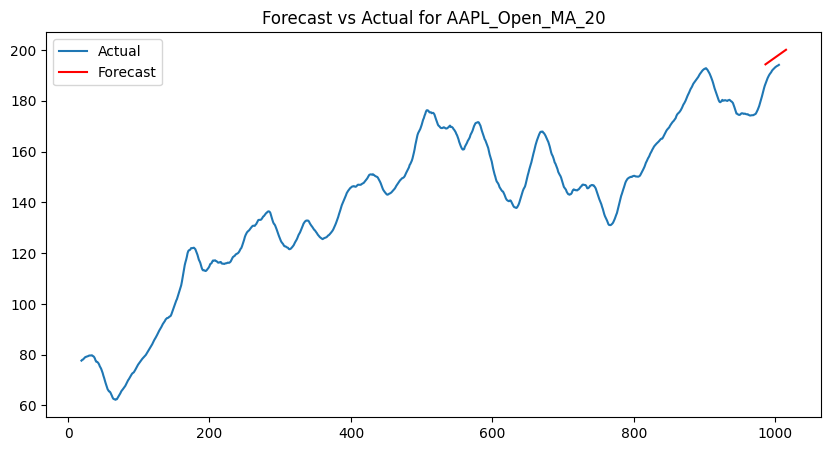

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AAPL_Open_MA_50:
 956    186.722877
957    187.086012
958    187.448535
959    187.810729
960    188.172747
961    188.534669
962    188.896541
963    189.258385
964    189.620214
965    189.982036
966    190.343853
967    190.705668
968    191.067482
969    191.429295
970    191.791108
971    192.152920
972    192.514733
973    192.876545
974    193.238357
975    193.600170
976    193.961982
977    194.323795
978    194.685607
979    195.047419
980    195.409232
981    195.771044
982    196.132856
983    196.494669
984    196.856481
985    197.218294
Name: predicted_mean, dtype: float64


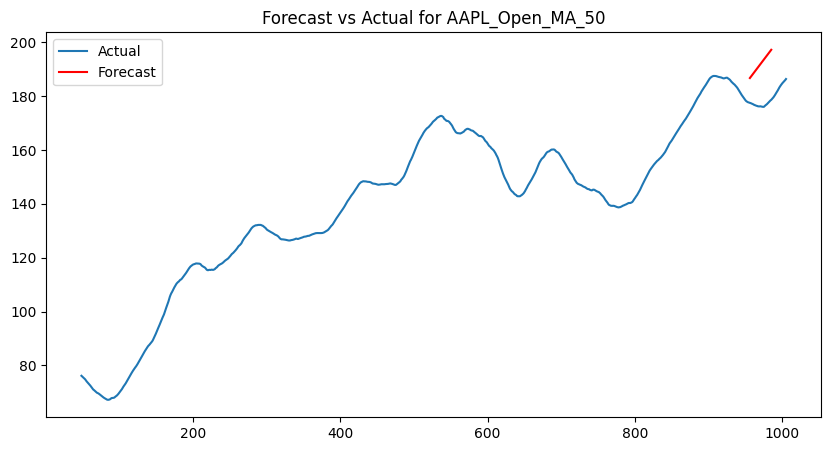

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AAPL_Open_MA_100:
 906    182.115382
907    182.251205
908    182.386139
909    182.520670
910    182.655018
911    182.789284
912    182.923512
913    183.057723
914    183.191926
915    183.326125
916    183.460323
917    183.594520
918    183.728717
919    183.862914
920    183.997111
921    184.131307
922    184.265504
923    184.399701
924    184.533897
925    184.668094
926    184.802290
927    184.936487
928    185.070684
929    185.204880
930    185.339077
931    185.473274
932    185.607470
933    185.741667
934    185.875864
935    186.010060
Name: predicted_mean, dtype: float64


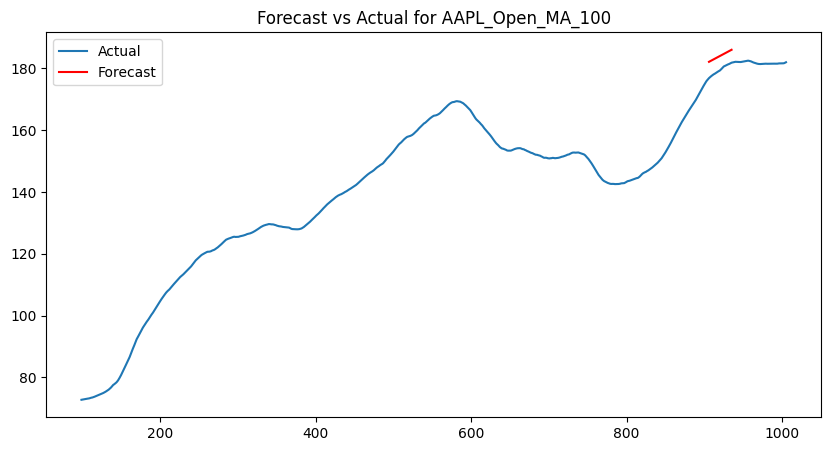

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AAPL_Close_MA_5:
 1001    192.869449
1002    192.649143
1003    192.501291
1004    192.410347
1005    192.364100
1006    192.352959
1007    192.369393
1008    192.407485
1009    192.462587
1010    192.531050
1011    192.610007
1012    192.697206
1013    192.790879
1014    192.889637
1015    192.992389
1016    193.098277
1017    193.206630
1018    193.316917
1019    193.428724
1020    193.541725
1021    193.655664
1022    193.770340
1023    193.885593
1024    194.001301
1025    194.117366
1026    194.233711
1027    194.350277
1028    194.467015
1029    194.583889
1030    194.700870
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


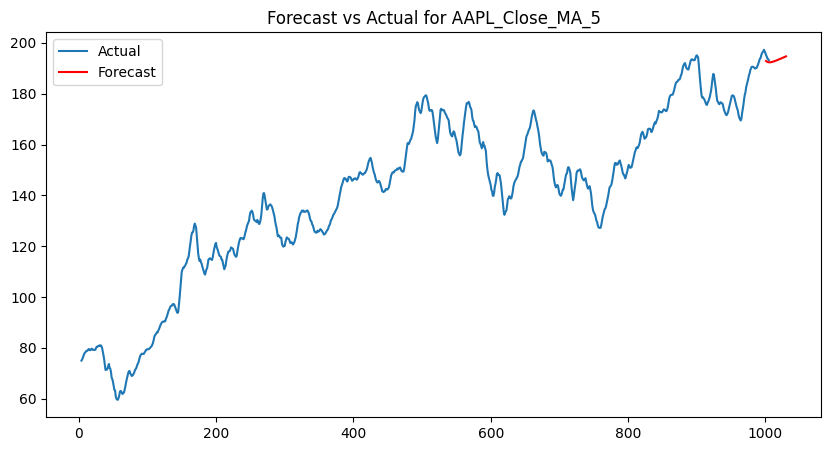

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AAPL_Close_MA_10:
 996     194.029759
997     193.475849
998     192.922423
999     192.368856
1000    191.815330
1001    191.261792
1002    190.708258
1003    190.154722
1004    189.601187
1005    189.047652
1006    188.494117
1007    187.940582
1008    187.387046
1009    186.833511
1010    186.279976
1011    185.726441
1012    185.172906
1013    184.619371
1014    184.065835
1015    183.512300
1016    182.958765
1017    182.405230
1018    181.851695
1019    181.298160
1020    180.744624
1021    180.191089
1022    179.637554
1023    179.084019
1024    178.530484
1025    177.976949
Name: predicted_mean, dtype: float64


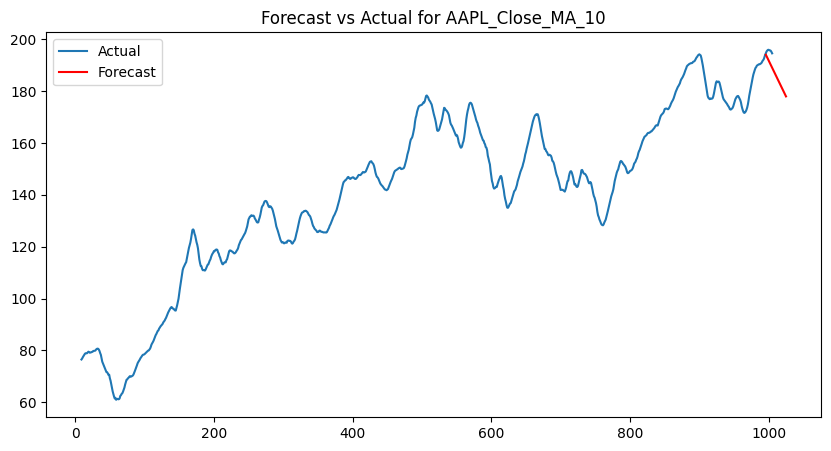

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AAPL_Close_MA_20:
 986     194.440743
987     194.574263
988     194.708287
989     194.842510
990     194.976811
991     195.111143
992     195.245487
993     195.379836
994     195.514187
995     195.648539
996     195.782890
997     195.917243
998     196.051595
999     196.185947
1000    196.320299
1001    196.454651
1002    196.589003
1003    196.723355
1004    196.857708
1005    196.992060
1006    197.126412
1007    197.260764
1008    197.395116
1009    197.529468
1010    197.663821
1011    197.798173
1012    197.932525
1013    198.066877
1014    198.201229
1015    198.335581
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


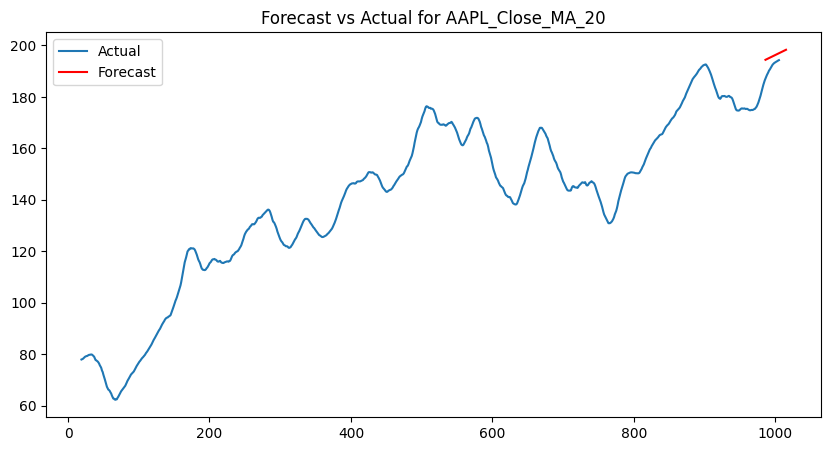

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AAPL_Close_MA_50:
 956    186.967006
957    187.299837
958    187.632435
959    187.964886
960    188.297244
961    188.629545
962    188.961810
963    189.294052
964    189.626280
965    189.958499
966    190.290712
967    190.622922
968    190.955129
969    191.287335
970    191.619541
971    191.951746
972    192.283950
973    192.616154
974    192.948358
975    193.280562
976    193.612766
977    193.944970
978    194.277174
979    194.609378
980    194.941581
981    195.273785
982    195.605989
983    195.938193
984    196.270397
985    196.602601
Name: predicted_mean, dtype: float64


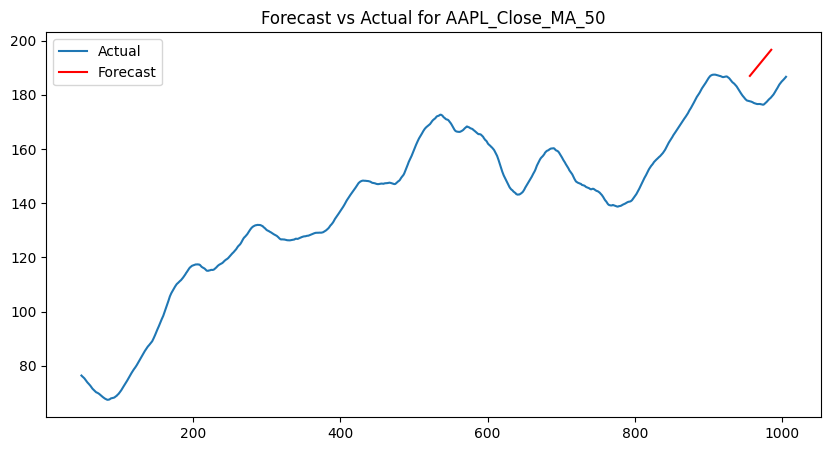

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AAPL_Close_MA_100:
 906    182.300103
907    182.426750
908    182.553348
909    182.679931
910    182.806509
911    182.933085
912    183.059662
913    183.186238
914    183.312813
915    183.439389
916    183.565965
917    183.692541
918    183.819117
919    183.945693
920    184.072269
921    184.198845
922    184.325421
923    184.451996
924    184.578572
925    184.705148
926    184.831724
927    184.958300
928    185.084876
929    185.211452
930    185.338028
931    185.464604
932    185.591179
933    185.717755
934    185.844331
935    185.970907
Name: predicted_mean, dtype: float64


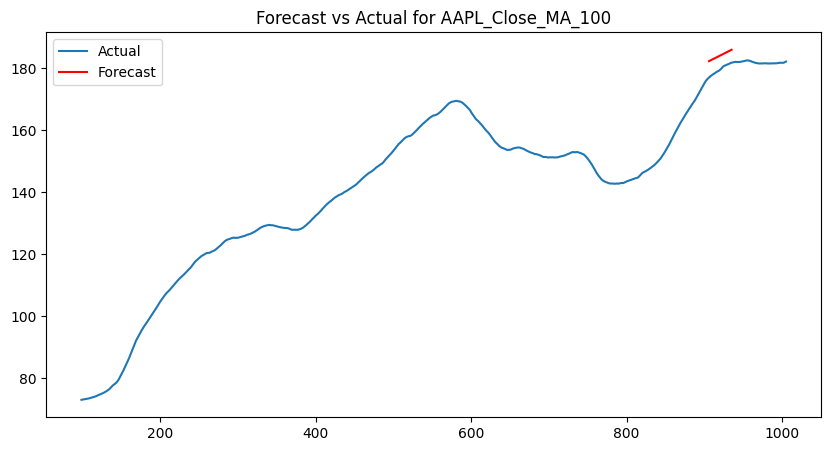

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AMZN_AdjClose_MA_5:
 1001    152.800729
1002    152.430187
1003    152.124539
1004    151.761415
1005    151.449197
1006    151.091892
1007    150.774520
1008    150.421780
1009    150.100365
1010    149.751206
1011    149.426619
1012    149.080269
1013    148.753195
1014    148.409048
1015    148.080022
1016    147.737604
1017    147.407047
1018    147.065984
1019    146.734227
1020    146.394228
1021    146.061528
1022    145.722364
1023    145.388925
1024    145.050415
1025    144.716397
1026    144.378400
1027    144.043927
1028    143.706333
1029    143.371503
1030    143.034226
Name: predicted_mean, dtype: float64


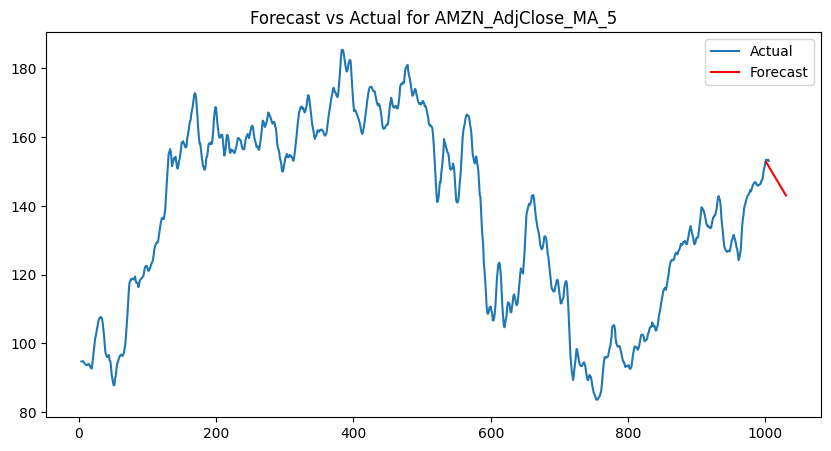

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for AMZN_AdjClose_MA_10:
 996     153.379984
997     153.831979
998     154.283967
999     154.735959
1000    155.187949
1001    155.639939
1002    156.091930
1003    156.543920
1004    156.995911
1005    157.447901
1006    157.899892
1007    158.351882
1008    158.803873
1009    159.255864
1010    159.707854
1011    160.159845
1012    160.611835
1013    161.063826
1014    161.515816
1015    161.967807
1016    162.419797
1017    162.871788
1018    163.323778
1019    163.775769
1020    164.227759
1021    164.679750
1022    165.131740
1023    165.583731
1024    166.035721
1025    166.487712
Name: predicted_mean, dtype: float64


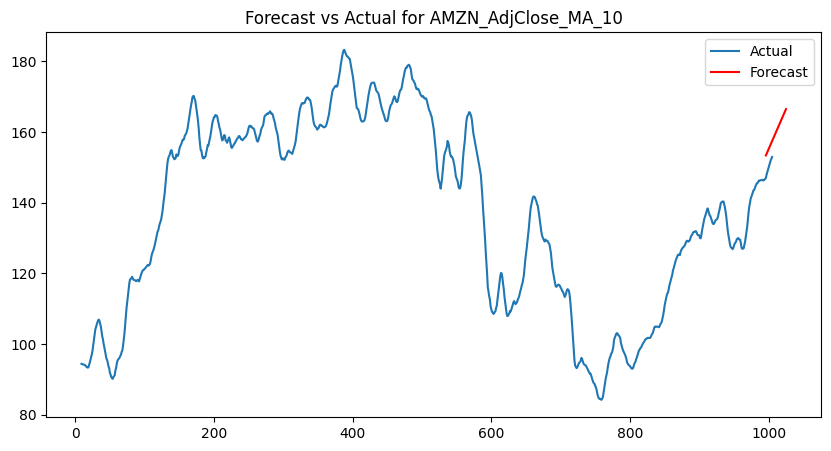

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for AMZN_AdjClose_MA_20:
 986     150.117362
987     150.410718
988     150.704074
989     150.997430
990     151.290786
991     151.584142
992     151.877498
993     152.170854
994     152.464210
995     152.757566
996     153.050922
997     153.344278
998     153.637634
999     153.930990
1000    154.224346
1001    154.517702
1002    154.811058
1003    155.104414
1004    155.397770
1005    155.691126
1006    155.984481
1007    156.277837
1008    156.571193
1009    156.864549
1010    157.157905
1011    157.451261
1012    157.744617
1013    158.037973
1014    158.331329
1015    158.624685
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


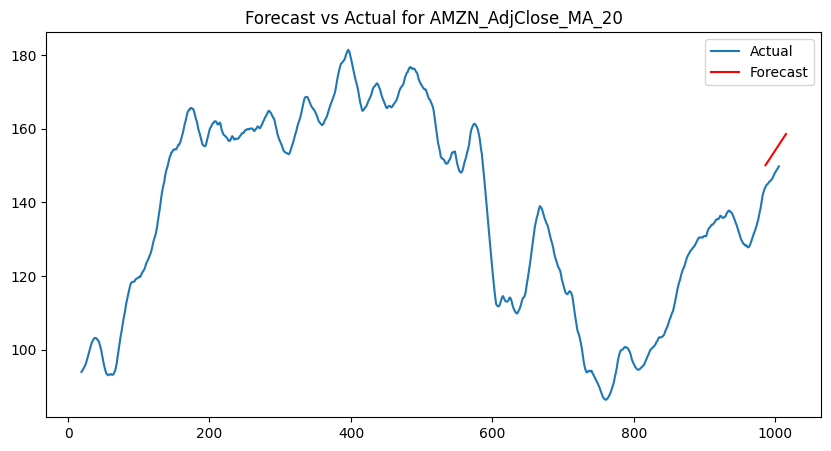

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for AMZN_AdjClose_MA_50:
 956    143.524129
957    144.000823
958    144.478963
959    144.955963
960    145.433862
961    145.911052
962    146.388800
963    146.866109
964    147.343764
965    147.821146
966    148.298744
967    148.776172
968    149.253733
969    149.731189
970    150.208728
971    150.686202
972    151.163727
973    151.641212
974    152.118728
975    152.596220
976    153.073731
977    153.551227
978    154.028735
979    154.506233
980    154.983739
981    155.461239
982    155.938743
983    156.416244
984    156.893748
985    157.371249
Name: predicted_mean, dtype: float64


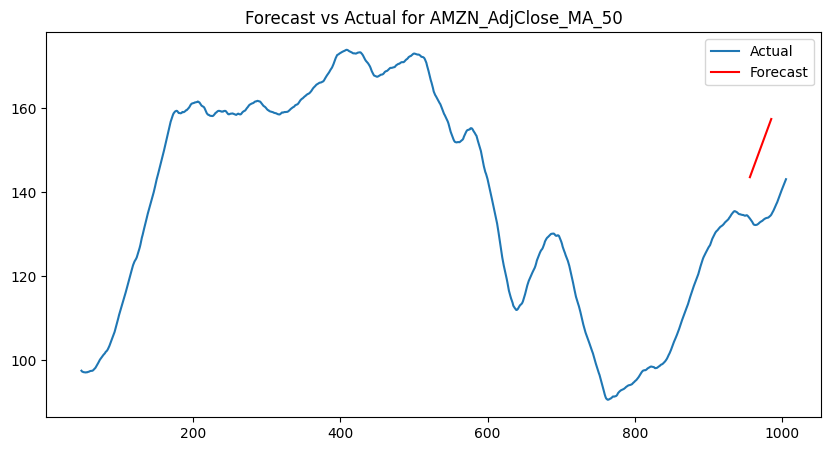

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for AMZN_AdjClose_MA_100:
 906    138.581486
907    138.701808
908    138.822759
909    138.943252
910    139.064078
911    139.184662
912    139.305422
913    139.426053
914    139.546779
915    139.667436
916    139.788143
917    139.908813
918    140.029510
919    140.150188
920    140.270880
921    140.391561
922    140.512250
923    140.632934
924    140.753621
925    140.874306
926    140.994993
927    141.115678
928    141.236364
929    141.357050
930    141.477736
931    141.598422
932    141.719108
933    141.839793
934    141.960479
935    142.081165
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


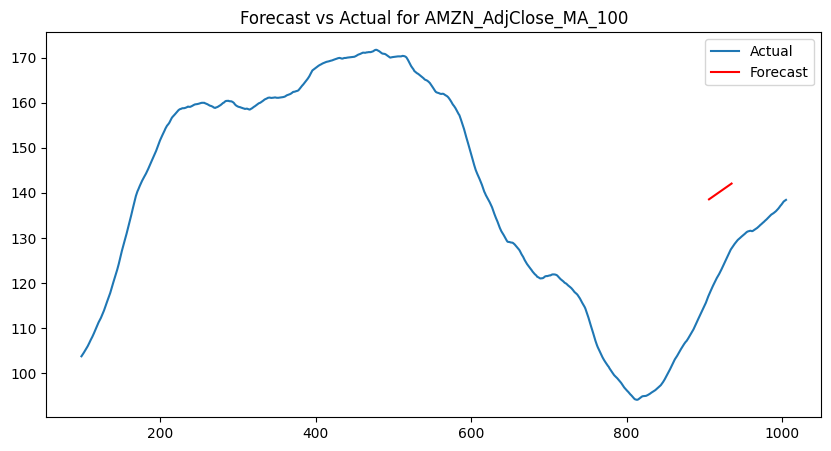

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AMZN_Open_MA_5:
 1001    153.524561
1002    153.524596
1003    153.538168
1004    153.562227
1005    153.594410
1006    153.632886
1007    153.676237
1008    153.723364
1009    153.773417
1010    153.825736
1011    153.879811
1012    153.935246
1013    153.991734
1014    154.049039
1015    154.106975
1016    154.165402
1017    154.224208
1018    154.283307
1019    154.342635
1020    154.402138
1021    154.461779
1022    154.521525
1023    154.581353
1024    154.641245
1025    154.701185
1026    154.761164
1027    154.821173
1028    154.881204
1029    154.941253
1030    155.001316
Name: predicted_mean, dtype: float64


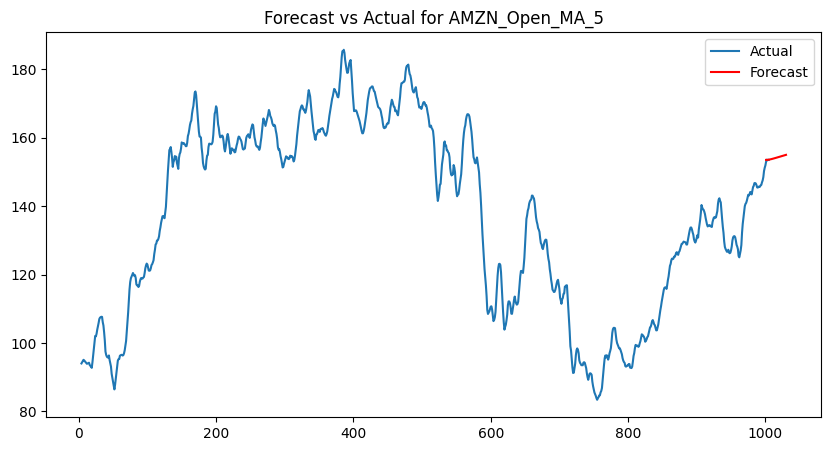

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AMZN_Open_MA_10:
 996     153.010871
997     153.269388
998     153.503870
999     153.717233
1000    153.912038
1001    154.090538
1002    154.254710
1003    154.406292
1004    154.546813
1005    154.677613
1006    154.799873
1007    154.914628
1008    155.022788
1009    155.125155
1010    155.222430
1011    155.315231
1012    155.404102
1013    155.489519
1014    155.571900
1015    155.651615
1016    155.728987
1017    155.804300
1018    155.877803
1019    155.949717
1020    156.020234
1021    156.089524
1022    156.157735
1023    156.224999
1024    156.291430
1025    156.357129
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


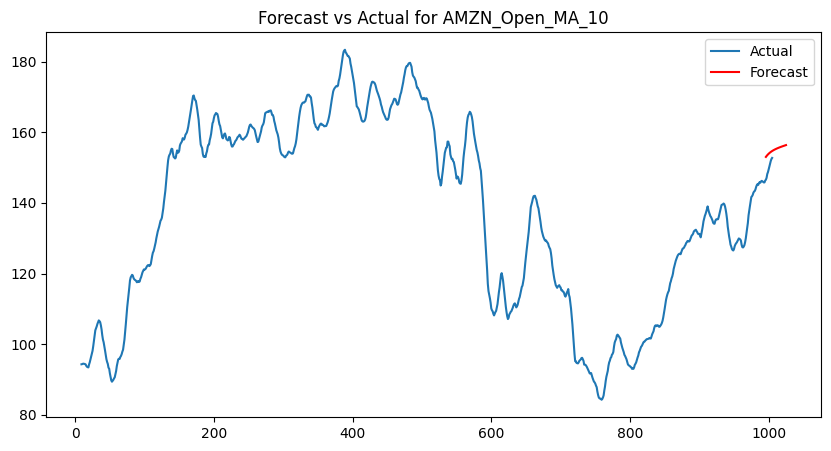

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for AMZN_Open_MA_20:
 986     149.921604
987     150.299947
988     150.660601
989     151.004575
990     151.332822
991     151.646239
992     151.945673
993     152.231923
994     152.505741
995     152.767837
996     153.018881
997     153.259502
998     153.490297
999     153.711826
1000    153.924618
1001    154.129172
1002    154.325958
1003    154.515421
1004    154.697977
1005    154.874021
1006    155.043926
1007    155.208041
1008    155.366697
1009    155.520206
1010    155.668861
1011    155.812940
1012    155.952704
1013    156.088400
1014    156.220259
1015    156.348500
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


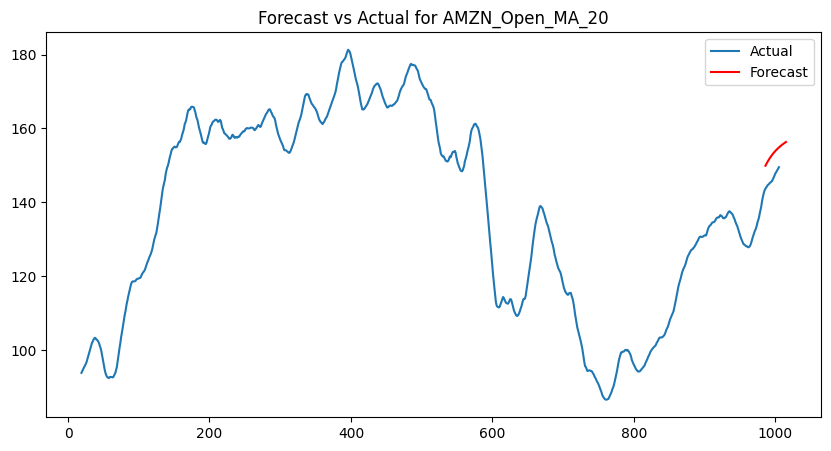

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AMZN_Open_MA_50:
 956    143.231636
957    143.695032
958    144.158271
959    144.621408
960    145.084477
961    145.547502
962    146.010497
963    146.473474
964    146.936439
965    147.399395
966    147.862346
967    148.325293
968    148.788238
969    149.251182
970    149.714125
971    150.177067
972    150.640008
973    151.102949
974    151.565891
975    152.028831
976    152.491772
977    152.954713
978    153.417654
979    153.880595
980    154.343536
981    154.806476
982    155.269417
983    155.732358
984    156.195299
985    156.658239
Name: predicted_mean, dtype: float64


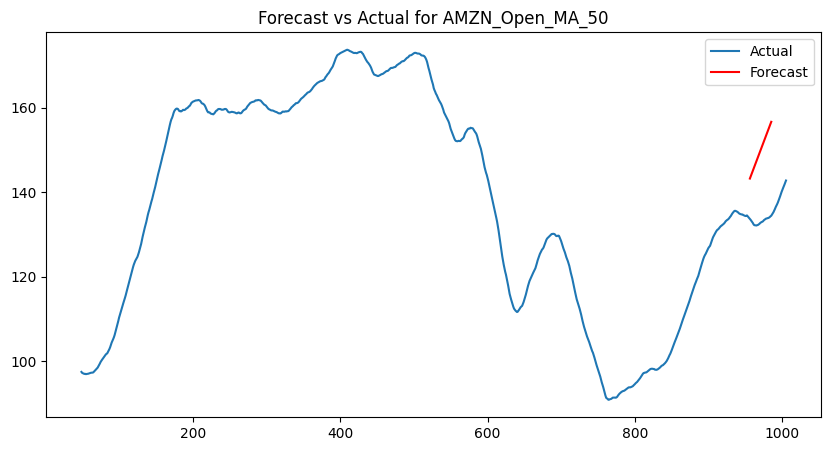

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for AMZN_Open_MA_100:
 906    138.447817
907    138.572633
908    138.697450
909    138.822266
910    138.947083
911    139.071899
912    139.196716
913    139.321532
914    139.446349
915    139.571165
916    139.695982
917    139.820798
918    139.945615
919    140.070431
920    140.195248
921    140.320064
922    140.444881
923    140.569697
924    140.694514
925    140.819330
926    140.944147
927    141.068963
928    141.193780
929    141.318596
930    141.443413
931    141.568229
932    141.693046
933    141.817862
934    141.942679
935    142.067495
Name: predicted_mean, dtype: float64


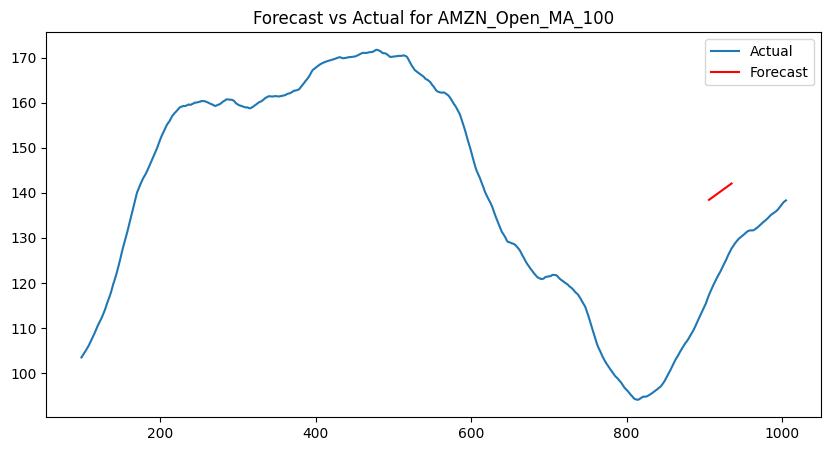

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for AMZN_Close_MA_5:
 1001    152.800729
1002    152.430187
1003    152.124539
1004    151.761415
1005    151.449197
1006    151.091892
1007    150.774520
1008    150.421780
1009    150.100365
1010    149.751206
1011    149.426619
1012    149.080269
1013    148.753195
1014    148.409048
1015    148.080022
1016    147.737604
1017    147.407047
1018    147.065984
1019    146.734227
1020    146.394228
1021    146.061528
1022    145.722364
1023    145.388925
1024    145.050415
1025    144.716397
1026    144.378400
1027    144.043927
1028    143.706333
1029    143.371503
1030    143.034226
Name: predicted_mean, dtype: float64


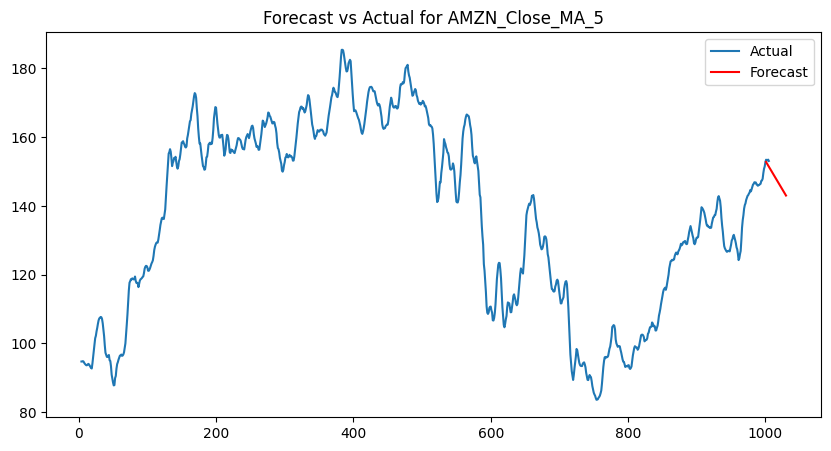

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for AMZN_Close_MA_10:
 996     153.379984
997     153.831979
998     154.283967
999     154.735959
1000    155.187949
1001    155.639939
1002    156.091930
1003    156.543920
1004    156.995911
1005    157.447901
1006    157.899892
1007    158.351882
1008    158.803873
1009    159.255864
1010    159.707854
1011    160.159845
1012    160.611835
1013    161.063826
1014    161.515816
1015    161.967807
1016    162.419797
1017    162.871788
1018    163.323778
1019    163.775769
1020    164.227759
1021    164.679750
1022    165.131740
1023    165.583731
1024    166.035721
1025    166.487712
Name: predicted_mean, dtype: float64


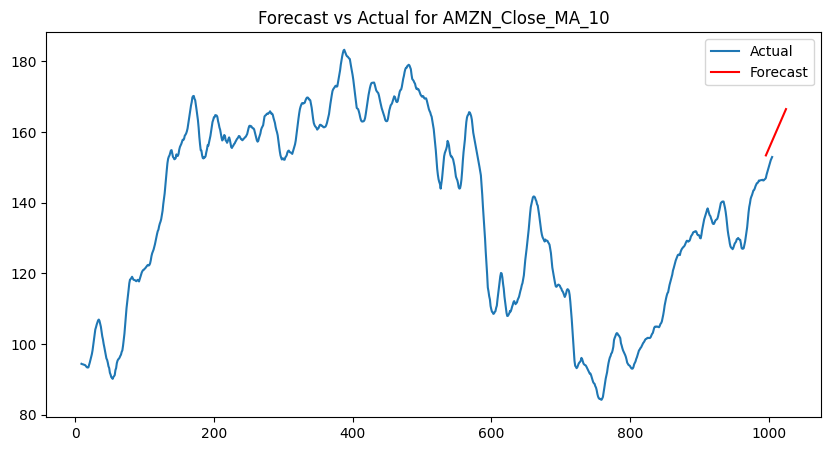

Forecast for AMZN_Close_MA_20:
 986     150.117362
987     150.410718
988     150.704074
989     150.997430
990     151.290786
991     151.584142
992     151.877498
993     152.170854
994     152.464210
995     152.757566
996     153.050922
997     153.344278
998     153.637634
999     153.930990
1000    154.224346
1001    154.517702
1002    154.811058
1003    155.104414
1004    155.397770
1005    155.691126
1006    155.984481
1007    156.277837
1008    156.571193
1009    156.864549
1010    157.157905
1011    157.451261
1012    157.744617
1013    158.037973
1014    158.331329
1015    158.624685
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

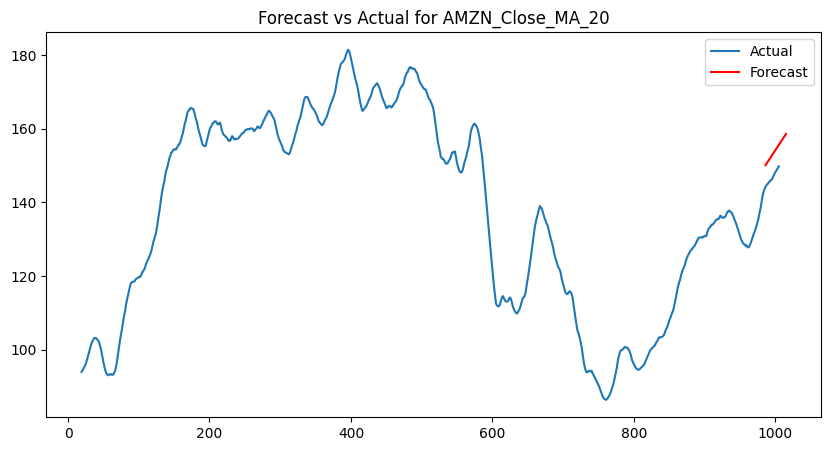

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for AMZN_Close_MA_50:
 956    143.524129
957    144.000823
958    144.478963
959    144.955963
960    145.433862
961    145.911052
962    146.388800
963    146.866109
964    147.343764
965    147.821146
966    148.298744
967    148.776172
968    149.253733
969    149.731189
970    150.208728
971    150.686202
972    151.163727
973    151.641212
974    152.118728
975    152.596220
976    153.073731
977    153.551227
978    154.028735
979    154.506233
980    154.983739
981    155.461239
982    155.938743
983    156.416244
984    156.893748
985    157.371249
Name: predicted_mean, dtype: float64


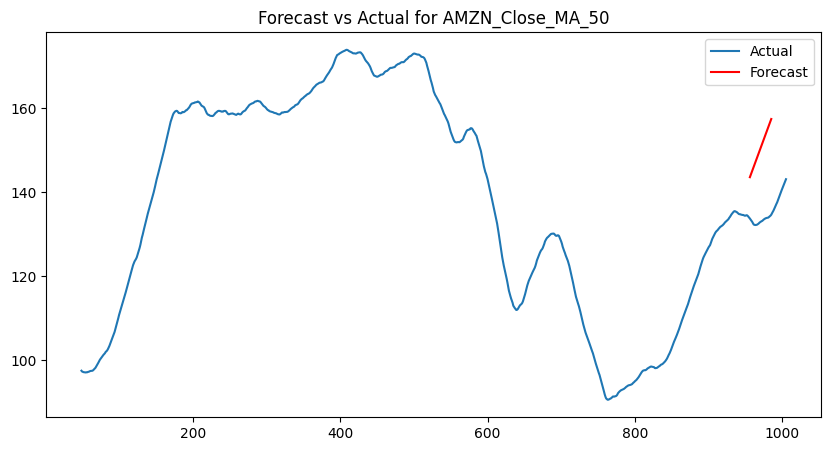

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for AMZN_Close_MA_100:
 906    138.581486
907    138.701808
908    138.822759
909    138.943252
910    139.064078
911    139.184662
912    139.305422
913    139.426053
914    139.546779
915    139.667436
916    139.788143
917    139.908813
918    140.029510
919    140.150188
920    140.270880
921    140.391561
922    140.512250
923    140.632934
924    140.753621
925    140.874306
926    140.994993
927    141.115678
928    141.236364
929    141.357050
930    141.477736
931    141.598422
932    141.719108
933    141.839793
934    141.960479
935    142.081165
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


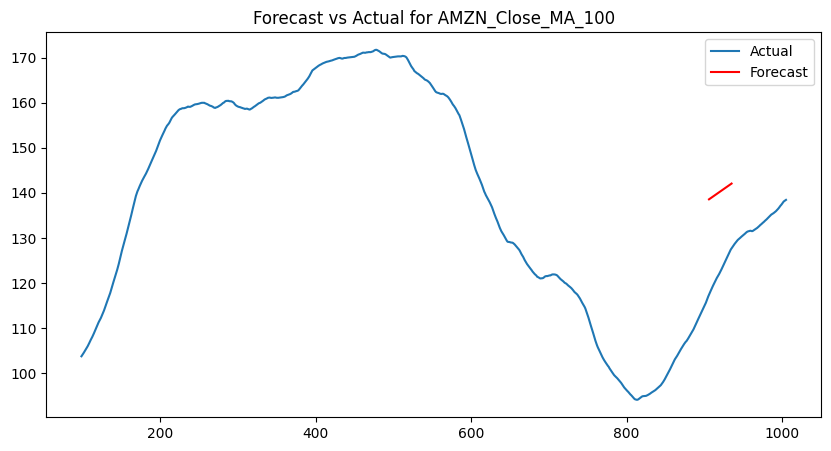

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for GOOGL_AdjClose_MA_5:
 1001    140.565465
1002    140.423710
1003    140.325281
1004    140.187098
1005    140.085391
1006    139.950216
1007    139.845749
1008    139.713106
1009    139.606316
1010    139.475805
1011    139.367058
1012    139.238342
1013    139.127949
1014    139.000744
1015    138.888964
1016    138.763031
1017    138.650084
1018    138.525222
1019    138.411293
1020    138.287332
1021    138.172575
1022    138.049374
1023    137.933921
1024    137.811358
1025    137.695319
1026    137.573294
1027    137.456761
1028    137.335189
1029    137.218241
1030    137.097050
Name: predicted_mean, dtype: float64


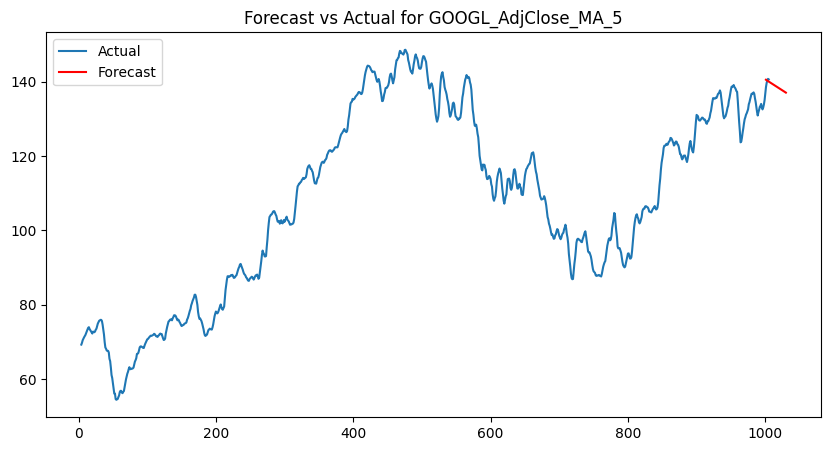

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for GOOGL_AdjClose_MA_10:
 996     139.485007
997     140.259434
998     141.033683
999     141.808008
1000    142.582300
1001    143.356606
1002    144.130907
1003    144.905209
1004    145.679511
1005    146.453813
1006    147.228115
1007    148.002417
1008    148.776720
1009    149.551022
1010    150.325324
1011    151.099626
1012    151.873928
1013    152.648230
1014    153.422532
1015    154.196834
1016    154.971136
1017    155.745438
1018    156.519740
1019    157.294042
1020    158.068344
1021    158.842646
1022    159.616949
1023    160.391251
1024    161.165553
1025    161.939855
Name: predicted_mean, dtype: float64


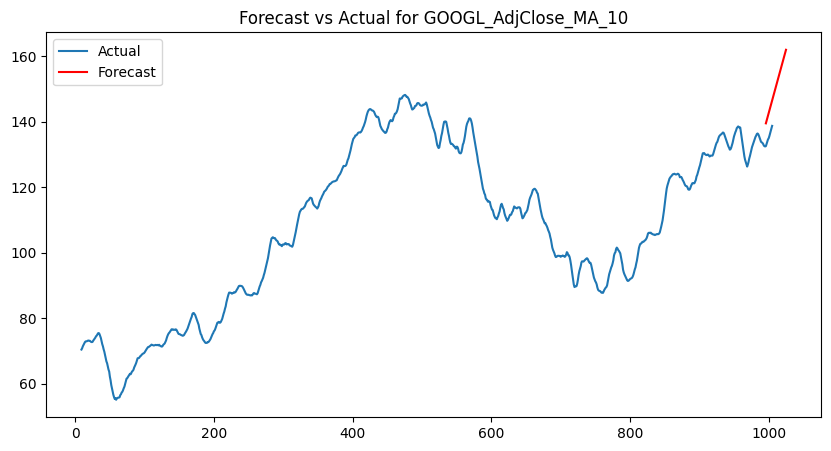

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for GOOGL_AdjClose_MA_20:
 986     135.930957
987     136.287229
988     136.643479
989     136.999726
990     137.355973
991     137.712219
992     138.068466
993     138.424713
994     138.780960
995     139.137206
996     139.493453
997     139.849700
998     140.205947
999     140.562193
1000    140.918440
1001    141.274687
1002    141.630934
1003    141.987180
1004    142.343427
1005    142.699674
1006    143.055921
1007    143.412167
1008    143.768414
1009    144.124661
1010    144.480908
1011    144.837154
1012    145.193401
1013    145.549648
1014    145.905895
1015    146.262141
Name: predicted_mean, dtype: float64


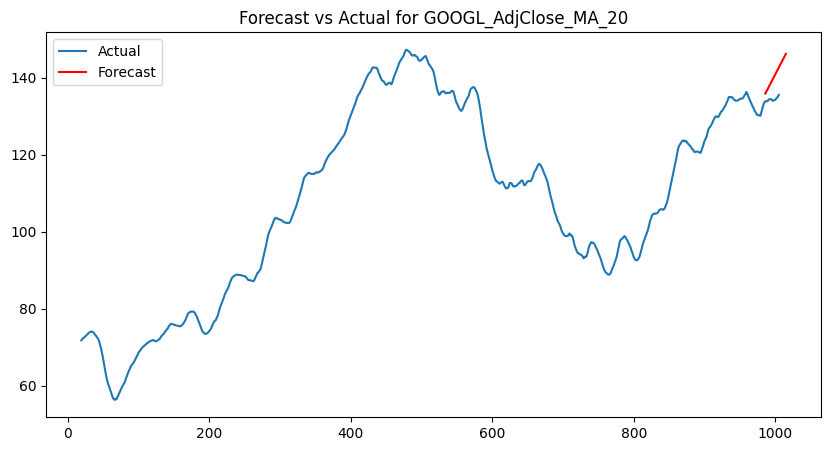

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for GOOGL_AdjClose_MA_50:
 956    133.631163
957    133.667625
958    133.704928
959    133.743018
960    133.781844
961    133.821358
962    133.861515
963    133.902273
964    133.943594
965    133.985440
966    134.027778
967    134.070576
968    134.113804
969    134.157434
970    134.201439
971    134.245796
972    134.290481
973    134.335474
974    134.380754
975    134.426303
976    134.472103
977    134.518137
978    134.564392
979    134.610851
980    134.657503
981    134.704334
982    134.751333
983    134.798489
984    134.845792
985    134.893232
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


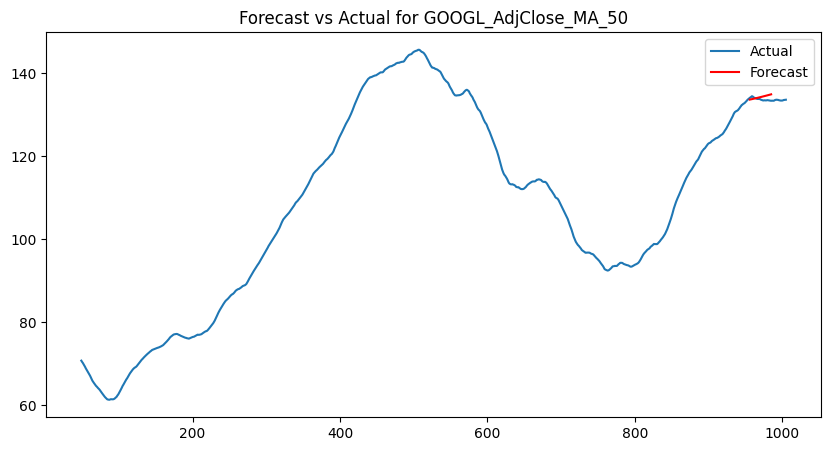

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for GOOGL_AdjClose_MA_100:
 906    133.821027
907    133.905999
908    133.991554
909    134.077512
910    134.163746
911    134.250172
912    134.336729
913    134.423378
914    134.510089
915    134.596843
916    134.683628
917    134.770432
918    134.857251
919    134.944080
920    135.030915
921    135.117756
922    135.204599
923    135.291444
924    135.378291
925    135.465139
926    135.551988
927    135.638838
928    135.725687
929    135.812537
930    135.899387
931    135.986237
932    136.073088
933    136.159938
934    136.246788
935    136.333639
Name: predicted_mean, dtype: float64


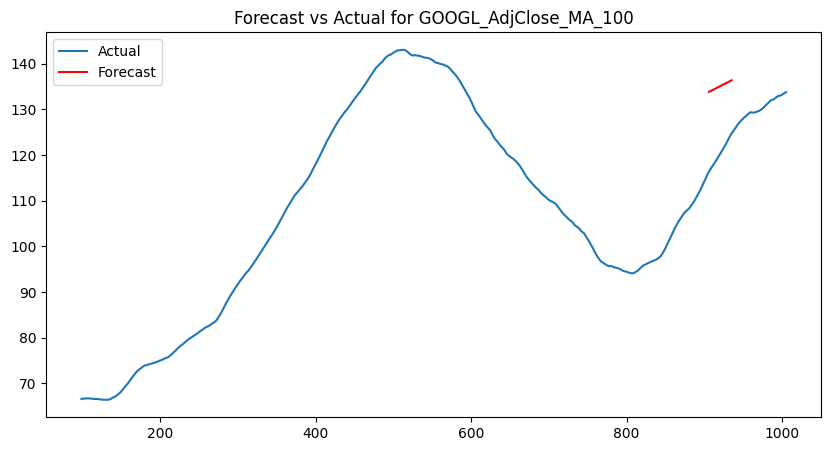

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for GOOGL_Open_MA_5:
 1001    140.917384
1002    140.947178
1003    140.990954
1004    141.022191
1005    141.064672
1006    141.097069
1007    141.138510
1008    141.171840
1009    141.212444
1010    141.246525
1011    141.286456
1012    141.321141
1013    141.360530
1014    141.395700
1015    141.434654
1016    141.470215
1017    141.508818
1018    141.544693
1019    141.583015
1020    141.619143
1021    141.657238
1022    141.693569
1023    141.731482
1024    141.767976
1025    141.805743
1026    141.842368
1027    141.880017
1028    141.916748
1029    141.954302
1030    141.991118
Name: predicted_mean, dtype: float64


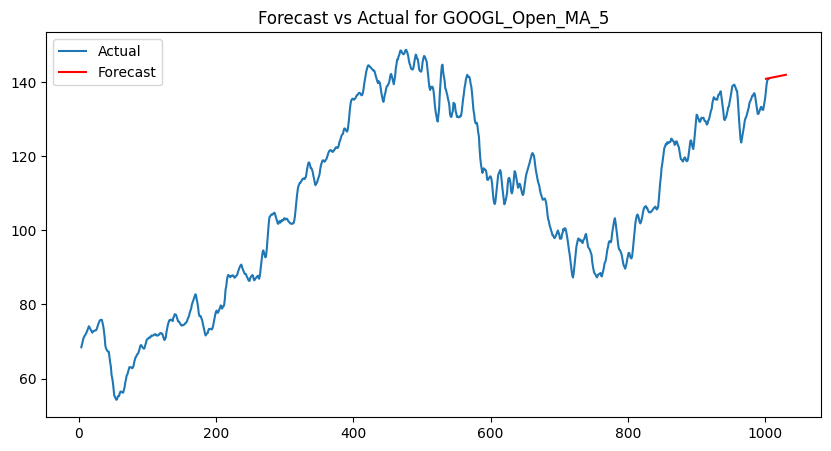

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for GOOGL_Open_MA_10:
 996     139.022416
997     139.647967
998     140.278878
999     140.904890
1000    141.535380
1001    142.161777
1002    142.791915
1003    143.418633
1004    144.048478
1005    144.675465
1006    145.305064
1007    145.932275
1008    146.561669
1009    147.189068
1010    147.818290
1011    148.445846
1012    149.074925
1013    149.702612
1014    150.331571
1015    150.959367
1016    151.588227
1017    152.216114
1018    152.844890
1019    153.472853
1020    154.101560
1021    154.729587
1022    155.358235
1023    155.986316
1024    156.614915
1025    157.243040
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


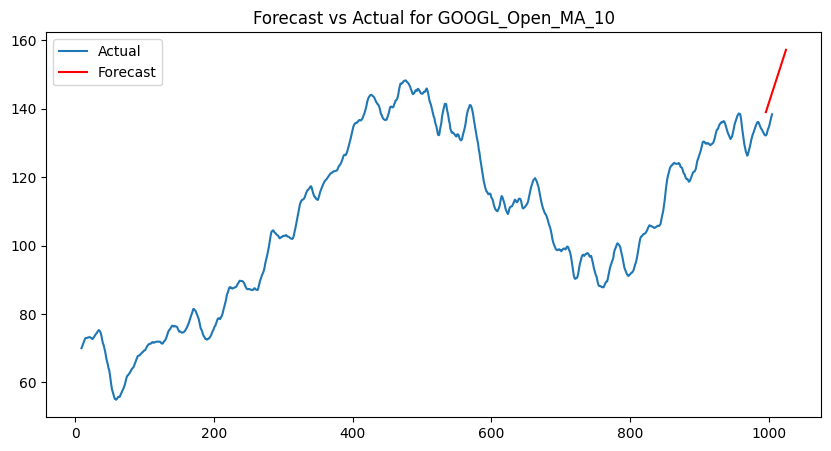

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for GOOGL_Open_MA_20:
 986     135.536311
987     135.762888
988     135.988719
989     136.214865
990     136.440879
991     136.666948
992     136.892994
993     137.119050
994     137.345102
995     137.571155
996     137.797208
997     138.023261
998     138.249313
999     138.475366
1000    138.701419
1001    138.927472
1002    139.153525
1003    139.379578
1004    139.605630
1005    139.831683
1006    140.057736
1007    140.283789
1008    140.509842
1009    140.735895
1010    140.961947
1011    141.188000
1012    141.414053
1013    141.640106
1014    141.866159
1015    142.092212
Name: predicted_mean, dtype: float64


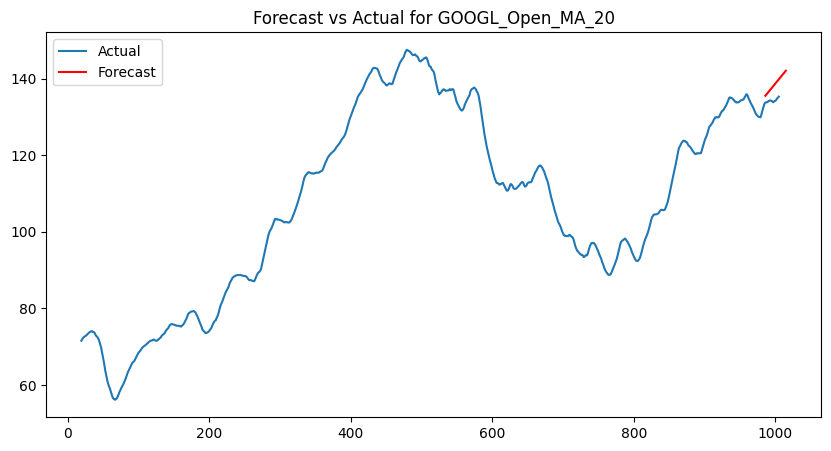

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for GOOGL_Open_MA_50:
 956    133.465631
957    133.470090
958    133.474577
959    133.479059
960    133.483543
961    133.488026
962    133.492509
963    133.496992
964    133.501476
965    133.505959
966    133.510442
967    133.514925
968    133.519408
969    133.523892
970    133.528375
971    133.532858
972    133.537341
973    133.541825
974    133.546308
975    133.550791
976    133.555274
977    133.559757
978    133.564241
979    133.568724
980    133.573207
981    133.577690
982    133.582174
983    133.586657
984    133.591140
985    133.595623
Name: predicted_mean, dtype: float64


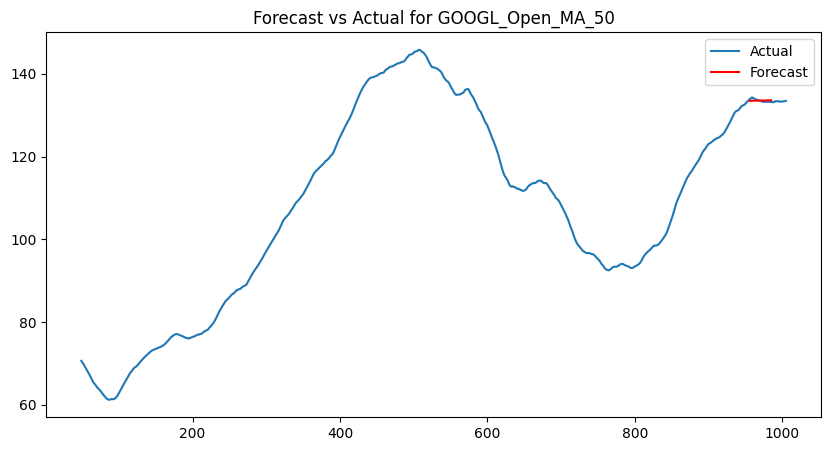

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for GOOGL_Open_MA_100:
 906    133.692354
907    133.783678
908    133.875002
909    133.966327
910    134.057651
911    134.148975
912    134.240300
913    134.331624
914    134.422948
915    134.514273
916    134.605597
917    134.696922
918    134.788246
919    134.879570
920    134.970895
921    135.062219
922    135.153544
923    135.244868
924    135.336192
925    135.427517
926    135.518841
927    135.610166
928    135.701490
929    135.792814
930    135.884139
931    135.975463
932    136.066787
933    136.158112
934    136.249436
935    136.340761
Name: predicted_mean, dtype: float64


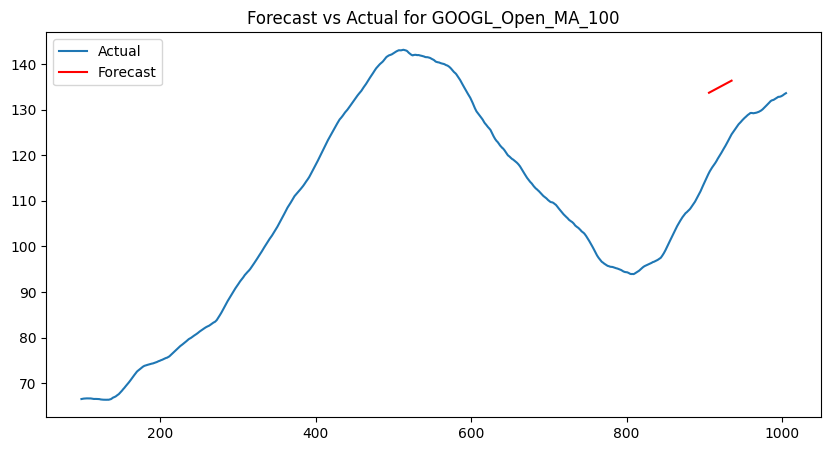

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for GOOGL_Close_MA_5:
 1001    140.565465
1002    140.423710
1003    140.325281
1004    140.187098
1005    140.085391
1006    139.950216
1007    139.845749
1008    139.713106
1009    139.606316
1010    139.475805
1011    139.367058
1012    139.238342
1013    139.127949
1014    139.000744
1015    138.888964
1016    138.763031
1017    138.650084
1018    138.525222
1019    138.411293
1020    138.287332
1021    138.172575
1022    138.049374
1023    137.933921
1024    137.811358
1025    137.695319
1026    137.573294
1027    137.456761
1028    137.335189
1029    137.218241
1030    137.097050
Name: predicted_mean, dtype: float64


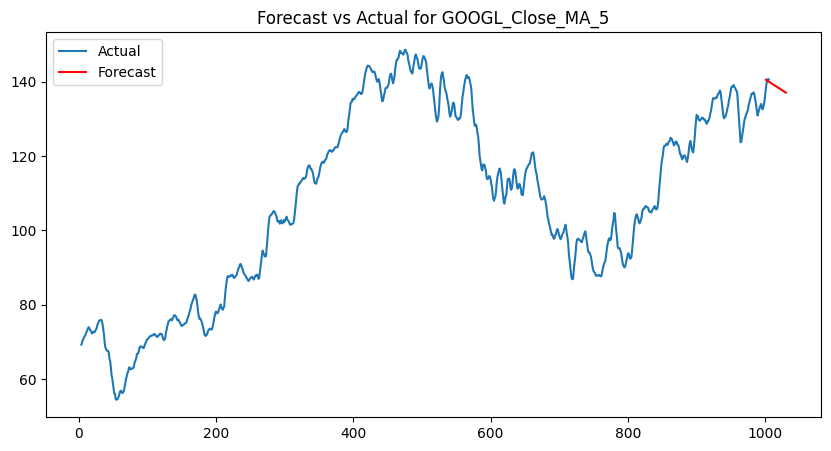

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for GOOGL_Close_MA_10:
 996     139.485007
997     140.259434
998     141.033683
999     141.808008
1000    142.582300
1001    143.356606
1002    144.130907
1003    144.905209
1004    145.679511
1005    146.453813
1006    147.228115
1007    148.002417
1008    148.776720
1009    149.551022
1010    150.325324
1011    151.099626
1012    151.873928
1013    152.648230
1014    153.422532
1015    154.196834
1016    154.971136
1017    155.745438
1018    156.519740
1019    157.294042
1020    158.068344
1021    158.842646
1022    159.616949
1023    160.391251
1024    161.165553
1025    161.939855
Name: predicted_mean, dtype: float64


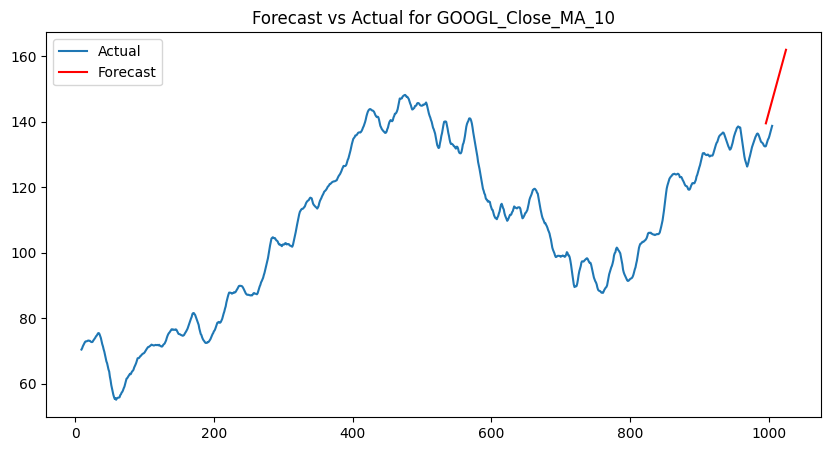

Forecast for GOOGL_Close_MA_20:
 986     135.930957
987     136.287229
988     136.643479
989     136.999726
990     137.355973
991     137.712219
992     138.068466
993     138.424713
994     138.780960
995     139.137206
996     139.493453
997     139.849700
998     140.205947
999     140.562193
1000    140.918440
1001    141.274687
1002    141.630934
1003    141.987180
1004    142.343427
1005    142.699674
1006    143.055921
1007    143.412167
1008    143.768414
1009    144.124661
1010    144.480908
1011    144.837154
1012    145.193401
1013    145.549648
1014    145.905895
1015    146.262141
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

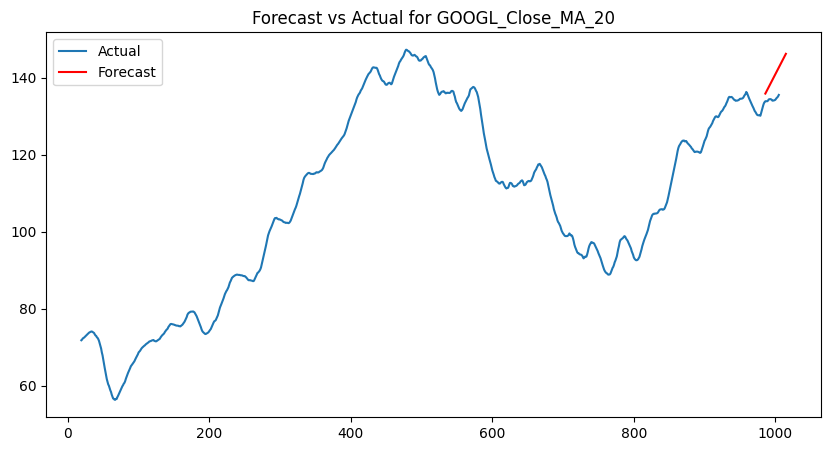

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for GOOGL_Close_MA_50:
 956    133.631163
957    133.667625
958    133.704928
959    133.743018
960    133.781844
961    133.821358
962    133.861515
963    133.902273
964    133.943594
965    133.985440
966    134.027778
967    134.070576
968    134.113804
969    134.157434
970    134.201439
971    134.245796
972    134.290481
973    134.335474
974    134.380754
975    134.426303
976    134.472103
977    134.518137
978    134.564392
979    134.610851
980    134.657503
981    134.704334
982    134.751333
983    134.798489
984    134.845792
985    134.893232
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


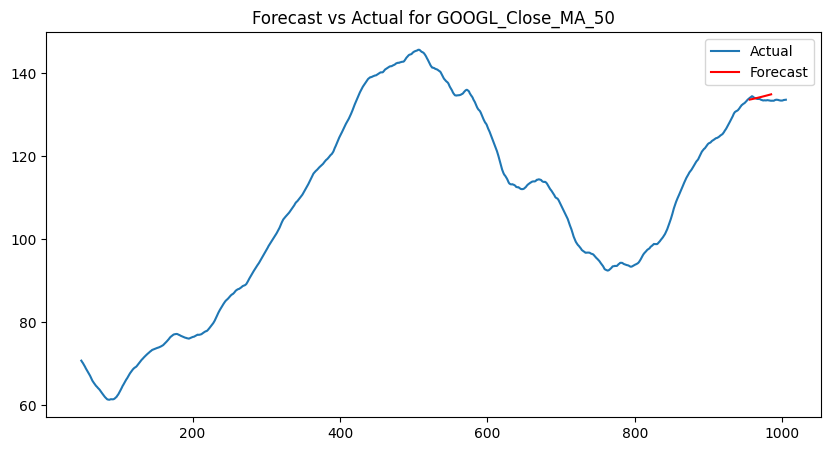

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for GOOGL_Close_MA_100:
 906    133.821027
907    133.905999
908    133.991554
909    134.077512
910    134.163746
911    134.250172
912    134.336729
913    134.423378
914    134.510089
915    134.596843
916    134.683628
917    134.770432
918    134.857251
919    134.944080
920    135.030915
921    135.117756
922    135.204599
923    135.291444
924    135.378291
925    135.465139
926    135.551988
927    135.638838
928    135.725687
929    135.812537
930    135.899387
931    135.986237
932    136.073088
933    136.159938
934    136.246788
935    136.333639
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


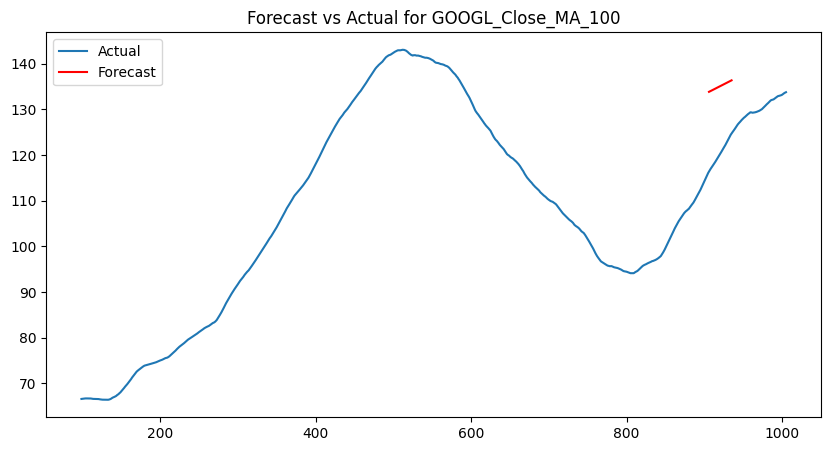

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for META_AdjClose_MA_5:
 1001    355.328489
1002    355.308658
1003    355.342552
1004    355.327763
1005    355.357087
1006    355.346438
1007    355.372012
1008    355.364762
1009    355.387255
1010    355.382796
1011    355.402760
1012    355.400593
1013    355.418480
1014    355.418196
1015    355.434377
1016    355.435638
1017    355.450419
1018    355.452949
1019    355.466580
1020    355.470152
1021    355.482839
1022    355.487266
1023    355.499178
1024    355.504307
1025    355.515583
1026    355.521289
1027    355.532042
1028    355.538222
1029    355.548546
1030    355.555114
Name: predicted_mean, dtype: float64


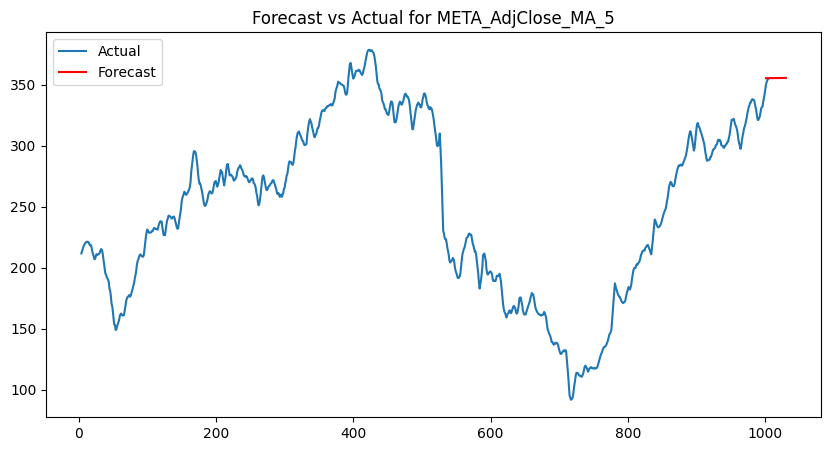

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for META_AdjClose_MA_10:
 996     352.898882
997     354.995842
998     357.098615
999     359.198994
1000    361.300359
1001    363.401319
1002    365.502445
1003    367.603502
1004    369.704588
1005    371.805662
1006    373.906741
1007    376.007818
1008    378.108896
1009    380.209973
1010    382.311051
1011    384.412128
1012    386.513206
1013    388.614283
1014    390.715361
1015    392.816438
1016    394.917516
1017    397.018594
1018    399.119671
1019    401.220749
1020    403.321826
1021    405.422904
1022    407.523981
1023    409.625059
1024    411.726136
1025    413.827214
Name: predicted_mean, dtype: float64


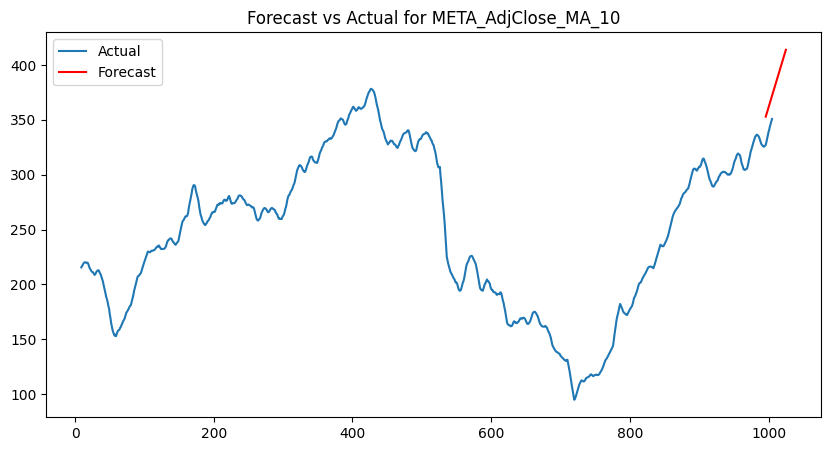

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for META_AdjClose_MA_20:
 986     339.860394
987     341.071244
988     342.223247
989     343.319658
990     344.363549
991     345.357826
992     346.305232
993     347.208359
994     348.069656
995     348.891435
996     349.675882
997     350.425061
998     351.140922
999     351.825309
1000    352.479961
1001    353.106522
1002    353.706546
1003    354.281501
1004    354.832772
1005    355.361670
1006    355.869432
1007    356.357225
1008    356.826155
1009    357.277265
1010    357.711540
1011    358.129911
1012    358.533257
1013    358.922409
1014    359.298153
1015    359.661229
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


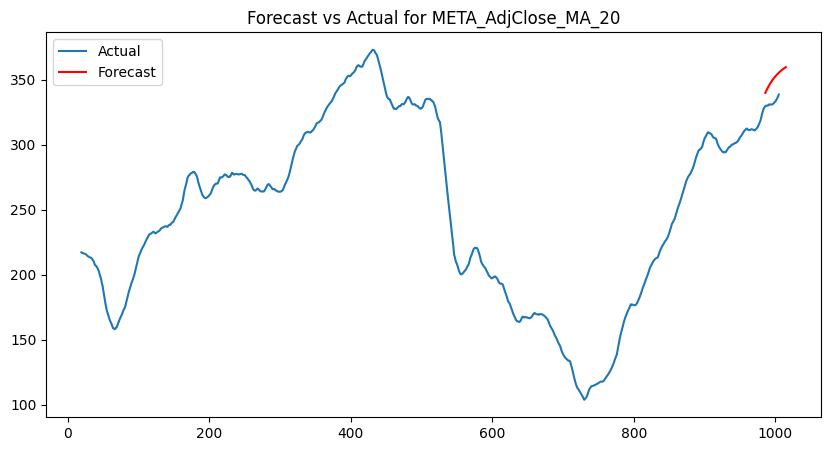

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for META_AdjClose_MA_50:
 956    328.663116
957    329.401519
958    330.139343
959    330.877520
960    331.615482
961    332.353574
962    333.091587
963    333.829648
964    334.567680
965    335.305730
966    336.043769
967    336.781814
968    337.519856
969    338.257900
970    338.995942
971    339.733986
972    340.472028
973    341.210071
974    341.948114
975    342.686157
976    343.424200
977    344.162244
978    344.900287
979    345.638330
980    346.376373
981    347.114416
982    347.852459
983    348.590502
984    349.328545
985    350.066588
Name: predicted_mean, dtype: float64


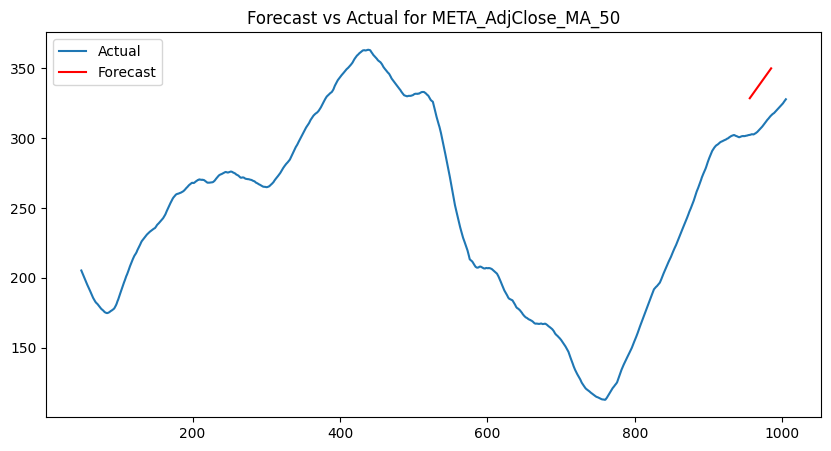

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for META_AdjClose_MA_100:
 906    315.528907
907    315.940824
908    316.352513
909    316.764294
910    317.176039
911    317.587798
912    317.999551
913    318.411307
914    318.823061
915    319.234816
916    319.646571
917    320.058326
918    320.470081
919    320.881836
920    321.293591
921    321.705345
922    322.117100
923    322.528855
924    322.940610
925    323.352365
926    323.764120
927    324.175875
928    324.587630
929    324.999384
930    325.411139
931    325.822894
932    326.234649
933    326.646404
934    327.058159
935    327.469914
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


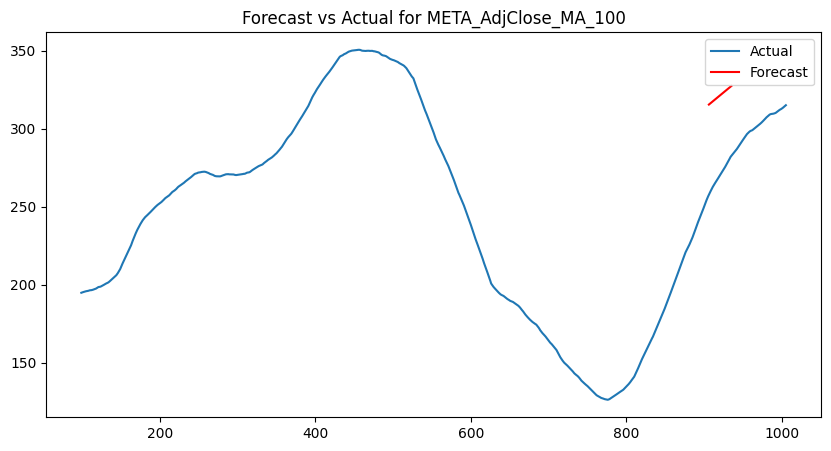

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for META_Open_MA_5:
 1001    358.033712
1002    358.819908
1003    359.465465
1004    360.002058
1005    360.454226
1006    360.840983
1007    361.177061
1008    361.473872
1009    361.740260
1010    361.983077
1011    362.207631
1012    362.418036
1013    362.617477
1014    362.808424
1015    362.992791
1016    363.172058
1017    363.347375
1018    363.519631
1019    363.689515
1020    363.857562
1021    364.024185
1022    364.189705
1023    364.354371
1024    364.518374
1025    364.681865
1026    364.844958
1027    365.007743
1028    365.170290
1029    365.332651
1030    365.494869
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


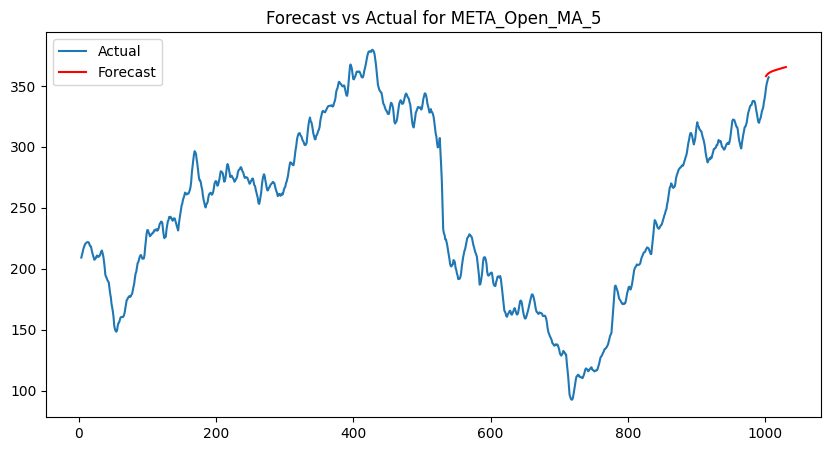

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for META_Open_MA_10:
 996     352.461368
997     354.499782
998     356.343955
999     358.018144
1000    359.543575
1001    360.938824
1002    362.220147
1003    363.401771
1004    364.496146
1005    365.514166
1006    366.465367
1007    367.358092
1008    368.199644
1009    368.996412
1010    369.753990
1011    370.477270
1012    371.170536
1013    371.837536
1014    372.481550
1015    373.105448
1016    373.711741
1017    374.302629
1018    374.880035
1019    375.445643
1020    376.000926
1021    376.547173
1022    377.085512
1023    377.616932
1024    378.142296
1025    378.662360
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


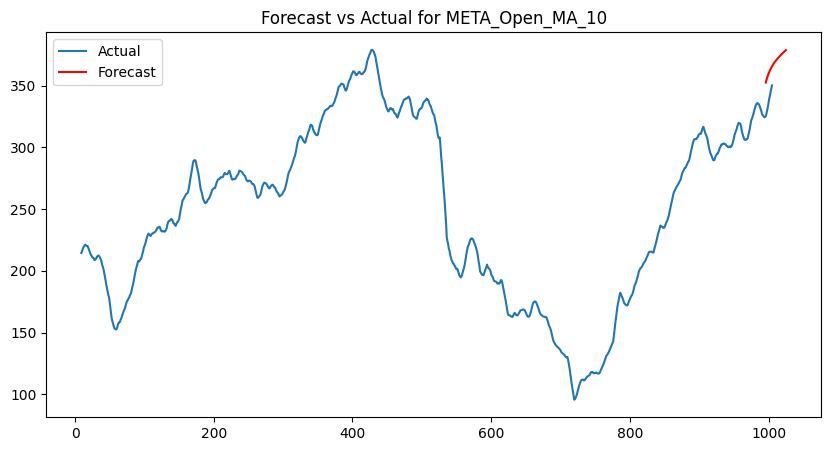

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for META_Open_MA_20:
 986     338.708037
987     339.939439
988     341.113855
989     342.234271
990     343.303515
991     344.324268
992     345.299071
993     346.230330
994     347.120328
995     347.971225
996     348.785070
997     349.563804
998     350.309266
999     351.023200
1000    351.707257
1001    352.363002
1002    352.991919
1003    353.595412
1004    354.174815
1005    354.731388
1006    355.266328
1007    355.780768
1008    356.275783
1009    356.752389
1010    357.211551
1011    357.654183
1012    358.081151
1013    358.493276
1014    358.891335
1015    359.276065
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


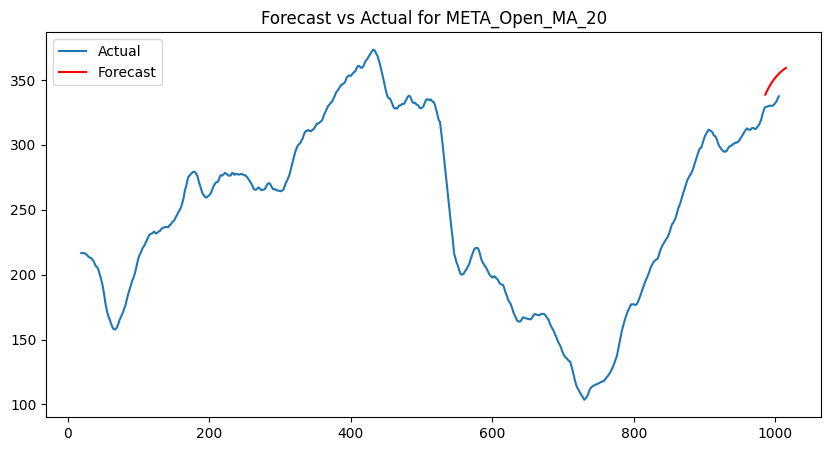

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for META_Open_MA_50:
 956    328.443741
957    329.189759
958    329.934306
959    330.677920
960    331.420943
961    332.163590
962    332.905999
963    333.648258
964    334.390420
965    335.132523
966    335.874586
967    336.616626
968    337.358649
969    338.100663
970    338.842671
971    339.584675
972    340.326676
973    341.068676
974    341.810675
975    342.552673
976    343.294671
977    344.036668
978    344.778665
979    345.520663
980    346.262660
981    347.004657
982    347.746654
983    348.488651
984    349.230648
985    349.972645
Name: predicted_mean, dtype: float64


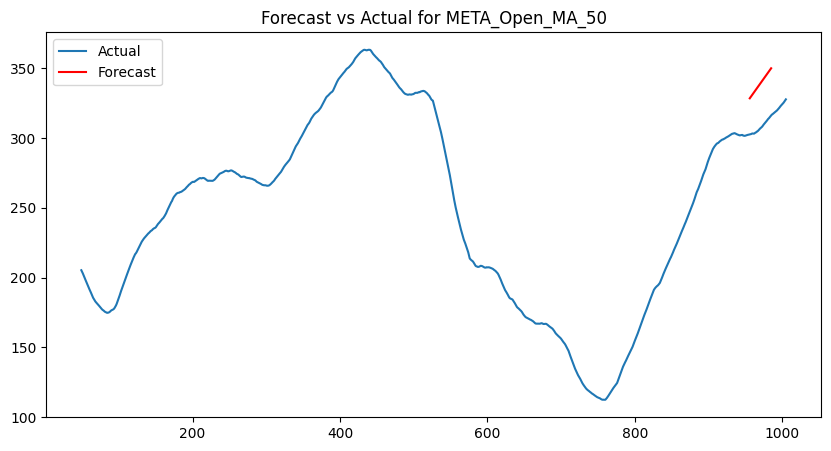

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for META_Open_MA_100:
 906    315.512423
907    315.952882
908    316.391728
909    316.829426
910    317.266305
911    317.702601
912    318.138483
913    318.574068
914    319.009443
915    319.444667
916    319.879785
917    320.314827
918    320.749814
919    321.184762
920    321.619683
921    322.054585
922    322.489472
923    322.924350
924    323.359220
925    323.794086
926    324.228947
927    324.663807
928    325.098664
929    325.533520
930    325.968375
931    326.403230
932    326.838084
933    327.272937
934    327.707791
935    328.142644
Name: predicted_mean, dtype: float64


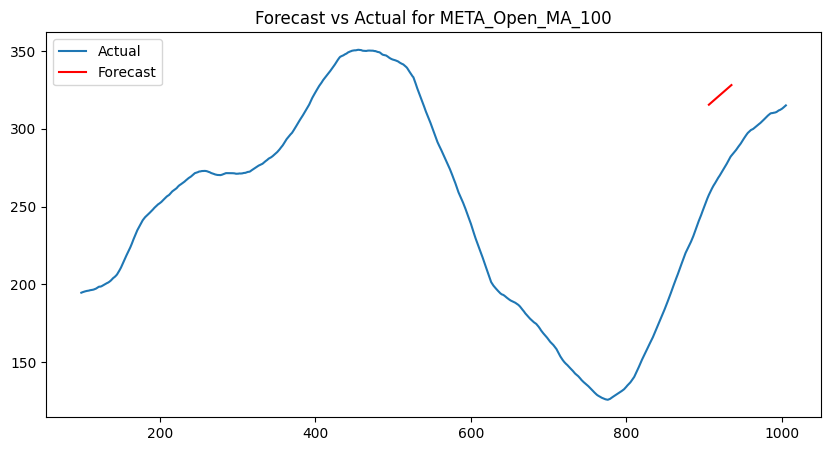

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

Forecast for META_Close_MA_5:
 1001    355.705493
1002    355.685639
1003    355.719565
1004    355.704758
1005    355.734111
1006    355.723447
1007    355.749046
1008    355.741785
1009    355.764299
1010    355.759833
1011    355.779815
1012    355.777643
1013    355.795547
1014    355.795258
1015    355.811455
1016    355.812713
1017    355.827508
1018    355.830037
1019    355.843680
1020    355.847252
1021    355.859951
1022    355.864379
1023    355.876301
1024    355.881433
1025    355.892718
1026    355.898427
1027    355.909189
1028    355.915372
1029    355.925704
1030    355.932277
Name: predicted_mean, dtype: float64


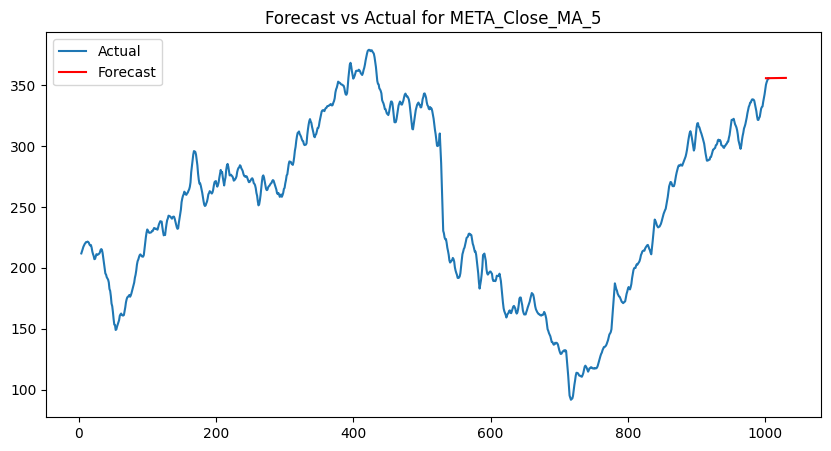

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for META_Close_MA_10:
 996     353.273315
997     355.372500
998     357.477504
999     359.580112
1000    361.683707
1001    363.786896
1002    365.890252
1003    367.993538
1004    370.096854
1005    372.200157
1006    374.303466
1007    376.406772
1008    378.510080
1009    380.613386
1010    382.716694
1011    384.820001
1012    386.923308
1013    389.026615
1014    391.129922
1015    393.233229
1016    395.336536
1017    397.439843
1018    399.543150
1019    401.646457
1020    403.749764
1021    405.853071
1022    407.956378
1023    410.059685
1024    412.162992
1025    414.266299
Name: predicted_mean, dtype: float64


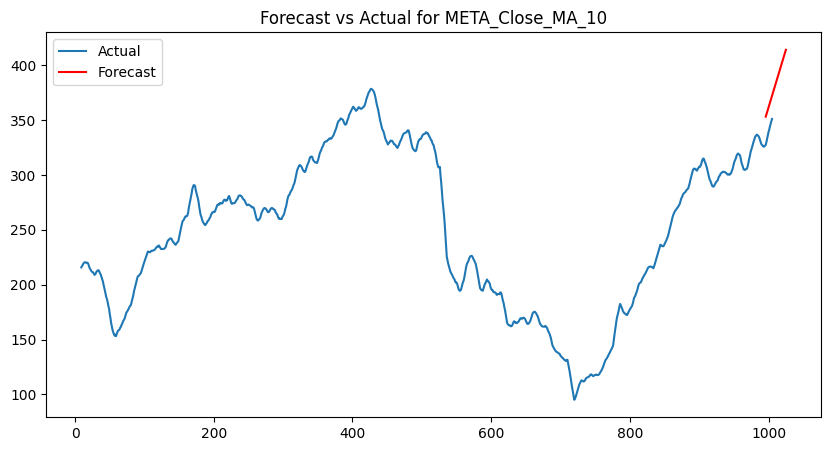

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for META_Close_MA_20:
 986     340.220393
987     341.431361
988     342.582881
989     343.678236
990     344.720531
991     345.712698
992     346.657506
993     347.557573
994     348.415370
995     349.233234
996     350.013370
997     350.757864
998     351.468685
999     352.147693
1000    352.796647
1001    353.417208
1002    354.010943
1003    354.579336
1004    355.123787
1005    355.645618
1006    356.146080
1007    356.626353
1008    357.087553
1009    357.530734
1010    357.956891
1011    358.366966
1012    358.761846
1013    359.142372
1014    359.509337
1015    359.863489
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


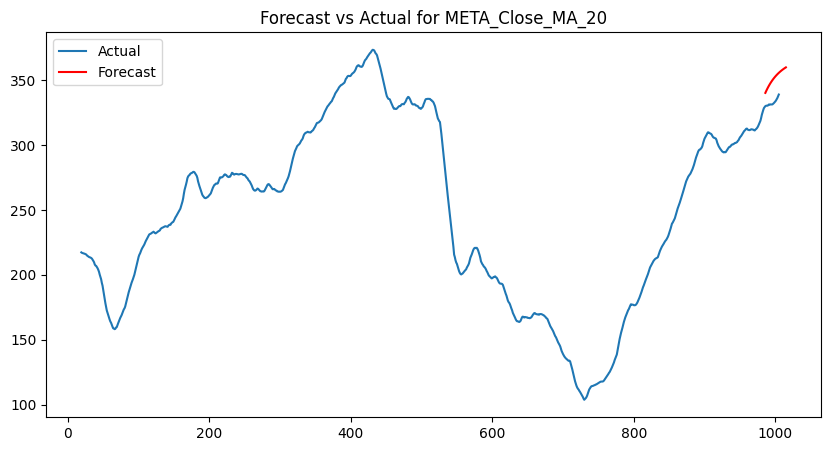

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for META_Close_MA_50:
 956    329.011833
957    329.751020
958    330.489626
959    331.228585
960    331.967330
961    332.706205
962    333.445001
963    334.183845
964    334.922660
965    335.661493
966    336.400314
967    337.139143
968    337.877967
969    338.616794
970    339.355619
971    340.094445
972    340.833271
973    341.572097
974    342.310923
975    343.049749
976    343.788575
977    344.527401
978    345.266226
979    346.005052
980    346.743878
981    347.482704
982    348.221530
983    348.960356
984    349.699182
985    350.438007
Name: predicted_mean, dtype: float64


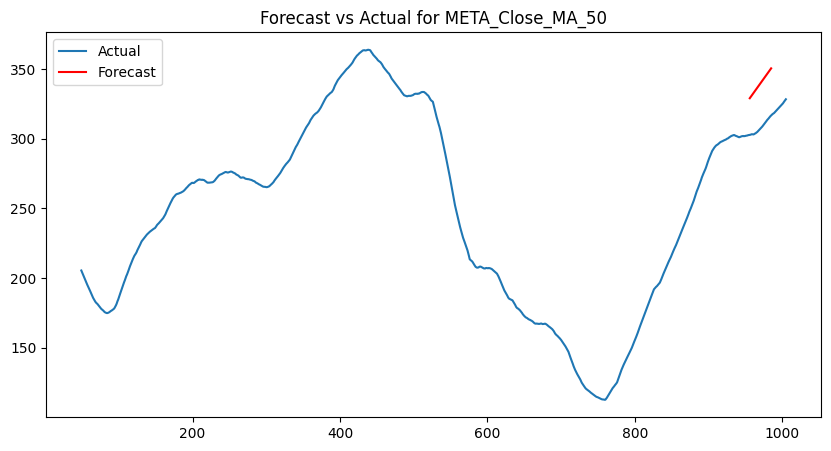

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for META_Close_MA_100:
 906    315.863688
907    316.276042
908    316.688169
909    317.100387
910    317.512569
911    317.924765
912    318.336956
913    318.749148
914    319.161340
915    319.573532
916    319.985724
917    320.397917
918    320.810109
919    321.222301
920    321.634493
921    322.046685
922    322.458877
923    322.871069
924    323.283261
925    323.695453
926    324.107645
927    324.519837
928    324.932030
929    325.344222
930    325.756414
931    326.168606
932    326.580798
933    326.992990
934    327.405182
935    327.817374
Name: predicted_mean, dtype: float64


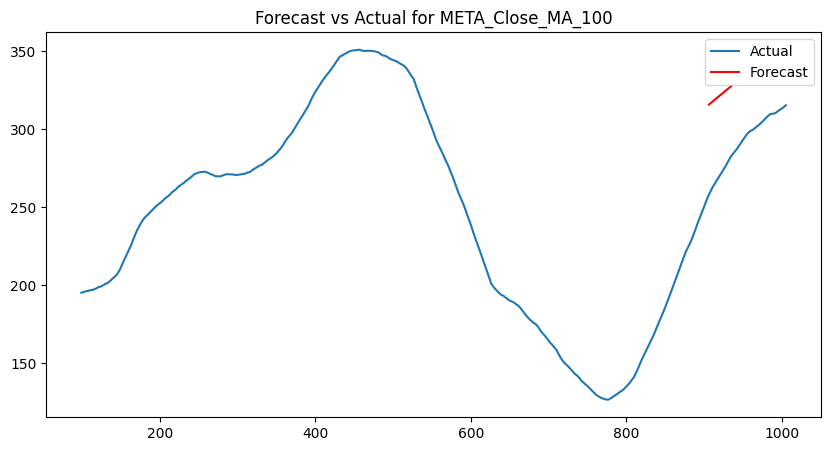

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_AdjClose_MA_5:
 1001    488.983534
1002    488.075416
1003    487.597914
1004    486.722191
1005    486.214731
1006    485.366711
1007    484.833632
1008    484.009305
1009    483.454315
1010    482.650250
1011    482.076523
1012    481.289785
1013    480.700034
1014    479.928115
1015    479.324660
1016    478.565414
1017    477.950239
1018    477.201832
1019    476.576634
1020    475.837495
1021    475.203726
1022    474.472514
1023    473.831414
1024    473.106981
1025    472.459612
1026    471.740977
1027    471.088247
1028    470.374569
1029    469.717254
1030    469.007816
Name: predicted_mean, dtype: float64


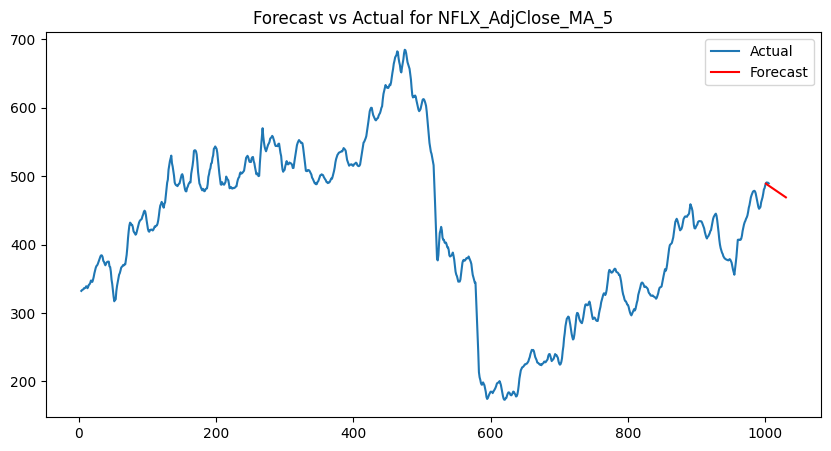

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_AdjClose_MA_10:
 996     489.797621
997     491.473020
998     493.148366
999     494.823711
1000    496.499055
1001    498.174399
1002    499.849743
1003    501.525087
1004    503.200431
1005    504.875775
1006    506.551119
1007    508.226463
1008    509.901807
1009    511.577151
1010    513.252495
1011    514.927839
1012    516.603183
1013    518.278527
1014    519.953871
1015    521.629215
1016    523.304559
1017    524.979903
1018    526.655247
1019    528.330591
1020    530.005935
1021    531.681279
1022    533.356623
1023    535.031967
1024    536.707311
1025    538.382655
Name: predicted_mean, dtype: float64


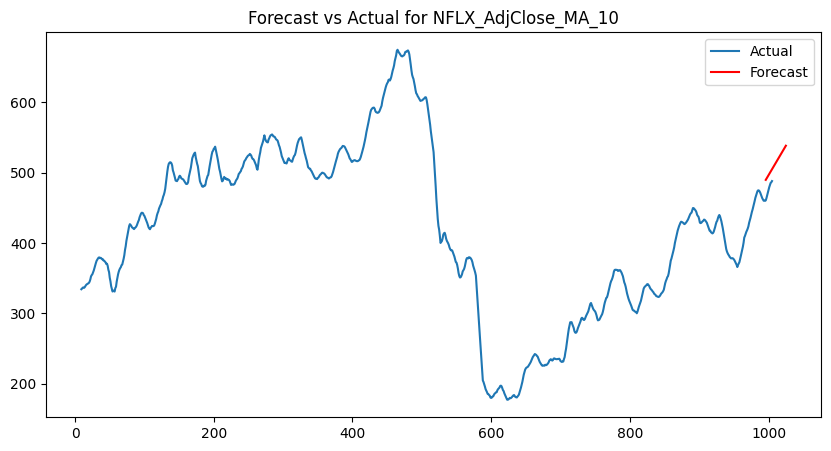

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_AdjClose_MA_20:
 986     474.705883
987     475.352089
988     475.998331
989     476.644565
990     477.290801
991     477.937036
992     478.583272
993     479.229507
994     479.875743
995     480.521979
996     481.168214
997     481.814450
998     482.460685
999     483.106921
1000    483.753156
1001    484.399392
1002    485.045627
1003    485.691863
1004    486.338098
1005    486.984334
1006    487.630570
1007    488.276805
1008    488.923041
1009    489.569276
1010    490.215512
1011    490.861747
1012    491.507983
1013    492.154218
1014    492.800454
1015    493.446689
Name: predicted_mean, dtype: float64


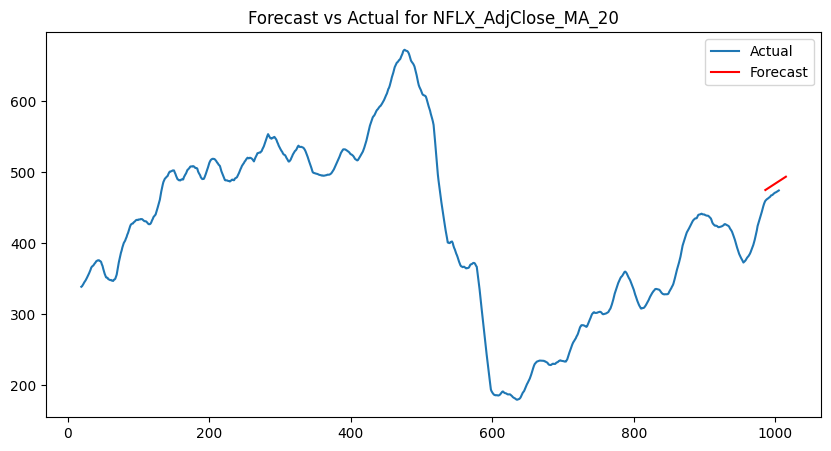

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for NFLX_AdjClose_MA_50:
 956    456.956946
957    459.770216
958    462.548685
959    465.361440
960    468.140416
961    470.952673
962    473.732141
963    476.543912
964    479.323857
965    482.135158
966    484.915567
967    487.726412
968    490.507271
969    493.317672
970    496.098967
971    498.908938
972    501.690658
973    504.500211
974    507.282342
975    510.091489
976    512.874020
977    515.682774
978    518.465692
979    521.274064
980    524.057359
981    526.865360
982    529.649020
983    532.456662
984    535.240676
985    538.047968
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


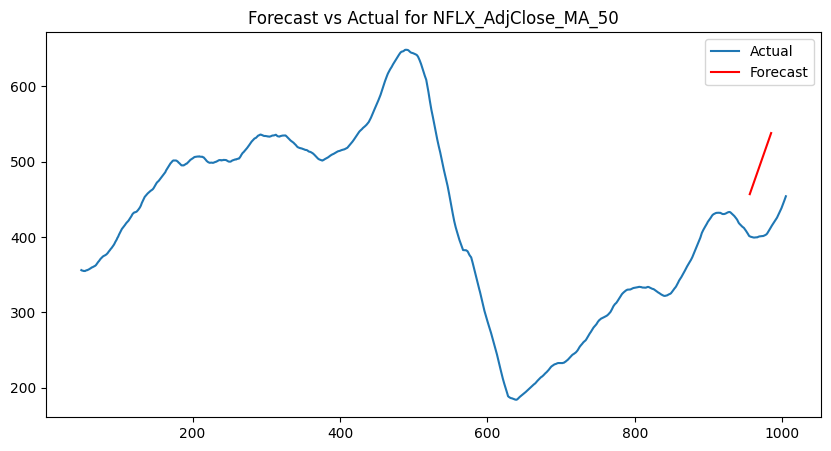

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_AdjClose_MA_100:
 906    428.402005
907    428.887596
908    429.373162
909    429.858736
910    430.344307
911    430.829880
912    431.315451
913    431.801023
914    432.286595
915    432.772167
916    433.257739
917    433.743311
918    434.228883
919    434.714455
920    435.200027
921    435.685599
922    436.171171
923    436.656743
924    437.142315
925    437.627887
926    438.113459
927    438.599031
928    439.084602
929    439.570174
930    440.055746
931    440.541318
932    441.026890
933    441.512462
934    441.998034
935    442.483606
Name: predicted_mean, dtype: float64


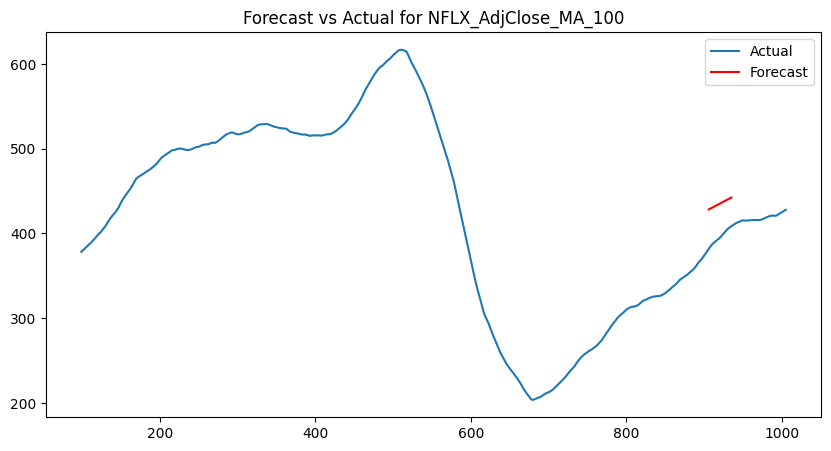

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_Open_MA_5:
 1001    490.921607
1002    490.437977
1003    489.953002
1004    489.467682
1005    488.982273
1006    488.496841
1007    488.011403
1008    487.525964
1009    487.040525
1010    486.555085
1011    486.069646
1012    485.584206
1013    485.098767
1014    484.613327
1015    484.127888
1016    483.642448
1017    483.157008
1018    482.671569
1019    482.186129
1020    481.700690
1021    481.215250
1022    480.729810
1023    480.244371
1024    479.758931
1025    479.273492
1026    478.788052
1027    478.302613
1028    477.817173
1029    477.331733
1030    476.846294
Name: predicted_mean, dtype: float64


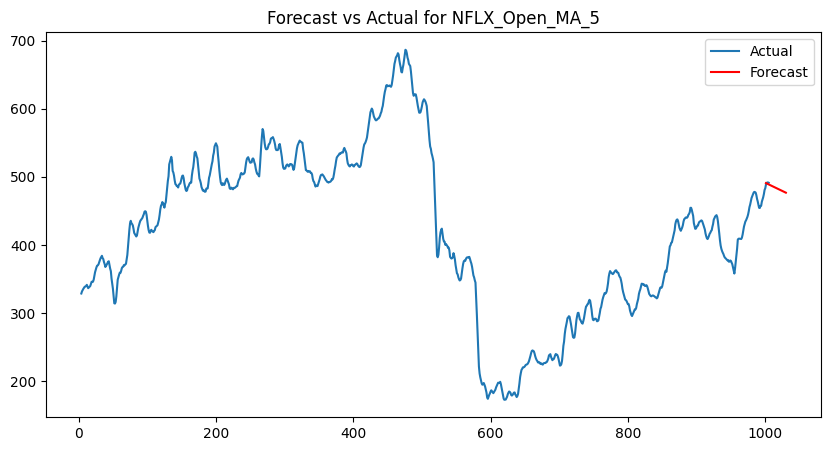

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for NFLX_Open_MA_10:
 996     488.510975
997     489.525496
998     490.658222
999     491.683844
1000    492.806513
1001    493.841248
1002    494.955659
1003    495.997876
1004    497.105507
1005    498.153867
1006    499.255933
1007    500.309336
1008    501.406832
1009    502.464376
1010    503.558120
1011    504.619063
1012    505.709727
1013    506.773461
1014    507.861597
1015    508.927622
1016    510.013681
1017    511.081588
1018    512.165942
1019    513.235393
1020    514.318348
1021    515.389068
1022    516.470873
1023    517.542634
1024    518.623496
1025    519.696112
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


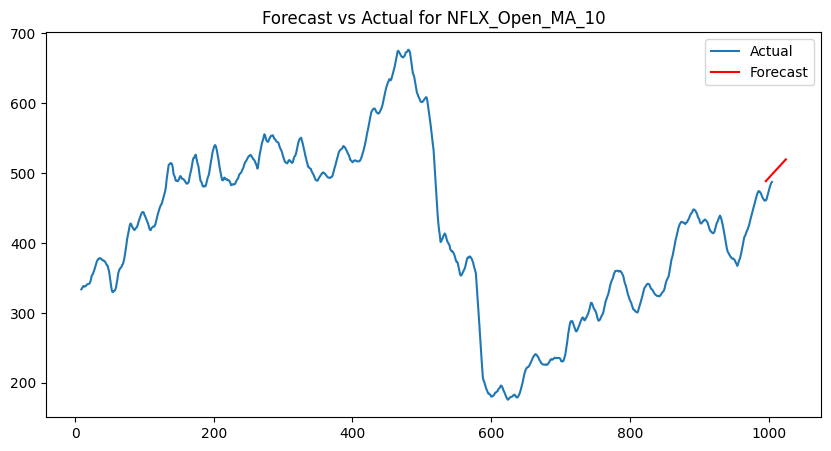

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_Open_MA_20:
 986     475.110152
987     475.868825
988     476.628056
989     477.387490
990     478.146998
991     478.906535
992     479.666081
993     480.425631
994     481.185182
995     481.944734
996     482.704285
997     483.463837
998     484.223389
999     484.982941
1000    485.742493
1001    486.502045
1002    487.261597
1003    488.021149
1004    488.780701
1005    489.540253
1006    490.299805
1007    491.059357
1008    491.818909
1009    492.578461
1010    493.338013
1011    494.097565
1012    494.857117
1013    495.616669
1014    496.376221
1015    497.135773
Name: predicted_mean, dtype: float64


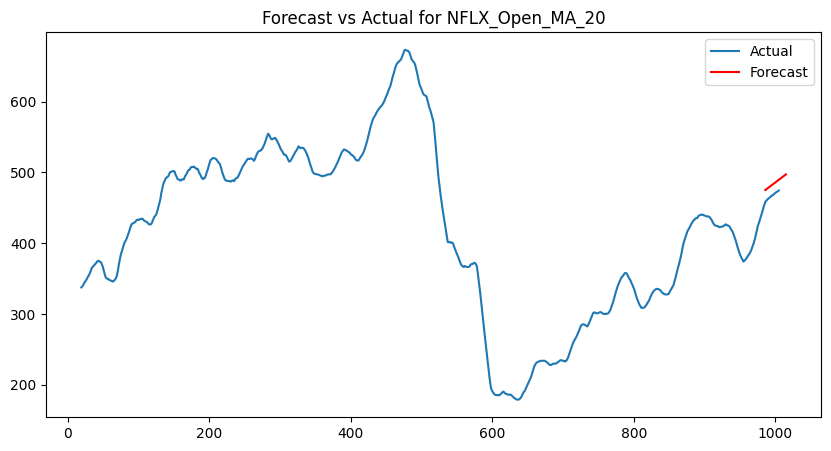

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_Open_MA_50:
 956    456.468284
957    459.262070
958    462.056886
959    464.852208
960    467.647779
961    470.443470
962    473.239222
963    476.035003
964    478.830798
965    481.626600
966    484.422406
967    487.218213
968    490.014021
969    492.809830
970    495.605639
971    498.401448
972    501.197256
973    503.993065
974    506.788874
975    509.584683
976    512.380492
977    515.176301
978    517.972110
979    520.767919
980    523.563728
981    526.359537
982    529.155346
983    531.951155
984    534.746964
985    537.542773
Name: predicted_mean, dtype: float64


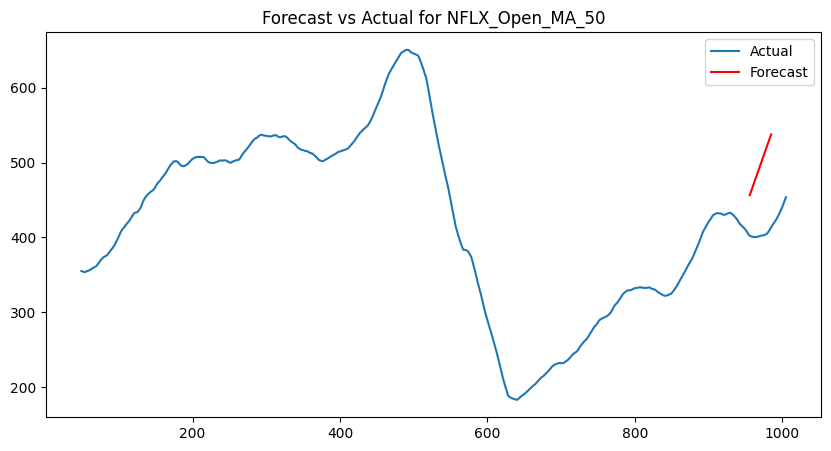

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_Open_MA_100:
 906    428.887155
907    429.387348
908    429.888517
909    430.388790
910    430.889885
911    431.390225
912    431.891260
913    432.391655
914    432.892638
915    433.393082
916    433.894021
917    434.394504
918    434.895406
919    435.395924
920    435.896795
921    436.397341
922    436.898186
923    437.398756
924    437.899579
925    438.400169
926    438.900973
927    439.401581
928    439.902369
929    440.402992
930    440.903766
931    441.404401
932    441.905164
933    442.405809
934    442.906563
935    443.407217
Name: predicted_mean, dtype: float64


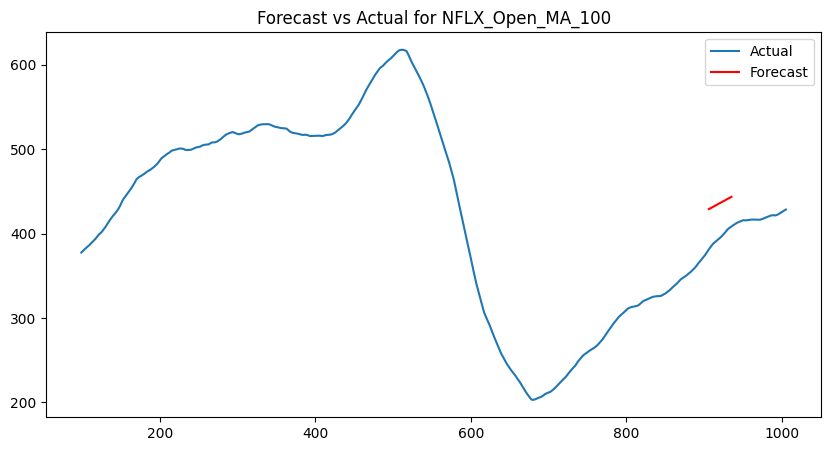

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_Close_MA_5:
 1001    488.983534
1002    488.075416
1003    487.597914
1004    486.722191
1005    486.214731
1006    485.366711
1007    484.833632
1008    484.009305
1009    483.454315
1010    482.650250
1011    482.076523
1012    481.289785
1013    480.700034
1014    479.928115
1015    479.324660
1016    478.565414
1017    477.950239
1018    477.201832
1019    476.576634
1020    475.837495
1021    475.203726
1022    474.472514
1023    473.831414
1024    473.106981
1025    472.459612
1026    471.740977
1027    471.088247
1028    470.374569
1029    469.717254
1030    469.007816
Name: predicted_mean, dtype: float64


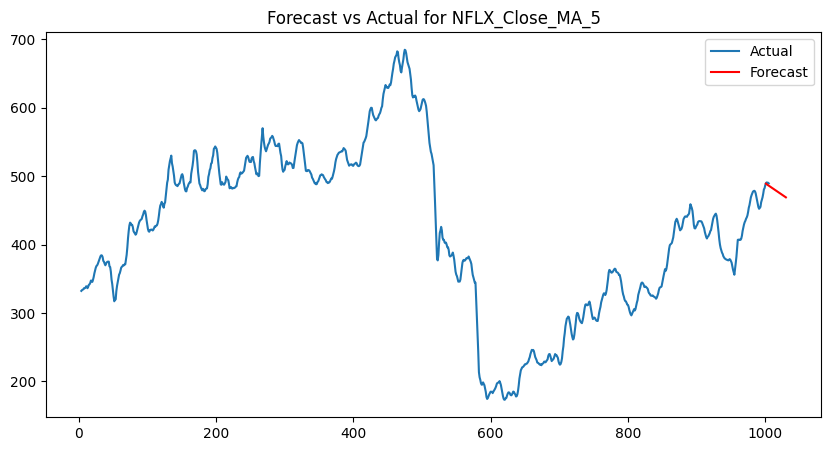

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for NFLX_Close_MA_10:
 996     489.797621
997     491.473020
998     493.148366
999     494.823711
1000    496.499055
1001    498.174399
1002    499.849743
1003    501.525087
1004    503.200431
1005    504.875775
1006    506.551119
1007    508.226463
1008    509.901807
1009    511.577151
1010    513.252495
1011    514.927839
1012    516.603183
1013    518.278527
1014    519.953871
1015    521.629215
1016    523.304559
1017    524.979903
1018    526.655247
1019    528.330591
1020    530.005935
1021    531.681279
1022    533.356623
1023    535.031967
1024    536.707311
1025    538.382655
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


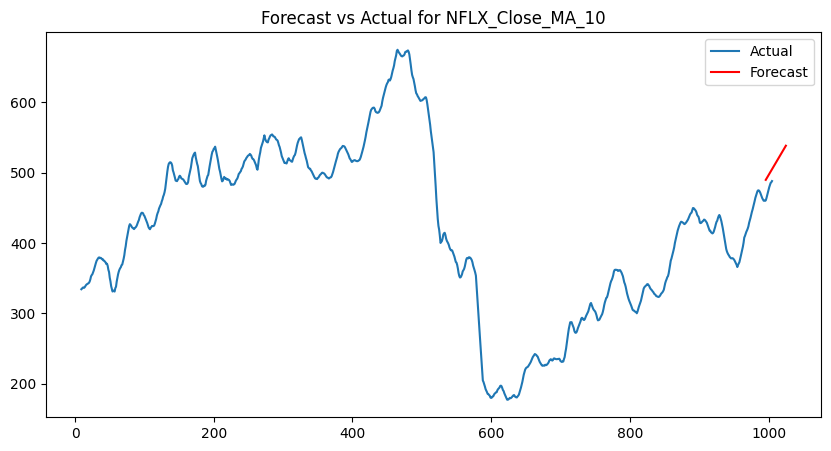

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_Close_MA_20:
 986     474.705883
987     475.352089
988     475.998331
989     476.644565
990     477.290801
991     477.937036
992     478.583272
993     479.229507
994     479.875743
995     480.521979
996     481.168214
997     481.814450
998     482.460685
999     483.106921
1000    483.753156
1001    484.399392
1002    485.045627
1003    485.691863
1004    486.338098
1005    486.984334
1006    487.630570
1007    488.276805
1008    488.923041
1009    489.569276
1010    490.215512
1011    490.861747
1012    491.507983
1013    492.154218
1014    492.800454
1015    493.446689
Name: predicted_mean, dtype: float64


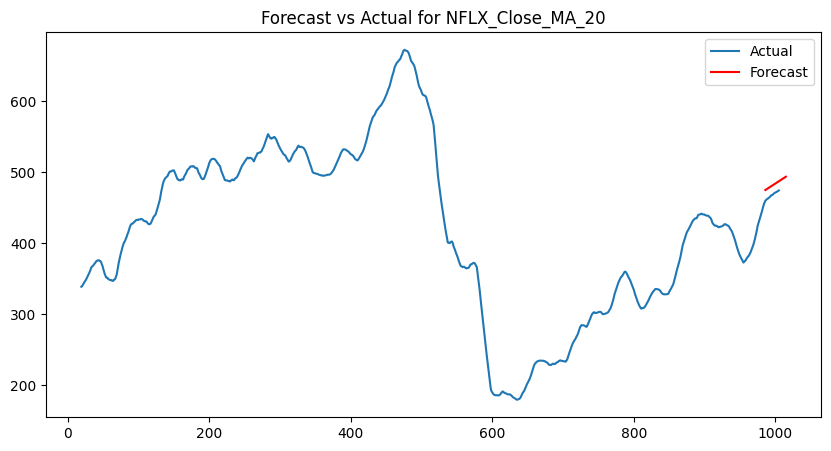

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Forecast for NFLX_Close_MA_50:
 956    456.956946
957    459.770216
958    462.548685
959    465.361440
960    468.140416
961    470.952673
962    473.732141
963    476.543912
964    479.323857
965    482.135158
966    484.915567
967    487.726412
968    490.507271
969    493.317672
970    496.098967
971    498.908938
972    501.690658
973    504.500211
974    507.282342
975    510.091489
976    512.874020
977    515.682774
978    518.465692
979    521.274064
980    524.057359
981    526.865360
982    529.649020
983    532.456662
984    535.240676
985    538.047968
Name: predicted_mean, dtype: float64


C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


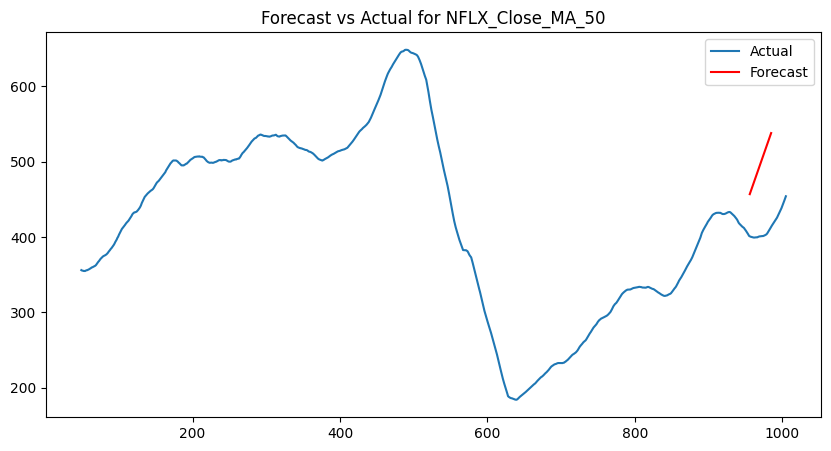

C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\chimi\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

Forecast for NFLX_Close_MA_100:
 906    428.402005
907    428.887596
908    429.373162
909    429.858736
910    430.344307
911    430.829880
912    431.315451
913    431.801023
914    432.286595
915    432.772167
916    433.257739
917    433.743311
918    434.228883
919    434.714455
920    435.200027
921    435.685599
922    436.171171
923    436.656743
924    437.142315
925    437.627887
926    438.113459
927    438.599031
928    439.084602
929    439.570174
930    440.055746
931    440.541318
932    441.026890
933    441.512462
934    441.998034
935    442.483606
Name: predicted_mean, dtype: float64


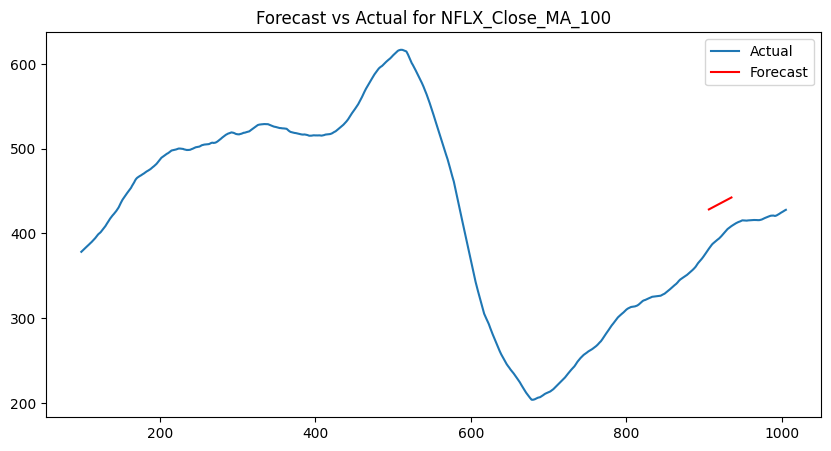

Forecasts have been saved to faang_forecasts.pkl


In [201]:
# Function to fit ARIMA model and forecast
def fit_arima(series, order):
    model = ARIMA(series, order=order)
    model_fit = model.fit()
    return model_fit

# Function to perform differencing and return the differenced series
def difference_series(series):
    return series.diff().dropna()

# Function to invert differencing
def invert_difference(original_series, diff_series):
    forecast = diff_series.copy()
    forecast.iloc[0] = original_series.iloc[-1] + forecast.iloc[0]
    for i in range(1, len(forecast)):
        forecast.iloc[i] = forecast.iloc[i-1] + diff_series.iloc[i]
    return forecast

# Filter to include only 'Open' and 'Close' columns
selected_columns = [col for col in faang_stock_df.columns if 'Open' in col or 'Close' in col]

# Apply differencing and ARIMA model fitting
faang_forecasts = {}

for column in selected_columns:
    # Assume series needs differencing
    series = difference_series(faang_stock_df[column])
    
    # Fit ARIMA model (using (1,1,1) as example order)
    order = (1, 1, 1)
    model_fit = fit_arima(series, order=order)
    
    # Forecasting the next 30 days
    forecast_steps = 30
    forecast_diff = model_fit.forecast(steps=forecast_steps)
    
    # Invert differencing to get the actual forecast
    forecast = invert_difference(faang_stock_df[column], forecast_diff)
    
    faang_forecasts[column] = forecast
    print(f"Forecast for {column}:\n", forecast)
    
    # Plot actual vs forecast
    plt.figure(figsize=(10, 5))
    plt.plot(faang_stock_df[column], label='Actual')
    plt.plot(forecast, label='Forecast', color='red')
    plt.title(f"Forecast vs Actual for {column}")
    plt.legend()
    plt.show()

# Save the forecasts to a pickle file
with open('faang_forecasts.pkl', 'wb') as f:
    pickle.dump(faang_forecasts, f)
    
print("Forecasts have been saved to faang_forecasts.pkl")
